In [1]:
import os
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import torch
import random
from PIL import Image, ImageOps, ImageFilter
from torchvision import transforms
from torch import nn
import torch.nn.functional as F
from torch.utils import data
import time
import copy
from tqdm import tqdm

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print("Using the GPU!")
else:
    print("WARNING: Could not find GPU! Using CPU only")
    print("You may want to try to use the GPU in Google Colab by clicking in:")
    print("Runtime > Change Runtime type > Hardware accelerator > GPU.")

Using the GPU!


Downloading the pacakges of U-net

In [5]:
!pip install git+https://github.com/qubvel/segmentation_models.pytorch
import segmentation_models_pytorch as smp

  Cloning https://github.com/qubvel/segmentation_models.pytorch to /tmp/pip-req-build-_jmub0nq
  Running command git clone -q https://github.com/qubvel/segmentation_models.pytorch /tmp/pip-req-build-_jmub0nq
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


import dataset from mit

In [ ]:
#!wget http://data.csail.mit.edu/places/ADEchallenge/ADEChallengeData2016.zip
#!unzip ADEChallengeData2016.zip && rm ADEChallengeData2016.zip
#!mv /content/ADEChallengeData2016 /content/drive/MyDrive/6.869

In [ ]:
#!unzip ADEChallengeData2016.zip
#!mv /content/ADEChallengeData2016 /content/drive/MyDrive/6.869

In [6]:
TARGET_GOOGLE_DRIVE_DIR = '/content/drive/MyDrive/6.869/ADEChallengeData2016'

Show some images

#Take a Look on Dataset

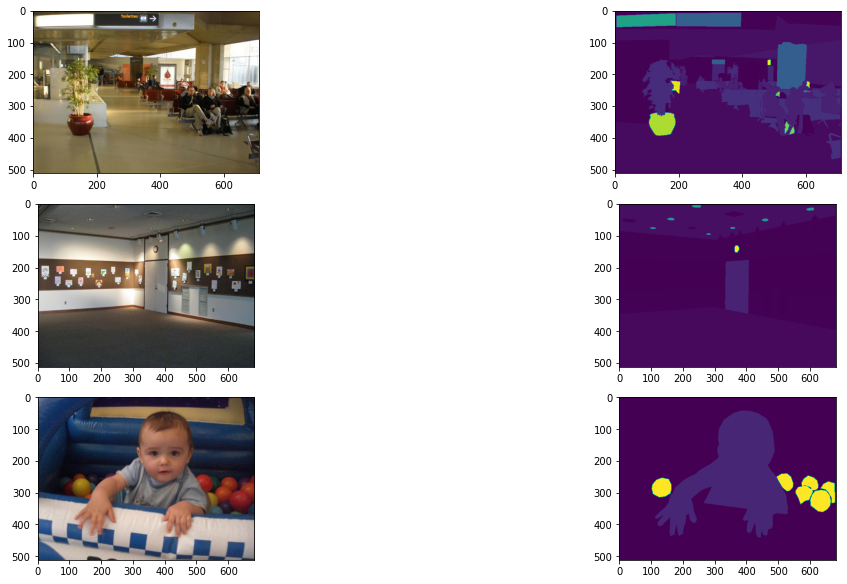

In [ ]:
image_name_list = ["ADE_train_00000002","ADE_train_00000003","ADE_train_00000005"]
fig, axs = plt.subplots(len(image_name_list), 2, figsize=(16, 8), constrained_layout=True)
for i,image_name in enumerate(image_name_list):
  original_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","training",f"{image_name}.jpg")
  label_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR, "annotations", "training", f"{image_name}.png")
  original_img = Image.open(original_image).convert('RGB')
  mask_img = Image.open(label_image)

  axs[i,0].imshow(original_img)
  axs[i,0].grid(False)

  label_image = np.asarray(mask_img)
  axs[i,1].imshow(label_image)
  axs[i,1].grid(False)


In [7]:
class SegmentationDataset(object):
    """Segmentation Base Dataset"""

    def __init__(self, root, split, mode, transform, base_size=520, crop_size=480):
        super(SegmentationDataset, self).__init__()
        self.root = root
        self.transform = transform
        self.split = split
        self.mode = mode if mode is not None else split
        self.base_size = base_size
        self.crop_size = crop_size

    def _val_sync_transform(self, img, mask):
        outsize = self.crop_size
        short_size = outsize
        w, h = img.size
        if w > h:
            oh = short_size
            ow = int(1.0 * w * oh / h)
        else:
            ow = short_size
            oh = int(1.0 * h * ow / w)
        img = img.resize((ow, oh), Image.BILINEAR)
        mask = mask.resize((ow, oh), Image.NEAREST)
        # center crop
        w, h = img.size
        x1 = int(round((w - outsize) / 2.))
        y1 = int(round((h - outsize) / 2.))
        img = img.crop((x1, y1, x1 + outsize, y1 + outsize))
        mask = mask.crop((x1, y1, x1 + outsize, y1 + outsize))
        # final transform
        img, mask = self._img_transform(img), self._mask_transform(mask)
        return img, mask

    def _sync_transform(self, img, mask):
        # random mirror
        if random.random() < 0.5:
            img = img.transpose(Image.FLIP_LEFT_RIGHT)
            mask = mask.transpose(Image.FLIP_LEFT_RIGHT)
        crop_size = self.crop_size
        # random scale (short edge)
        short_size = random.randint(int(self.base_size * 0.5), int(self.base_size * 2.0))
        w, h = img.size
        if h > w:
            ow = short_size
            oh = int(1.0 * h * ow / w)
        else:
            oh = short_size
            ow = int(1.0 * w * oh / h)
        img = img.resize((ow, oh), Image.BILINEAR)
        mask = mask.resize((ow, oh), Image.NEAREST)
        # pad crop
        if short_size < crop_size:
            padh = crop_size - oh if oh < crop_size else 0
            padw = crop_size - ow if ow < crop_size else 0
            img = ImageOps.expand(img, border=(0, 0, padw, padh), fill=0)
            mask = ImageOps.expand(mask, border=(0, 0, padw, padh), fill=0)
        # random crop crop_size
        w, h = img.size
        x1 = random.randint(0, w - crop_size)
        y1 = random.randint(0, h - crop_size)
        img = img.crop((x1, y1, x1 + crop_size, y1 + crop_size))
        mask = mask.crop((x1, y1, x1 + crop_size, y1 + crop_size))
        # gaussian blur as in PSP
        if random.random() < 0.5:
            img = img.filter(ImageFilter.GaussianBlur(radius=random.random()))
        # final transform
        img, mask = self._img_transform(img), self._mask_transform(mask)
        return img, mask

    def _img_transform(self, img):
        return np.array(img)

    def _mask_transform(self, mask):
        return np.array(mask).astype('int32')

    @property
    def num_class(self):
        """Number of categories."""
        return self.NUM_CLASS

    @property
    def pred_offset(self):
        return 0

In [8]:

class ADE20KSegmentation(SegmentationDataset):
    """ADE20K Semantic Segmentation Dataset.
    Parameters
    ----------
    root : string
        Path to ADE20K folder. Default is './datasets/ade'
    split: string
        'train', 'val' or 'test'
    transform : callable, optional
        A function that transforms the image
    Examples
    --------
    >>> from torchvision import transforms
    >>> import torch.utils.data as data
    >>> # Transforms for Normalization
    >>> input_transform = transforms.Compose([
    >>>     transforms.ToTensor(),
    >>>     transforms.Normalize((.485, .456, .406), (.229, .224, .225)),
    >>> ])
    >>> # Create Dataset
    >>> trainset = ADE20KSegmentation(split='train', transform=input_transform)
    >>> # Create Training Loader
    >>> train_data = data.DataLoader(
    >>>     trainset, 4, shuffle=True,
    >>>     num_workers=4)
    """
    BASE_DIR = 'ADEChallengeData2016'
    NUM_CLASS = 150

    def __init__(self, root='/content/drive/MyDrive/6.869', split='train', mode=None, transform=None, **kwargs):
        super(ADE20KSegmentation, self).__init__(root, split, mode, transform, **kwargs)
        root = os.path.join(root, self.BASE_DIR)
        self.images, self.masks = _get_ade20k_pairs(root, split)
        assert (len(self.images) == len(self.masks))
        if len(self.images) == 0:
            raise RuntimeError("Found 0 images in subfolders of:" + root + "\n")
        print('Found {} images in the folder {}'.format(len(self.images), root))

    def __getitem__(self, index):
        img = Image.open(self.images[index]).convert('RGB')
        if self.mode == 'test':
            img = self._img_transform(img)
            if self.transform is not None:
                img = self.transform(img)
            return img, os.path.basename(self.images[index])
        mask = Image.open(self.masks[index])
        # synchrosized transform
        if self.mode == 'train':
            img, mask = self._sync_transform(img, mask)
        elif self.mode == 'val':
            img, mask = self._val_sync_transform(img, mask)
        else:
            assert self.mode == 'testval'
            img, mask = self._img_transform(img), self._mask_transform(mask)
        # general resize, normalize and to Tensor
        if self.transform is not None:
            img = self.transform(img)
        return img, mask, os.path.basename(self.images[index])

    def _mask_transform(self, mask):
        return torch.LongTensor(np.array(mask).astype('int32') - 1)

    def __len__(self):
        return len(self.images)

    @property
    def pred_offset(self):
        return 1

    @property
    def classes(self):
        """Category names."""
        return ("wall", "building, edifice", "sky", "floor, flooring", "tree",
                "ceiling", "road, route", "bed", "windowpane, window", "grass",
                "cabinet", "sidewalk, pavement",
                "person, individual, someone, somebody, mortal, soul",
                "earth, ground", "door, double door", "table", "mountain, mount",
                "plant, flora, plant life", "curtain, drape, drapery, mantle, pall",
                "chair", "car, auto, automobile, machine, motorcar",
                "water", "painting, picture", "sofa, couch, lounge", "shelf",
                "house", "sea", "mirror", "rug, carpet, carpeting", "field", "armchair",
                "seat", "fence, fencing", "desk", "rock, stone", "wardrobe, closet, press",
                "lamp", "bathtub, bathing tub, bath, tub", "railing, rail", "cushion",
                "base, pedestal, stand", "box", "column, pillar", "signboard, sign",
                "chest of drawers, chest, bureau, dresser", "counter", "sand", "sink",
                "skyscraper", "fireplace, hearth, open fireplace", "refrigerator, icebox",
                "grandstand, covered stand", "path", "stairs, steps", "runway",
                "case, display case, showcase, vitrine",
                "pool table, billiard table, snooker table", "pillow",
                "screen door, screen", "stairway, staircase", "river", "bridge, span",
                "bookcase", "blind, screen", "coffee table, cocktail table",
                "toilet, can, commode, crapper, pot, potty, stool, throne",
                "flower", "book", "hill", "bench", "countertop",
                "stove, kitchen stove, range, kitchen range, cooking stove",
                "palm, palm tree", "kitchen island",
                "computer, computing machine, computing device, data processor, "
                "electronic computer, information processing system",
                "swivel chair", "boat", "bar", "arcade machine",
                "hovel, hut, hutch, shack, shanty",
                "bus, autobus, coach, charabanc, double-decker, jitney, motorbus, "
                "motorcoach, omnibus, passenger vehicle",
                "towel", "light, light source", "truck, motortruck", "tower",
                "chandelier, pendant, pendent", "awning, sunshade, sunblind",
                "streetlight, street lamp", "booth, cubicle, stall, kiosk",
                "television receiver, television, television set, tv, tv set, idiot "
                "box, boob tube, telly, goggle box",
                "airplane, aeroplane, plane", "dirt track",
                "apparel, wearing apparel, dress, clothes",
                "pole", "land, ground, soil",
                "bannister, banister, balustrade, balusters, handrail",
                "escalator, moving staircase, moving stairway",
                "ottoman, pouf, pouffe, puff, hassock",
                "bottle", "buffet, counter, sideboard",
                "poster, posting, placard, notice, bill, card",
                "stage", "van", "ship", "fountain",
                "conveyer belt, conveyor belt, conveyer, conveyor, transporter",
                "canopy", "washer, automatic washer, washing machine",
                "plaything, toy", "swimming pool, swimming bath, natatorium",
                "stool", "barrel, cask", "basket, handbasket", "waterfall, falls",
                "tent, collapsible shelter", "bag", "minibike, motorbike", "cradle",
                "oven", "ball", "food, solid food", "step, stair", "tank, storage tank",
                "trade name, brand name, brand, marque", "microwave, microwave oven",
                "pot, flowerpot", "animal, animate being, beast, brute, creature, fauna",
                "bicycle, bike, wheel, cycle", "lake",
                "dishwasher, dish washer, dishwashing machine",
                "screen, silver screen, projection screen",
                "blanket, cover", "sculpture", "hood, exhaust hood", "sconce", "vase",
                "traffic light, traffic signal, stoplight", "tray",
                "ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, "
                "dustbin, trash barrel, trash bin",
                "fan", "pier, wharf, wharfage, dock", "crt screen",
                "plate", "monitor, monitoring device", "bulletin board, notice board",
                "shower", "radiator", "glass, drinking glass", "clock", "flag")


def _get_ade20k_pairs(folder, mode='train'):
    img_paths = []
    mask_paths = []
    if mode == 'train':
        img_folder = os.path.join(folder, 'images/training')
        mask_folder = os.path.join(folder, 'annotations/training')
    else:
        img_folder = os.path.join(folder, 'images/validation')
        mask_folder = os.path.join(folder, 'annotations/validation')
    for filename in os.listdir(img_folder):
        basename, _ = os.path.splitext(filename)
        if filename.endswith(".jpg"):
            imgpath = os.path.join(img_folder, filename)
            maskname = basename + '.png'
            maskpath = os.path.join(mask_folder, maskname)
            if os.path.isfile(maskpath):
                img_paths.append(imgpath)
                mask_paths.append(maskpath)
            else:
                print('cannot find the mask:', maskpath)

    return img_paths, mask_paths


if __name__ == '__main__':
    train_dataset = ADE20KSegmentation()

Found 20210 images in the folder /content/drive/MyDrive/6.869/ADEChallengeData2016


Fully Convolutional Networks

In [9]:
FCN_model = torch.hub.load('pytorch/vision:v0.10.0', 'fcn_resnet50', pretrained=True)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


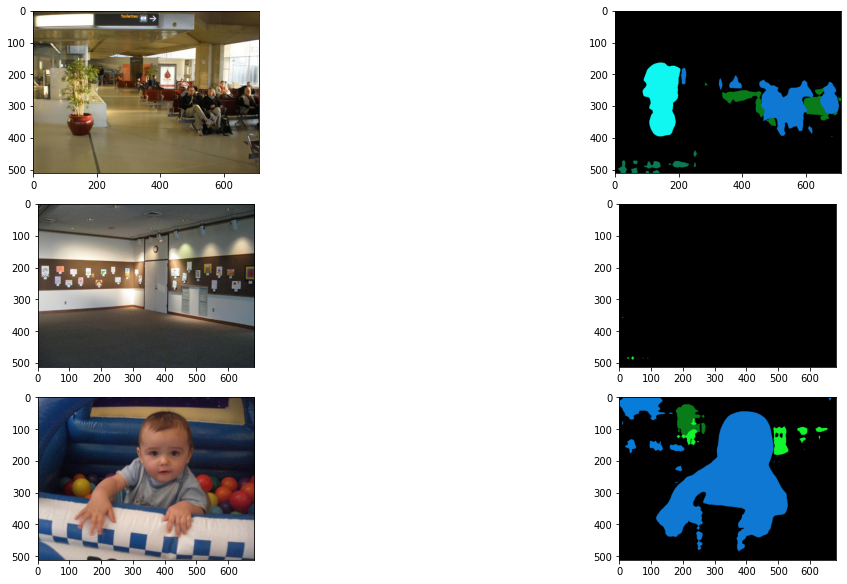

In [ ]:
image_name_list = ["ADE_train_00000002","ADE_train_00000003","ADE_train_00000005"]

preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

FCN_model.to('cuda')
fig, axs = plt.subplots(len(image_name_list), 2, figsize=(16, 8), constrained_layout=True)

for i,image_name in enumerate(image_name_list):
  input_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","training",f"{image_name}.jpg")
  input_image = Image.open(input_image).convert('RGB')

  input_tensor = preprocess(input_image)
  #add batch dimension
  input_batch = input_tensor.unsqueeze(0)


  input_batch = input_batch.to('cuda')

  with torch.no_grad():
    output = FCN_model(input_batch)['out'][0]
  output_predictions = output.argmax(0)

  palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
  colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
  colors = (colors % 255).numpy().astype("uint8")

# plot the semantic segmentation predictions of 21 classes in each color
  r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
  r.putpalette(colors)
  axs[i,0].imshow(input_image)
  axs[i,1].imshow(r)

In [10]:
new_FCN_model = FCN_model
new_FCN_model.classifier[4] = nn.Conv2d(512, 150, kernel_size=(1, 1), stride=(1, 1))
print(new_FCN_model.classifier)

FCNHead(
  (0): Conv2d(2048, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Dropout(p=0.1, inplace=False)
  (4): Conv2d(512, 150, kernel_size=(1, 1), stride=(1, 1))
)


In [11]:
new_FCN_model.aux_classifier[4] = nn.Conv2d(256, 150, kernel_size=(1, 1), stride=(1, 1))
print(new_FCN_model.classifier)

FCNHead(
  (0): Conv2d(2048, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Dropout(p=0.1, inplace=False)
  (4): Conv2d(512, 150, kernel_size=(1, 1), stride=(1, 1))
)


evaluate the initial new fcn no train, better than deeplabv3

In [ ]:
new_FCN_model.to(device)
evaluate_model(new_FCN_model,loss_f,validation_dataloader)

  0%|          | 1/500 [00:05<42:20,  5.09s/it]

initial validation loss:  4.945809364318848
initial validation IOU:  0.31122272109783977


 20%|██        | 100/500 [06:27<25:29,  3.82s/it]

validation loss per 100 itr 4.618421127796173
validation mean IOU per 100 itr:  0.25687656975401835


 40%|████      | 200/500 [13:03<19:13,  3.84s/it]

validation loss per 100 itr 4.618012337684632
validation mean IOU per 100 itr:  0.28908111051963437


 60%|██████    | 300/500 [19:27<12:44,  3.82s/it]

validation loss per 100 itr 4.619783692359924
validation mean IOU per 100 itr:  0.2495241875445528


 80%|████████  | 400/500 [25:51<06:26,  3.87s/it]

validation loss per 100 itr 4.594631745815277
validation mean IOU per 100 itr:  0.2800314275501664


100%|██████████| 500/500 [32:19<00:00,  3.88s/it]

validation loss per 100 itr 4.530580315589905
validation mean IOU per 100 itr:  0.34238940719571126
final mean IOU:  0.2835805405128165
test loss:  4.5962858438491825


(4.5962858438491825, 0.2835805405128165)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


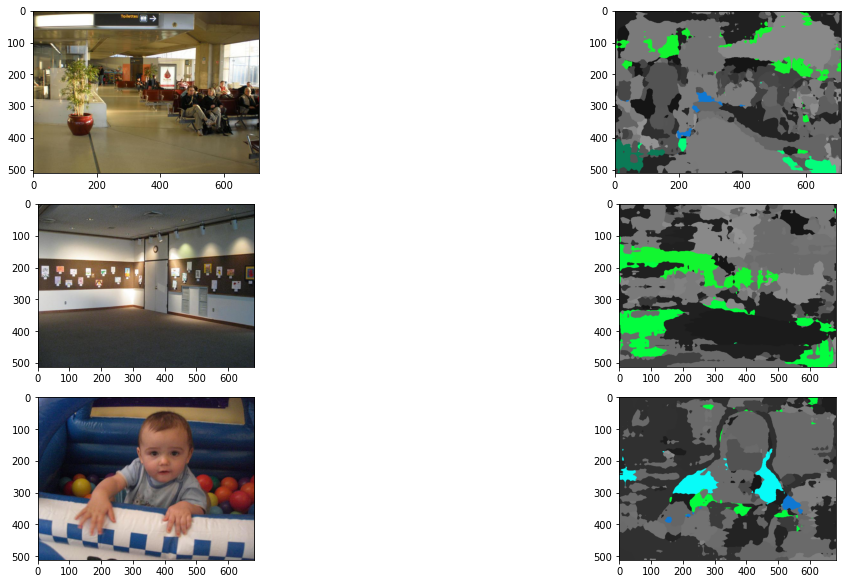

In [ ]:
image_name_list = ["ADE_train_00000002","ADE_train_00000003","ADE_train_00000005"]
preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
new_FCN_model.to('cuda')
fig, axs = plt.subplots(len(image_name_list), 2, figsize=(16, 8), constrained_layout=True)

for i,image_name in enumerate(image_name_list):
  input_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","training",f"{image_name}.jpg")
  input_image = Image.open(input_image).convert('RGB')

  input_tensor = preprocess(input_image)
  input_batch = input_tensor.unsqueeze(0)


  input_batch = input_batch.to('cuda')

  with torch.no_grad():
    output = new_FCN_model(input_batch)
    print(type(output))
    print(output['out'].shape)
    output = output['out'][0]
  output_predictions = output.argmax(0)

  palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
  colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
  colors = (colors % 255).numpy().astype("uint8")

# plot the semantic segmentation predictions of 21 classes in each color
  r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
  r.putpalette(colors)
  axs[i,0].imshow(input_image)
  axs[i,1].imshow(r)

In [12]:
#retrain the model
image_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.CenterCrop(480)
])


In [13]:
trainset = ADE20KSegmentation(split='train', transform=image_transform)
validationset = ADE20KSegmentation(split='val', transform=image_transform)
testset = ADE20KSegmentation(split='test', transform=image_transform)

Found 20210 images in the folder /content/drive/MyDrive/6.869/ADEChallengeData2016
Found 2000 images in the folder /content/drive/MyDrive/6.869/ADEChallengeData2016
Found 2000 images in the folder /content/drive/MyDrive/6.869/ADEChallengeData2016


In [14]:
# Create Training Loader
train_dataloader = data.DataLoader(
    trainset, batch_size = 4, shuffle=True,
    num_workers=2)
validation_dataloader = data.DataLoader(
    validationset,batch_size = 4, shuffle=True,
    num_workers=2
)
test_dataloader = data.DataLoader(
    testset, batch_size = 4, shuffle=True,
    num_workers = 2
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  """
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Feature batch shape: torch.Size([8, 3, 480, 480])
Labels batch shape: torch.Size([8, 480, 480])


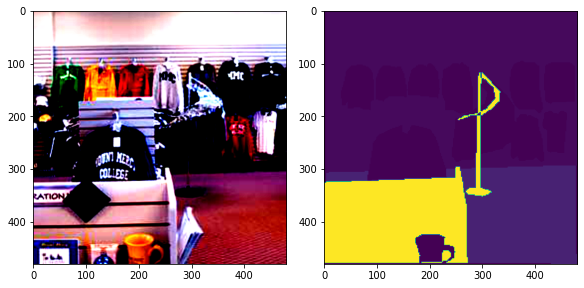

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(8, 4), constrained_layout=True)
train_data= next(iter(train_dataloader))
print(f"Feature batch shape: {train_data[0].size()}")
print(f"Labels batch shape: {train_data[1].size()}")
train_image = torch.tensor(train_data[0][0, :, :, :]).permute(1,2,0)
axs[0].imshow(train_image)
semantic_image = train_data[1][0,:,:]
axs[1].imshow(semantic_image)

#Basic Helper Functions

In [15]:
def visualize_performance_on_sample_image(model,dataset = "training",index = 0):
  if dataset == "training":
    if index == 0:
      image_name_list = ["ADE_train_00000002","ADE_train_00000003","ADE_train_00000005"]
    else:
      image_name_list = ["ADE_train_00000009","ADE_train_00000007","ADE_train_00000008"]
  else:
    if index == 0:
      image_name_list = ["ADE_val_00000002","ADE_val_00000003","ADE_val_00000005"]
    else:
      image_name_list = ["ADE_val_00000009","ADE_val_00000007","ADE_val_00000008"]
  preprocess = transforms.Compose([
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
  model.to('cuda')
  fig, axs = plt.subplots(len(image_name_list), 2, figsize=(16, 8), constrained_layout=True)

  for i,image_name in enumerate(image_name_list):
    if dataset == "training":
      input_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","training",f"{image_name}.jpg")
    else:
      input_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","validation",f"{image_name}.jpg")
    input_image = Image.open(input_image).convert('RGB')

    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0)


    input_batch = input_batch.to('cuda')

    with torch.no_grad():
      output = model(input_batch)
      print(type(output))
      print(output['out'].shape)
      output = output['out'][0]
    output_predictions = output.argmax(0)

    #palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
    #colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
    #colors = (colors % 255).numpy().astype("uint8")

# plot the semantic segmentation predictions of 21 classes in each color
    r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
    #r.putpalette(colors)
    axs[i,0].imshow(input_image)
    axs[i,1].imshow(r)

In [16]:
def one_hot_encoding(label,label_values = range(150)):
  semantic_map = []
  for i in label_values:
    class_map = (label == i)*1
    semantic_map.append(class_map)
  mask_coded = np.stack(semantic_map,axis = -1)
  mask_coded = torch.tensor(mask_coded)
  mask_coded = mask_coded.permute(0,3,1,2)
  return mask_coded

In [17]:
def IoU_compute(output,label,num_classes = 150):
  output = torch.argmax(output, dim=1).squeeze(1)
  output = output.view(-1)
  label = label.view(-1)

  iou_list = []
  present_iou_list = []

  for semantic_class in range(num_classes):
    output_inds = (output == semantic_class)
    label_inds = (label == semantic_class)
    if label_inds.long().sum().item() == 0:
      iou_now = float('nan')
    else:
      intersection_now = (output_inds[label_inds]).long().sum().item()
      union_now = label_inds.long().sum().item() + output_inds.long().sum().item() - intersection_now
      iou_now = float(intersection_now) / float(union_now)
      present_iou_list.append(iou_now)
    iou_list.append(iou_now)
    if len(present_iou_list) == 0:
      avg_iou = 0
    else:
      avg_iou = np.mean(present_iou_list)*100
  return avg_iou

In [18]:
def class_IoU_compute(output,label,num_classes = 150):
  output = torch.argmax(output, dim=1).squeeze(1)
  output = output.view(-1)
  label = label.view(-1)

  class_iou_list = []

  for semantic_class in range(num_classes):
    output_inds = (output == semantic_class)
    label_inds = (label == semantic_class)
    if label_inds.long().sum().item() == 0:
      iou_now = float('nan')
    else:
      intersection_now = (output_inds[label_inds]).long().sum().item()
      union_now = label_inds.long().sum().item() + output_inds.long().sum().item() - intersection_now
      iou_now = float(intersection_now) / float(union_now)
    class_iou_list.append(iou_now)
  return class_iou_list

In [19]:
def compute_classification_accuracy(output,label):
  output_predictions = output.argmax(1)
  output_predictions = output.argmax(1)
  output_predictions = output_predictions.reshape(-1,1)
  output_predictions = output_predictions.squeeze(1)
  label = label.reshape(-1,1)
  label = label.squeeze(1)
  mean = (label == output_predictions).sum()/len(output_predictions)
  return mean

In [20]:
optimizer = torch.optim.SGD(new_FCN_model.parameters(), lr=0.001, momentum=0.9)
loss_f = nn.CrossEntropyLoss()
def train_model(model,train_dataloader,validation_dataloader,optimizer,loss_f,num_epochs):
  since = time.time()
  train_loss = []
  running_loss = 0.0

  for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch + 1, num_epochs))
    print('-' * 10)
    train_loss_per_100_itr = 0
    training_mean_iou_total = 0
    training_mean_iou_per_100_itr = 0

    for i in tqdm(range(2000)):
    #for i,input_pairs in enumerate(train_dataloader):
      input_pairs = next(iter(train_dataloader))
      train_data = input_pairs[0]
      semantic_label = input_pairs[1]
      train_data = train_data.to(device)
      semantic_data = one_hot_encoding(semantic_label)
      semantic_label = semantic_label.to(device)
      semantic_data = semantic_data.to(device)

      optimizer.zero_grad()
      output = model(train_data)['out']

      iou_per_batch = IoU_compute(output,semantic_label)
      training_mean_iou_total += iou_per_batch
      training_mean_iou_per_100_itr += iou_per_batch

      loss = loss_f(output,semantic_data.float())
      loss.backward()
      optimizer.step()

      count = i + 1
      if count % 100 == 0:
        print("avg train loss per 100 itr: ", train_loss_per_100_itr/100)
        print("avg train mean iou per 100 itr: ", training_mean_iou_per_100_itr/100)
        training_mean_iou_per_100_itr = 0
        train_loss_per_100_itr = 0
      elif i == 0:
        print("initial loss: ", loss.item())
      else:
        train_loss_per_100_itr += loss.item()
      

      running_loss += loss.item()

    epoch_loss = running_loss/2000
    mean_iou_per_epoch = training_mean_iou_per_100_itr/2000
    train_loss.append(epoch_loss)
    print("train loss per epoch: ", train_loss)
    print("train loss per epoch: ", mean_iou_per_epoch)

  return model,train_loss


In [21]:
def evaluate_model(model,loss_f,test_dataloader):
  total_test_loss = 0
  test_loss_itr = 0
  validation_mean_iou = 0
  validation_mean_accuracy = 0
  mean_iou_per_100 = 0
  mean_accuracy_per_100 = 0
  for i in tqdm(range(500)):
    test_pair = next(iter(test_dataloader))
    test_data = test_pair[0]
    semantic_label = test_pair[1]
    semantic_data = one_hot_encoding(semantic_label).float()
    test_data = test_data.to(device)
    semantic_data = semantic_data.to(device)
    semantic_label = semantic_label.to(device)
    count = i+1

    with torch.no_grad():
      output = model(test_data)['out']
      iou_per_batch = IoU_compute(output,semantic_label)
      accuracy_per_batch = compute_classification_accuracy(output,semantic_label)
      validation_mean_accuracy += accuracy_per_batch.item()
      validation_mean_iou += iou_per_batch
      mean_accuracy_per_100 += accuracy_per_batch.item()
      mean_iou_per_100 += iou_per_batch
      test_loss = loss_f(output,semantic_data)
      total_test_loss += test_loss.item()
      test_loss_itr += test_loss.item()

      if i == 0:
        print("initial validation loss: ", test_loss.item())
        print("======")
        print("initial validation IOU: ", iou_per_batch)
        print("======")
        print("initial validation accuracy ", accuracy_per_batch.item())
      elif count % 100 == 0:
        print("validation loss per 100 itr", test_loss_itr/100)
        print("======")
        print("validation mean IOU per 100 itr: ", mean_iou_per_100/100)
        print("======")
        print("validation mean accuracy per 100 iter ", mean_accuracy_per_100/100)
        mean_iou_per_100 = 0
        test_loss_itr = 0
        mean_accuracy_per_100 = 0

  avg_test_loss = total_test_loss/500
  avg_iou = validation_mean_iou/500
  avg_accuracy = validation_mean_accuracy/500
  print("final mean IOU: ", avg_iou)
  print("test loss: ", avg_test_loss)
  print("test accuracy: ", avg_accuracy)
  return avg_test_loss,avg_iou,avg_accuracy


#FCN

After training 2000 images

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


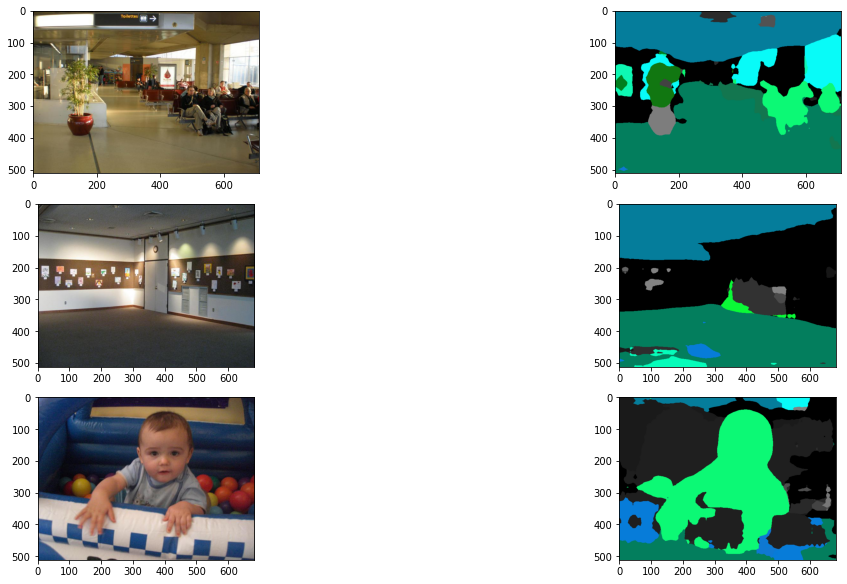

In [ ]:
image_name_list = ["ADE_train_00000002","ADE_train_00000003","ADE_train_00000005"]
preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
new_FCN_model.to('cuda')
fig, axs = plt.subplots(len(image_name_list), 2, figsize=(16, 8), constrained_layout=True)

for i,image_name in enumerate(image_name_list):
  input_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","training",f"{image_name}.jpg")
  input_image = Image.open(input_image).convert('RGB')

  input_tensor = preprocess(input_image)
  input_batch = input_tensor.unsqueeze(0)


  input_batch = input_batch.to('cuda')

  with torch.no_grad():
    output = new_FCN_model(input_batch)
    print(type(output))
    print(output['out'].shape)
    output = output['out'][0]
  output_predictions = output.argmax(0)

  palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
  colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
  colors = (colors % 255).numpy().astype("uint8")

# plot the semantic segmentation predictions of 21 classes in each color
  r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
  r.putpalette(colors)
  axs[i,0].imshow(input_image)
  axs[i,1].imshow(r)

save current trained model

In [ ]:
model_name = "new_FCN"
path = '/content/drive/MyDrive/6.869/{model_name}'
torch.save(new_FCN_model.state_dict(), path)

train another epoch

In [ ]:
model_name = "new_FCN"
path = '/content/drive/MyDrive/6.869/{model_name}'
new_FCN_model.load_state_dict(torch.load(path))

<All keys matched successfully>

In [ ]:
train_dataloader = data.DataLoader(
    trainset, batch_size = 4, shuffle=True,
    num_workers=2)
validation_dataloader = data.DataLoader(
    validationset,batch_size = 4, shuffle=True,
    num_workers=2
)

In [ ]:
new_FCN_model.to(device)

FCN(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequenti

In [ ]:
#second time
#train another epoch
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,1)

Epoch 1/1
----------


100%|██████████| 1000/1000 [1:18:10<00:00,  4.69s/it]


(FCN(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         (downs

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


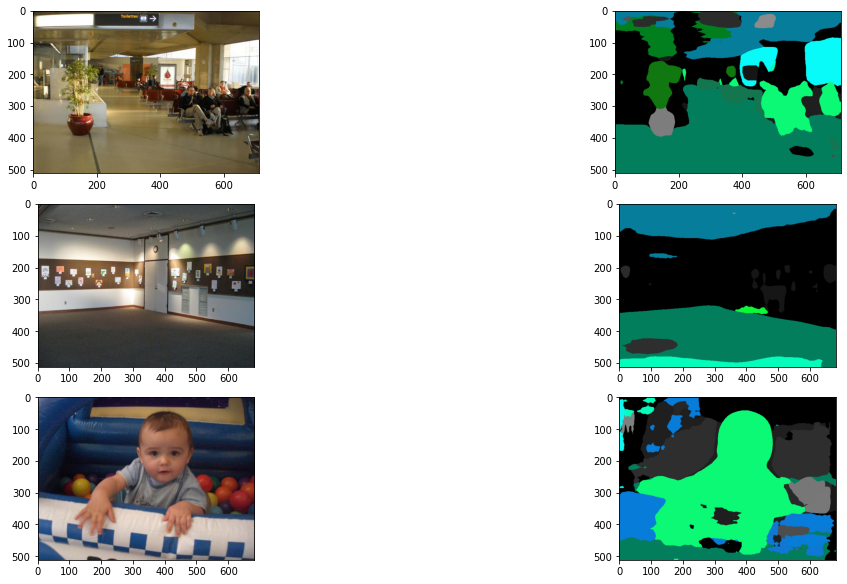

In [ ]:
visualize_performance_on_sample_image()

In [ ]:
model_name = "new_FCN2"
path = '/content/drive/MyDrive/6.869/{model_name}'
torch.save(new_FCN_model.state_dict(), path)

detection of wall, floor is getting better but human detection performance seems decay

In [ ]:
#third time
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,1)

Epoch 1/1
----------


100%|██████████| 1000/1000 [1:08:08<00:00,  4.09s/it]


(FCN(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         (downs

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


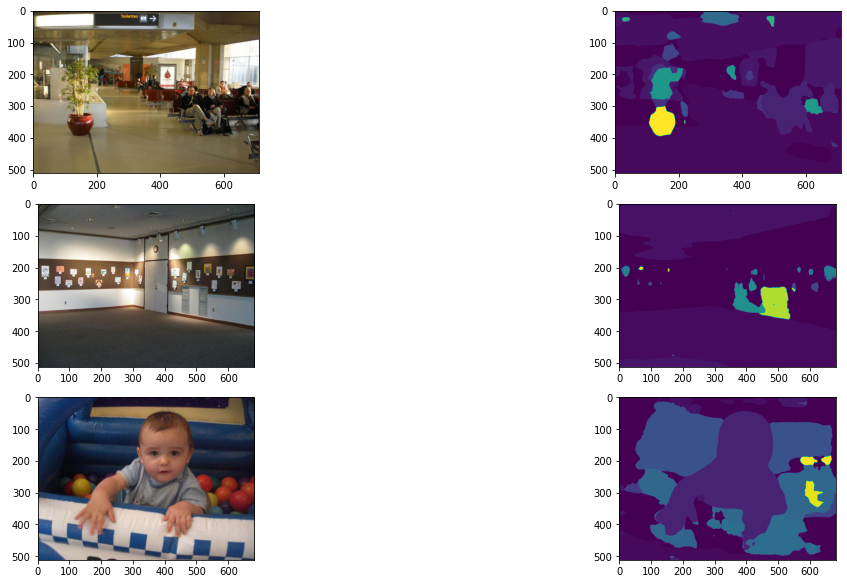

In [ ]:
visualize_performance_on_sample_image()

In [ ]:
model_name = "new_FCN3"
path = '/content/drive/MyDrive/6.869/{model_name}'
torch.save(new_FCN_model.state_dict(), path)

In [ ]:
model_name = "new_FCN3"
path = '/content/drive/MyDrive/6.869/{model_name}'
new_FCN_model.load_state_dict(torch.load(path))

<All keys matched successfully>

In [ ]:
new_FCN_model.to(device)
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,1)

Epoch 1/1
----------


100%|██████████| 2000/2000 [2:47:30<00:00,  5.03s/it]


(FCN(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         (downs

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


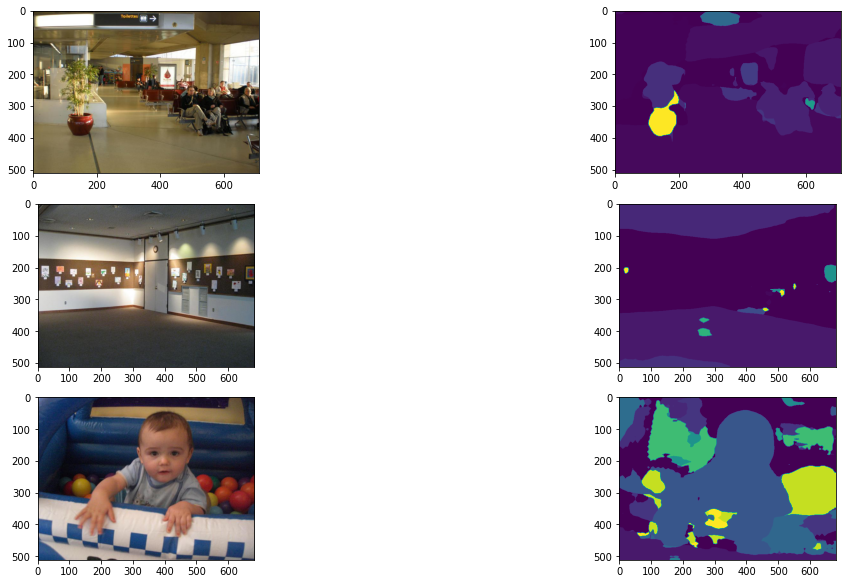

In [ ]:
visualize_performance_on_sample_image()

In [ ]:
model_name = "new_FCN4"
path = '/content/drive/MyDrive/6.869/{model_name}'
torch.save(new_FCN_model.state_dict(), path)

In [ ]:
model_name = "new_FCN4"
path = '/content/drive/MyDrive/6.869/{model_name}'
new_FCN_model.load_state_dict(torch.load(path))

<All keys matched successfully>

Epoch 1/2
----------


100%|██████████| 2000/2000 [3:52:16<00:00,  6.97s/it]


<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


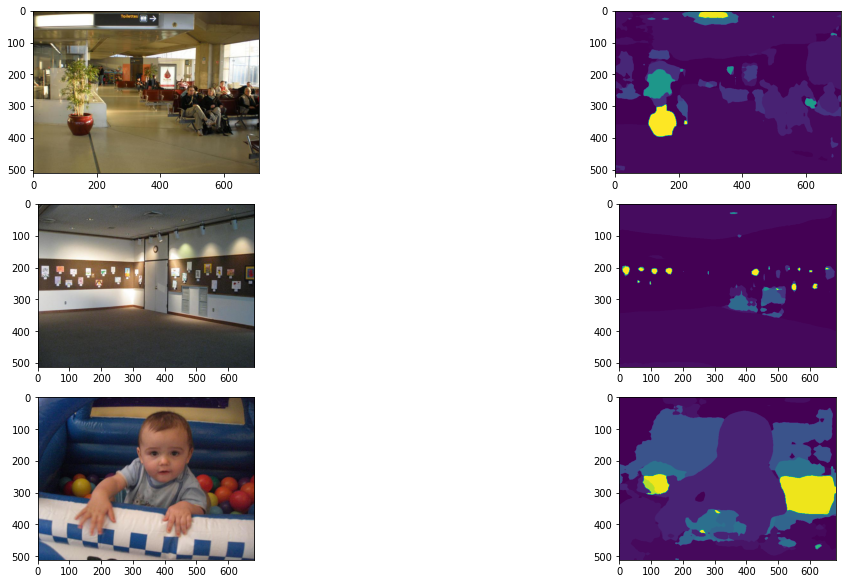

In [ ]:
new_FCN_model.to(device)
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,2)
model_name_4 = "new_FCN5"
path = '/content/drive/MyDrive/6.869/{model_name_4}'
torch.save(new_FCN_model.state_dict(), path)
visualize_performance_on_sample_image()

In [ ]:
model_name_4 = "new_FCN5"
path = '/content/drive/MyDrive/6.869/{model_name_4}'
new_FCN_model.load_state_dict(torch.load(path))
new_FCN_model.to(device)
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,1)

Epoch 1/1
----------


100%|██████████| 2000/2000 [3:49:08<00:00,  6.87s/it]


(FCN(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         (downs

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


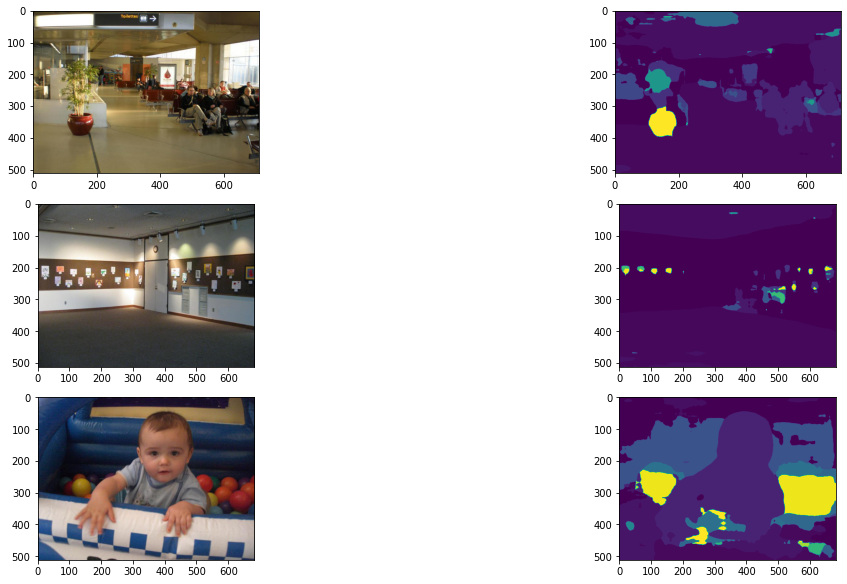

In [ ]:
visualize_performance_on_sample_image()

ground truth for another set of images

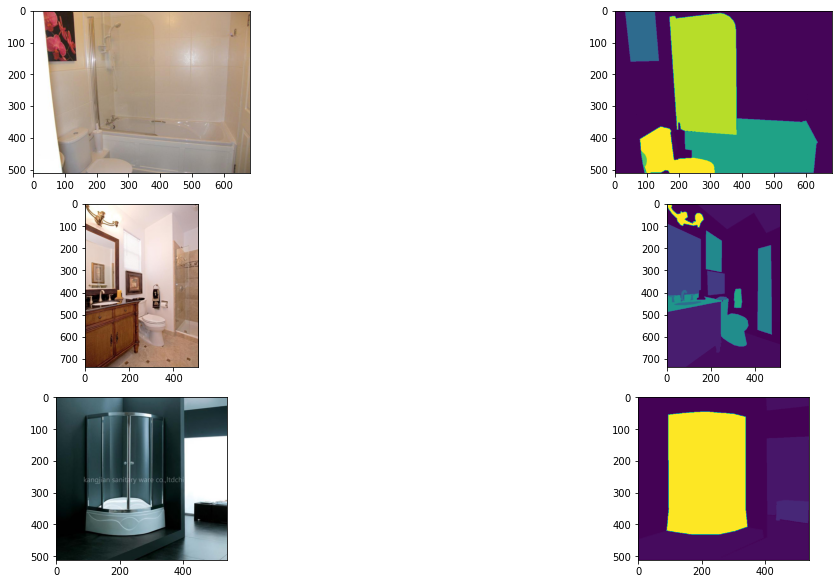

In [ ]:
image_name_list = ["ADE_train_00000009","ADE_train_00000007","ADE_train_00000008"]
fig, axs = plt.subplots(len(image_name_list), 2, figsize=(16, 8), constrained_layout=True)
for i,image_name in enumerate(image_name_list):
  original_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","training",f"{image_name}.jpg")
  label_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR, "annotations", "training", f"{image_name}.png")
  original_img = Image.open(original_image).convert('RGB')
  mask_img = Image.open(label_image)

  axs[i,0].imshow(original_img)
  axs[i,0].grid(False)

  label_image = np.asarray(mask_img)
  axs[i,1].imshow(label_image)
  axs[i,1].grid(False)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 735, 512])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 538])


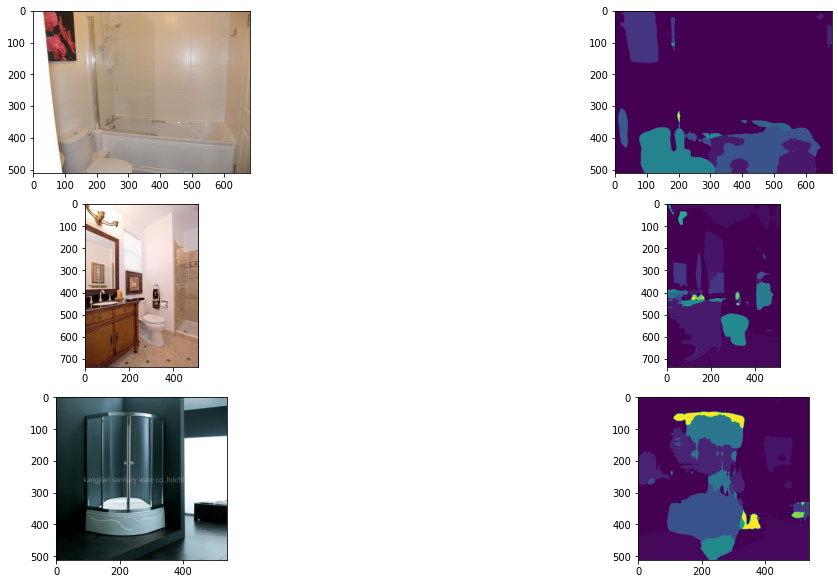

In [ ]:
visualize_performance_on_sample_image()

In [ ]:
model_name_5 = "new_FCN6"
path = '/content/drive/MyDrive/6.869/{model_name_5}'
torch.save(new_FCN_model.state_dict(), path)

Epoch 1/1
----------


100%|██████████| 2000/2000 [3:49:33<00:00,  6.89s/it]


<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 735, 512])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 538])


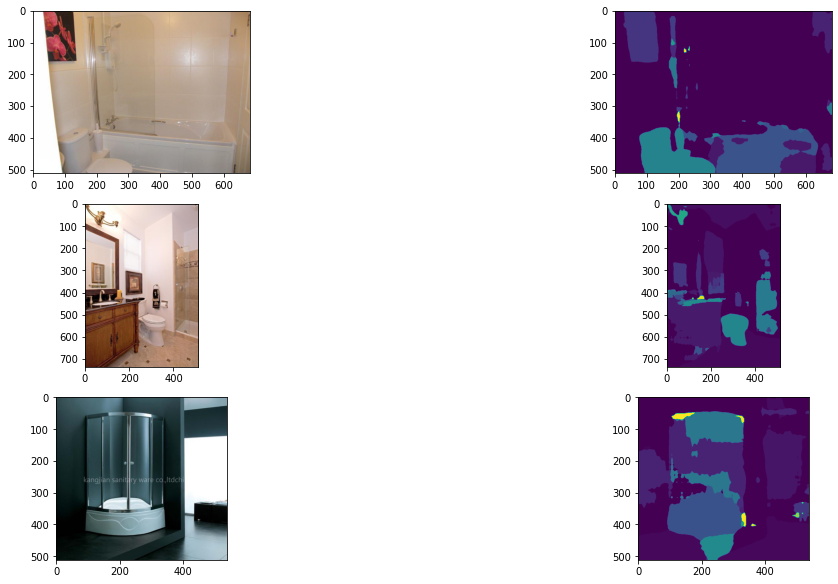

In [ ]:
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,1)
model_name_6 = "new_FCN7"
path = '/content/drive/MyDrive/6.869/{model_name_6}'
torch.save(new_FCN_model.state_dict(), path)
visualize_performance_on_sample_image()

In [ ]:
model_name_6 = "new_FCN7"
path = '/content/drive/MyDrive/6.869/{model_name_6}'
torch.save(new_FCN_model.state_dict(), path)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


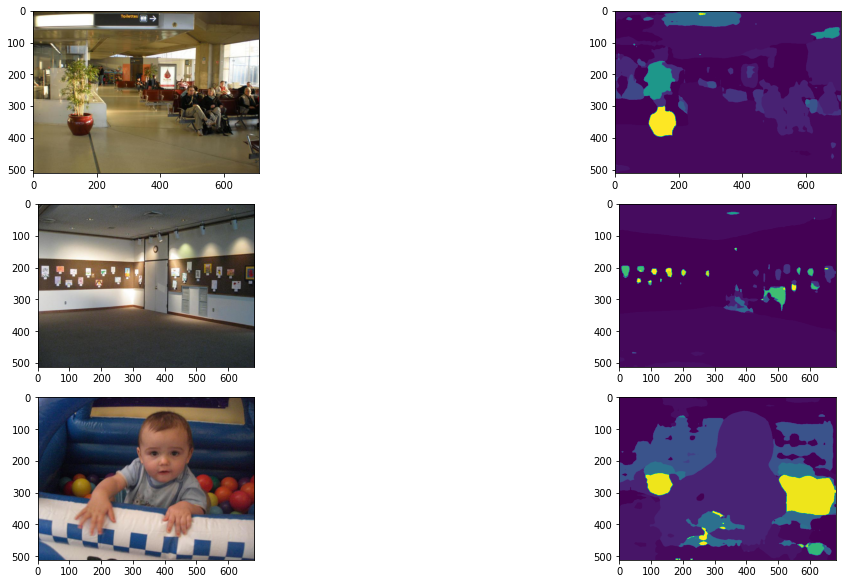

In [ ]:
visualize_performance_on_sample_image()

In [ ]:
model_name_6 = "new_FCN7"
path = '/content/drive/MyDrive/6.869/{model_name_6}'
new_FCN_model.load_state_dict(torch.load(path))

<All keys matched successfully>

In [ ]:
new_FCN_model.to(device)
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,2)

Epoch 1/2
----------


  0%|          | 1/2000 [00:10<5:42:57, 10.29s/it]

initial loss:  2.4858617782592773


  5%|▌         | 100/2000 [15:45<4:57:45,  9.40s/it]

avg train loss per 100 itr:  1.640281075835228


 10%|█         | 200/2000 [30:54<4:18:38,  8.62s/it]

avg train loss per 100 itr:  1.427160902619362


 15%|█▌        | 300/2000 [45:32<4:09:06,  8.79s/it]

avg train loss per 100 itr:  1.4659760764241219


 20%|██        | 400/2000 [1:00:59<4:06:58,  9.26s/it]

avg train loss per 100 itr:  1.4253207194805144


 25%|██▌       | 500/2000 [1:15:31<3:28:57,  8.36s/it]

avg train loss per 100 itr:  1.4536524564027786


 30%|███       | 600/2000 [1:29:13<3:10:12,  8.15s/it]

avg train loss per 100 itr:  1.3644347023963928


 35%|███▌      | 700/2000 [1:42:21<3:01:40,  8.38s/it]

avg train loss per 100 itr:  1.3251206147670747


 40%|████      | 800/2000 [1:55:07<2:33:01,  7.65s/it]

avg train loss per 100 itr:  1.3207399180531503


 45%|████▌     | 900/2000 [2:07:32<2:11:40,  7.18s/it]

avg train loss per 100 itr:  1.3656418132781982


 50%|█████     | 1000/2000 [2:19:42<1:53:54,  6.83s/it]

avg train loss per 100 itr:  1.2894918847084045


 55%|█████▌    | 1100/2000 [2:31:49<1:46:37,  7.11s/it]

avg train loss per 100 itr:  1.3899381572008134


 60%|██████    | 1200/2000 [2:43:36<1:41:12,  7.59s/it]

avg train loss per 100 itr:  1.370099083185196


 65%|██████▌   | 1300/2000 [2:55:03<1:16:28,  6.56s/it]

avg train loss per 100 itr:  1.3543600499629975


 70%|███████   | 1400/2000 [3:06:22<1:08:56,  6.89s/it]

avg train loss per 100 itr:  1.322773500829935


 75%|███████▌  | 1500/2000 [3:17:25<56:19,  6.76s/it]

avg train loss per 100 itr:  1.3639202105998993


 80%|████████  | 1600/2000 [3:28:18<40:05,  6.01s/it]

avg train loss per 100 itr:  1.2751064431667327


 85%|████████▌ | 1700/2000 [3:38:28<29:49,  5.96s/it]

avg train loss per 100 itr:  1.3620604208111764


 90%|█████████ | 1800/2000 [3:48:36<20:47,  6.24s/it]

avg train loss per 100 itr:  1.356206045150757


 95%|█████████▌| 1900/2000 [3:58:29<09:53,  5.94s/it]

avg train loss per 100 itr:  1.372569797039032


100%|██████████| 2000/2000 [4:08:21<00:00,  7.45s/it]


avg train loss per 100 itr:  1.3645000386238098
train loss per epoch:  [0.13806605379381492]
Epoch 2/2
----------


  0%|          | 1/2000 [00:04<2:43:16,  4.90s/it]

initial loss:  1.815060019493103


  5%|▌         | 100/2000 [09:49<3:21:30,  6.36s/it]

avg train loss per 100 itr:  1.387349582016468


 10%|█         | 200/2000 [19:15<2:39:00,  5.30s/it]

avg train loss per 100 itr:  1.3077619278430939


 15%|█▌        | 300/2000 [28:35<2:27:50,  5.22s/it]

avg train loss per 100 itr:  1.306030992269516


 20%|██        | 400/2000 [37:47<2:25:44,  5.47s/it]

avg train loss per 100 itr:  1.2843180751800538


 25%|██▌       | 500/2000 [46:52<2:19:36,  5.58s/it]

avg train loss per 100 itr:  1.3398887476325034


 30%|███       | 600/2000 [55:53<2:12:15,  5.67s/it]

avg train loss per 100 itr:  1.238600174188614


 35%|███▌      | 700/2000 [1:04:31<1:59:14,  5.50s/it]

avg train loss per 100 itr:  1.1937921464443206


 40%|████      | 800/2000 [1:13:01<1:40:27,  5.02s/it]

avg train loss per 100 itr:  1.285653432905674


 45%|████▌     | 900/2000 [1:21:50<1:31:32,  4.99s/it]

avg train loss per 100 itr:  1.3133240535855293


 50%|█████     | 1000/2000 [1:30:34<1:26:50,  5.21s/it]

avg train loss per 100 itr:  1.2532143133878708


 55%|█████▌    | 1100/2000 [1:39:02<1:16:15,  5.08s/it]

avg train loss per 100 itr:  1.2893126836419107


 60%|██████    | 1200/2000 [1:47:24<1:04:38,  4.85s/it]

avg train loss per 100 itr:  1.3081787520647048


 65%|██████▌   | 1300/2000 [1:55:56<1:00:55,  5.22s/it]

avg train loss per 100 itr:  1.2056489104032517


 70%|███████   | 1400/2000 [2:04:14<48:25,  4.84s/it]

avg train loss per 100 itr:  1.286213830113411


 75%|███████▌  | 1500/2000 [2:12:25<41:05,  4.93s/it]

avg train loss per 100 itr:  1.2316606616973877


 80%|████████  | 1600/2000 [2:20:33<30:52,  4.63s/it]

avg train loss per 100 itr:  1.2016162231564522


 85%|████████▌ | 1700/2000 [2:28:21<23:40,  4.74s/it]

avg train loss per 100 itr:  1.3113000819087028


 90%|█████████ | 1800/2000 [2:36:13<16:04,  4.82s/it]

avg train loss per 100 itr:  1.2764734175801278


 95%|█████████▌| 1900/2000 [2:44:03<07:50,  4.70s/it]

avg train loss per 100 itr:  1.1986087214946748


100%|██████████| 2000/2000 [2:51:48<00:00,  5.15s/it]

avg train loss per 100 itr:  1.2112104859948158
train loss per epoch:  [0.13806605379381492, 0.2652873462560978]


(FCN(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         (downs

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


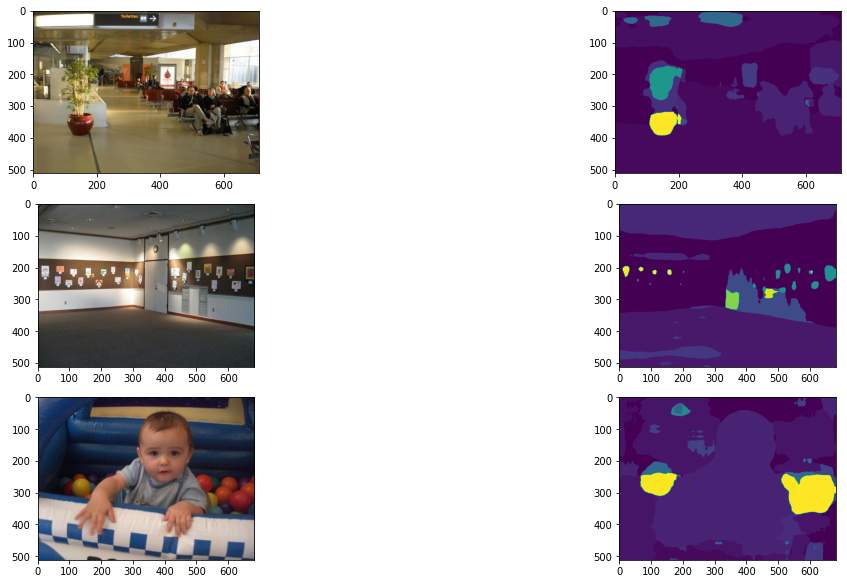

In [ ]:
model_name_7 = "new_FCN8"
path = '/content/drive/MyDrive/6.869/{model_name_7}'
torch.save(new_FCN_model.state_dict(), path)
visualize_performance_on_sample_image()

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 735, 512])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 538])


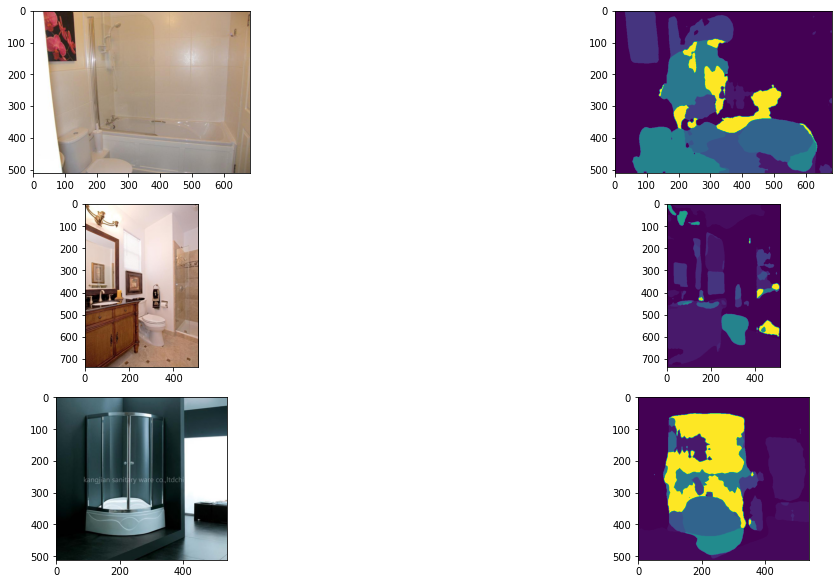

In [ ]:
visualize_performance_on_sample_image(1)

In [ ]:
model_name_7 = "new_FCN8"
path = '/content/drive/MyDrive/6.869/{model_name_7}'
new_FCN_model.load_state_dict(torch.load(path))

<All keys matched successfully>

In [ ]:
new_FCN_model.to(device)
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,2)

Epoch 1/2
----------


  0%|          | 1/2000 [00:11<6:34:25, 11.84s/it]

initial loss:  0.8019200563430786


  5%|▌         | 100/2000 [17:31<5:20:24, 10.12s/it]

avg train loss per 100 itr:  1.2644070547819137


 10%|█         | 200/2000 [34:14<5:04:11, 10.14s/it]

avg train loss per 100 itr:  1.231687566936016


 15%|█▌        | 300/2000 [50:32<4:21:11,  9.22s/it]

avg train loss per 100 itr:  1.2247435900568961


 20%|██        | 400/2000 [1:06:15<3:54:03,  8.78s/it]

avg train loss per 100 itr:  1.2948835644125938


 25%|██▌       | 500/2000 [1:21:45<3:56:04,  9.44s/it]

avg train loss per 100 itr:  1.249727104306221


 30%|███       | 600/2000 [1:36:29<3:16:26,  8.42s/it]

avg train loss per 100 itr:  1.2384826588630675


 35%|███▌      | 700/2000 [1:50:49<3:13:07,  8.91s/it]

avg train loss per 100 itr:  1.2151866206526756


 40%|████      | 800/2000 [2:04:35<2:37:29,  7.87s/it]

avg train loss per 100 itr:  1.2178124141693116


 45%|████▌     | 900/2000 [2:18:55<2:25:47,  7.95s/it]

avg train loss per 100 itr:  1.2529662540555


 50%|█████     | 1000/2000 [2:32:04<2:03:33,  7.41s/it]

avg train loss per 100 itr:  1.2052869087457656


 55%|█████▌    | 1100/2000 [2:45:03<1:46:23,  7.09s/it]

avg train loss per 100 itr:  1.2232574281096458


 60%|██████    | 1200/2000 [2:57:42<1:37:49,  7.34s/it]

avg train loss per 100 itr:  1.2672620597481727


 65%|██████▌   | 1300/2000 [3:09:56<1:25:54,  7.36s/it]

avg train loss per 100 itr:  1.2211630856990814


 70%|███████   | 1400/2000 [3:21:31<1:03:03,  6.31s/it]

avg train loss per 100 itr:  1.2233872476220131


 75%|███████▌  | 1500/2000 [3:33:21<57:45,  6.93s/it]

avg train loss per 100 itr:  1.2640443634986878


 80%|████████  | 1600/2000 [3:44:47<45:25,  6.81s/it]

avg train loss per 100 itr:  1.2296932861208916


 85%|████████▌ | 1700/2000 [3:55:42<31:49,  6.37s/it]

avg train loss per 100 itr:  1.1545374202728271


 90%|█████████ | 1800/2000 [4:06:40<24:11,  7.26s/it]

avg train loss per 100 itr:  1.1381137758493423


 95%|█████████▌| 1900/2000 [4:17:25<11:00,  6.60s/it]

avg train loss per 100 itr:  1.1330946797132493


100%|██████████| 2000/2000 [4:28:13<00:00,  8.05s/it]


avg train loss per 100 itr:  1.1637614521384239
train loss per epoch:  [0.12203392462527499]
Epoch 2/2
----------


  0%|          | 1/2000 [00:05<3:19:05,  5.98s/it]

initial loss:  1.3509905338287354


  5%|▌         | 100/2000 [10:29<3:33:22,  6.74s/it]

avg train loss per 100 itr:  1.153409315943718


 10%|█         | 200/2000 [20:51<2:54:35,  5.82s/it]

avg train loss per 100 itr:  1.273042271733284


 15%|█▌        | 300/2000 [30:58<2:55:04,  6.18s/it]

avg train loss per 100 itr:  1.1112618613243104


 20%|██        | 400/2000 [41:00<2:46:57,  6.26s/it]

avg train loss per 100 itr:  1.262265439927578


 25%|██▌       | 500/2000 [51:18<2:23:52,  5.76s/it]

avg train loss per 100 itr:  1.270413083434105


 30%|███       | 600/2000 [1:01:14<2:12:34,  5.68s/it]

avg train loss per 100 itr:  1.2118461453914642


 35%|███▌      | 700/2000 [1:10:59<2:09:49,  5.99s/it]

avg train loss per 100 itr:  1.2404411485791207


 40%|████      | 800/2000 [1:20:36<1:53:20,  5.67s/it]

avg train loss per 100 itr:  1.105905621945858


 45%|████▌     | 900/2000 [1:29:54<1:36:12,  5.25s/it]

avg train loss per 100 itr:  1.2677850231528283


 50%|█████     | 1000/2000 [1:39:17<1:27:31,  5.25s/it]

avg train loss per 100 itr:  1.173318468630314


 55%|█████▌    | 1100/2000 [1:48:17<1:31:47,  6.12s/it]

avg train loss per 100 itr:  1.118440950512886


 60%|██████    | 1200/2000 [1:57:10<1:12:07,  5.41s/it]

avg train loss per 100 itr:  1.195074811577797


 65%|██████▌   | 1300/2000 [2:06:01<1:02:55,  5.39s/it]

avg train loss per 100 itr:  1.090587234199047


 70%|███████   | 1400/2000 [2:14:45<52:05,  5.21s/it]

avg train loss per 100 itr:  1.1742564019560815


 75%|███████▌  | 1500/2000 [2:23:29<45:11,  5.42s/it]

avg train loss per 100 itr:  1.0530936655402183


 80%|████████  | 1600/2000 [2:32:09<31:19,  4.70s/it]

avg train loss per 100 itr:  1.1787710055708884


 85%|████████▌ | 1700/2000 [2:40:46<26:33,  5.31s/it]

avg train loss per 100 itr:  1.1873050972819328


 90%|█████████ | 1800/2000 [2:49:07<16:25,  4.93s/it]

avg train loss per 100 itr:  1.231510920524597


 95%|█████████▌| 1900/2000 [2:57:45<08:25,  5.06s/it]

avg train loss per 100 itr:  1.140756680071354


100%|██████████| 2000/2000 [3:06:08<00:00,  5.58s/it]

avg train loss per 100 itr:  1.1727114683389663
train loss per epoch:  [0.12203392462527499, 0.24029843041443813]


(FCN(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         (downs

In [ ]:
#model_name_8 = "new_FCN9"
#path = '/content/drive/MyDrive/6.869/{model_name_8}'
#torch.save(new_FCN_model.state_dict(), path)

In [ ]:
model_name_8 = "new_FCN9"
path = '/content/drive/MyDrive/6.869/{model_name_8}'
new_FCN_model.load_state_dict(torch.load(path))
new_FCN_model.to(device)

FCN(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequenti

model 9

In [ ]:
evaluate_model(new_FCN_model,loss_f,validation_dataloader)

  0%|          | 1/500 [00:05<44:54,  5.40s/it]

initial validation loss:  2.7477567195892334
initial validation IOU:  24.7365143542991


 20%|██        | 100/500 [08:18<32:16,  4.84s/it]

validation loss per 100 itr 2.8000721597671507
validation mean IOU per 100 itr:  22.820753543172497


 40%|████      | 200/500 [16:08<22:28,  4.49s/it]

validation loss per 100 itr 2.8180356645584106
validation mean IOU per 100 itr:  23.85813523894093


 60%|██████    | 300/500 [23:42<15:01,  4.51s/it]

validation loss per 100 itr 2.8081648910045622
validation mean IOU per 100 itr:  23.398802645528193


 80%|████████  | 400/500 [31:00<07:08,  4.29s/it]

validation loss per 100 itr 2.852913868427277
validation mean IOU per 100 itr:  23.891154178580667


100%|██████████| 500/500 [38:12<00:00,  4.58s/it]

validation loss per 100 itr 2.8439456629753113
validation mean IOU per 100 itr:  23.047775738268875
final mean IOU:  23.403324268898224
test loss:  0.06988190127032515


(0.06988190127032515, 23.403324268898224)

mean iou of new_FCN_model(version 9) is 23.403

In [ ]:
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:15<8:41:13, 15.64s/it]

initial loss:  2.9087681770324707


  5%|▌         | 100/2000 [25:48<8:18:02, 15.73s/it]

avg train loss per 100 itr:  2.235879418849945
avg train mean iou per 100 itr:  17.338319819517526


 10%|█         | 200/2000 [50:11<6:51:50, 13.73s/it]

avg train loss per 100 itr:  1.8832616049051285
avg train mean iou per 100 itr:  16.139780665257035


 15%|█▌        | 300/2000 [1:13:52<6:57:19, 14.73s/it]

avg train loss per 100 itr:  1.8374306082725524
avg train mean iou per 100 itr:  17.308500091661998


 20%|██        | 400/2000 [1:37:02<6:21:32, 14.31s/it]

avg train loss per 100 itr:  1.8543563866615296
avg train mean iou per 100 itr:  18.298223425827047


 25%|██▌       | 500/2000 [1:59:03<5:28:41, 13.15s/it]

avg train loss per 100 itr:  1.72670485496521
avg train mean iou per 100 itr:  18.621150081112507


 30%|███       | 600/2000 [2:20:22<5:12:49, 13.41s/it]

avg train loss per 100 itr:  1.7709963309764862
avg train mean iou per 100 itr:  20.62389866878641


 35%|███▌      | 700/2000 [2:41:07<4:29:29, 12.44s/it]

avg train loss per 100 itr:  1.6708096635341645
avg train mean iou per 100 itr:  20.164043640376814


 40%|████      | 800/2000 [3:01:04<3:48:47, 11.44s/it]

avg train loss per 100 itr:  1.7556779015064239
avg train mean iou per 100 itr:  21.081293811331367


 45%|████▌     | 900/2000 [3:20:20<3:04:07, 10.04s/it]

avg train loss per 100 itr:  1.6090313929319382
avg train mean iou per 100 itr:  21.60340401422577


 50%|█████     | 1000/2000 [3:39:11<3:00:23, 10.82s/it]

avg train loss per 100 itr:  1.6174495023489
avg train mean iou per 100 itr:  21.44509525957641


 55%|█████▌    | 1100/2000 [3:57:28<2:41:23, 10.76s/it]

avg train loss per 100 itr:  1.6149900019168855
avg train mean iou per 100 itr:  22.73453767396525


 60%|██████    | 1200/2000 [4:15:58<2:28:21, 11.13s/it]

avg train loss per 100 itr:  1.550461533665657
avg train mean iou per 100 itr:  22.48339545825313


 65%|██████▌   | 1300/2000 [4:33:12<1:48:54,  9.33s/it]

avg train loss per 100 itr:  1.5786309850215912
avg train mean iou per 100 itr:  23.985525508651754


 70%|███████   | 1400/2000 [4:50:20<1:33:27,  9.35s/it]

avg train loss per 100 itr:  1.501789227426052
avg train mean iou per 100 itr:  23.890298340629283


 75%|███████▌  | 1500/2000 [5:07:05<1:36:52, 11.62s/it]

avg train loss per 100 itr:  1.5393858736753463
avg train mean iou per 100 itr:  23.81595203178611


 80%|████████  | 1600/2000 [5:23:21<1:03:46,  9.57s/it]

avg train loss per 100 itr:  1.50928168207407
avg train mean iou per 100 itr:  24.08550818537242


 85%|████████▌ | 1700/2000 [5:37:30<42:22,  8.47s/it]

avg train loss per 100 itr:  1.512802917957306
avg train mean iou per 100 itr:  24.466005325512942


 90%|█████████ | 1800/2000 [5:51:38<28:53,  8.67s/it]

avg train loss per 100 itr:  1.4725287824869155
avg train mean iou per 100 itr:  24.978430034486593


 95%|█████████▌| 1900/2000 [6:04:26<11:03,  6.63s/it]

avg train loss per 100 itr:  1.469312914609909
avg train mean iou per 100 itr:  24.85996959619055


100%|██████████| 2000/2000 [6:17:19<00:00, 11.32s/it]

avg train loss per 100 itr:  1.4424557906389237
avg train mean iou per 100 itr:  24.431768990996638
train loss per epoch:  [1.6745659737288952]
train loss per epoch:  0.0


(FCN(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         (downs

In [ ]:
model_name_9 = "new_FCN10"
path = '/content/drive/MyDrive/6.869/{model_name_9}'
torch.save(new_FCN_model.state_dict(), path)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 735, 512])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 538])


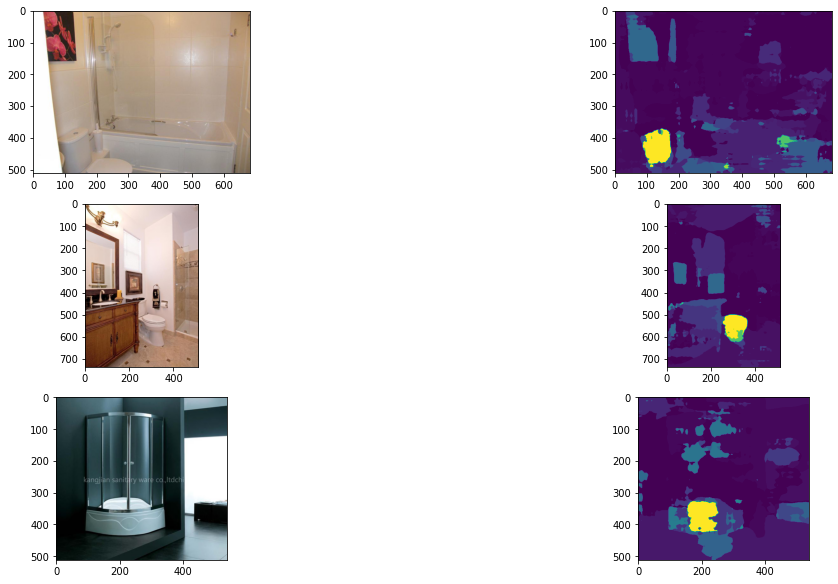

In [ ]:
visualize_performance_on_sample_image(1)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


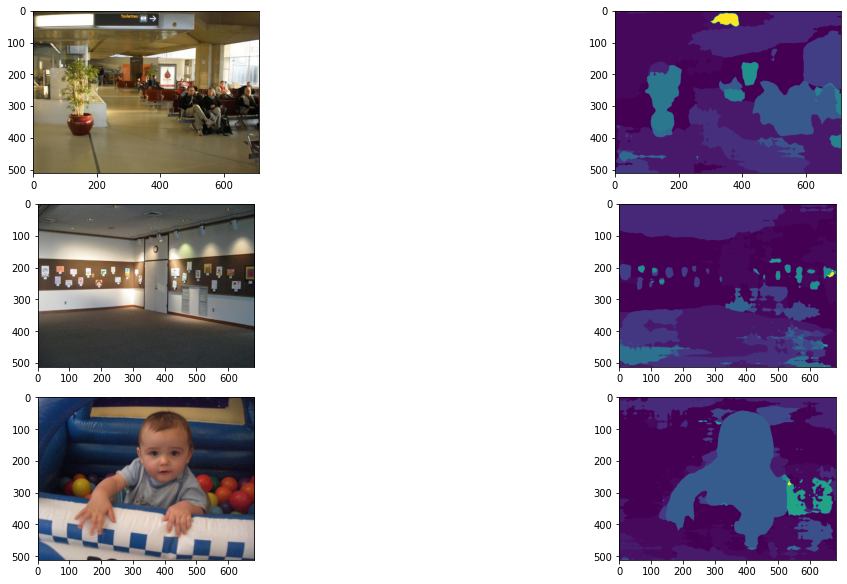

In [ ]:
visualize_performance_on_sample_image(0)

In [ ]:
evaluate_model(new_FCN_model,loss_f,validation_dataloader)

  0%|          | 1/500 [00:04<38:06,  4.58s/it]

initial validation loss:  1.9478707313537598
initial validation IOU:  20.241642211283462


 20%|██        | 100/500 [07:05<27:43,  4.16s/it]

validation loss per 100 itr 1.3965248566865922
validation mean IOU per 100 itr:  25.895892571592935


 40%|████      | 200/500 [14:02<20:46,  4.16s/it]

validation loss per 100 itr 1.3718075081706047
validation mean IOU per 100 itr:  27.483739322376863


 60%|██████    | 300/500 [20:57<13:57,  4.19s/it]

validation loss per 100 itr 1.4123636871576308
validation mean IOU per 100 itr:  27.417914895116557


 80%|████████  | 400/500 [27:50<06:51,  4.12s/it]

validation loss per 100 itr 1.3873967617750167
validation mean IOU per 100 itr:  28.018760671777407


100%|██████████| 500/500 [34:44<00:00,  4.17s/it]

validation loss per 100 itr 1.4376540172100067
validation mean IOU per 100 itr:  26.49069526047504
final mean IOU:  27.061400544267773
test loss:  0.03466475423552623


(0.03466475423552623, 27.061400544267773)

evaluate on the previous model 6

In [ ]:
evaluate_model(new_FCN_model,loss_f,validation_dataloader)

  0%|          | 1/500 [00:10<1:26:54, 10.45s/it]

initial validation loss:  3.1418988704681396
initial validation IOU:  30.27737758900355


 20%|██        | 100/500 [13:39<48:25,  7.26s/it]

validation loss per 100 itr 3.2397284746170043
validation mean IOU per 100 itr:  27.259127855432013


 40%|████      | 200/500 [23:46<25:21,  5.07s/it]

validation loss per 100 itr 3.249953076839447
validation mean IOU per 100 itr:  27.125400084173148


 60%|██████    | 300/500 [32:13<14:42,  4.41s/it]

validation loss per 100 itr 3.2095892667770385
validation mean IOU per 100 itr:  27.509440913741265


 80%|████████  | 400/500 [39:48<07:30,  4.50s/it]

validation loss per 100 itr 3.265623755455017
validation mean IOU per 100 itr:  26.752751489715603


100%|██████████| 500/500 [46:40<00:00,  5.60s/it]

validation loss per 100 itr 3.2562394189834594
validation mean IOU per 100 itr:  27.86147423912557
final mean IOU:  27.301638916437486
test loss:  0.0802629094145075


(0.0802629094145075, 27.301638916437486)

version 6 has 27.3 iou, which is the best among so-far trained model

<class 'collections.OrderedDict'>
torch.Size([1, 150, 364, 500])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 300, 400])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 300, 400])


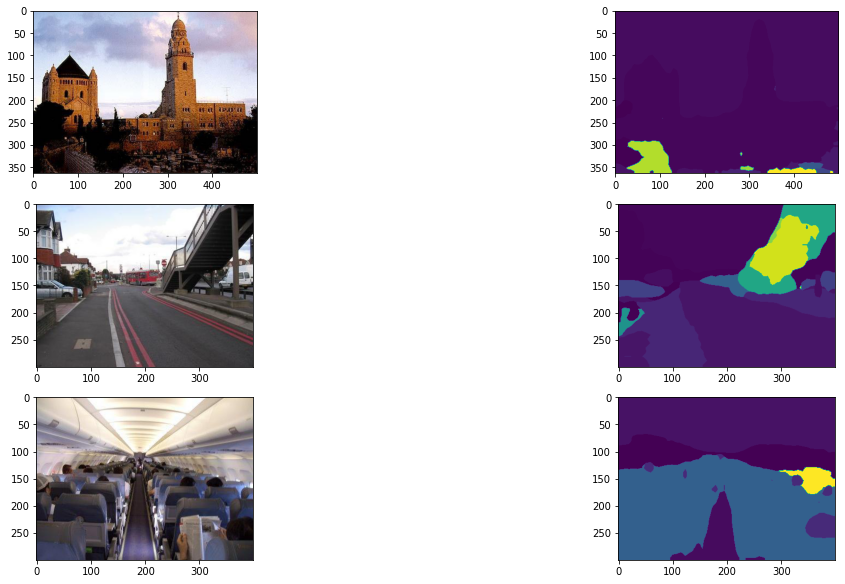

In [ ]:
model_name_6= "new_FCN7"
path = '/content/drive/MyDrive/6.869/{model_name_6}'
new_FCN_model.load_state_dict(torch.load(path))
new_FCN_model.eval()
visualize_performance_on_sample_image(new_FCN_model,"validation",0)

In [ ]:
model_name_6 = "new_FCN_7"
path = '/content/drive/MyDrive/6.869/{model_name_6}'
new_FCN_model.load_state_dict(torch.load(path))

<All keys matched successfully>

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


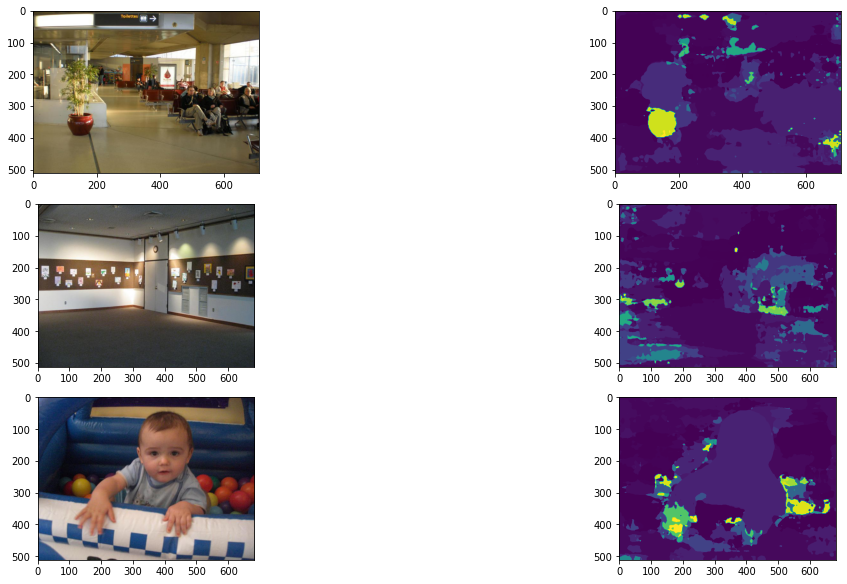

In [ ]:
new_FCN_model.to(device)
visualize_performance_on_sample_image(0)

In [ ]:
train_model(new_FCN_model,train_dataloader,validation_dataloader,optimizer,loss_f,1)
visualize_performance_on_sample_image(0)

Epoch 1/1
----------


  0%|          | 1/2000 [00:10<5:38:49, 10.17s/it]

initial loss:  3.3813064098358154


  5%|▌         | 100/2000 [15:02<4:38:30,  8.80s/it]

avg train loss per 100 itr:  2.8783391535282137
avg train mean iou per 100 itr:  20.38829049164831


 10%|█         | 200/2000 [30:12<4:34:30,  9.15s/it]

avg train loss per 100 itr:  2.6715573441982268
avg train mean iou per 100 itr:  19.8630959585764


 15%|█▌        | 300/2000 [44:25<3:58:11,  8.41s/it]

avg train loss per 100 itr:  2.412938537597656
avg train mean iou per 100 itr:  19.99205563909269


 20%|██        | 400/2000 [58:07<3:52:34,  8.72s/it]

avg train loss per 100 itr:  2.4783291804790495
avg train mean iou per 100 itr:  18.65795859766186


 25%|██▌       | 500/2000 [1:11:24<2:57:18,  7.09s/it]

avg train loss per 100 itr:  2.421583282351494
avg train mean iou per 100 itr:  18.596258818448


 30%|███       | 600/2000 [1:24:02<2:39:35,  6.84s/it]

avg train loss per 100 itr:  2.2256548261642455
avg train mean iou per 100 itr:  21.154512325127484


 35%|███▌      | 700/2000 [1:36:33<2:51:04,  7.90s/it]

avg train loss per 100 itr:  2.2110357272624968
avg train mean iou per 100 itr:  21.125531341872737


 40%|████      | 800/2000 [1:48:32<2:23:49,  7.19s/it]

avg train loss per 100 itr:  2.312454165220261
avg train mean iou per 100 itr:  20.142634898263335


 45%|████▌     | 900/2000 [2:00:01<1:59:58,  6.54s/it]

avg train loss per 100 itr:  2.194178758263588
avg train mean iou per 100 itr:  20.821817907041012


 50%|█████     | 1000/2000 [2:11:31<1:59:37,  7.18s/it]

avg train loss per 100 itr:  2.0950277984142303
avg train mean iou per 100 itr:  21.472889091193778


 55%|█████▌    | 1100/2000 [2:22:41<1:33:55,  6.26s/it]

avg train loss per 100 itr:  2.153968970179558
avg train mean iou per 100 itr:  20.979778692265374


 60%|██████    | 1200/2000 [2:33:37<1:28:42,  6.65s/it]

avg train loss per 100 itr:  2.054829181432724
avg train mean iou per 100 itr:  21.54880533781275


 65%|██████▌   | 1300/2000 [2:44:19<1:10:52,  6.08s/it]

avg train loss per 100 itr:  2.132221605181694
avg train mean iou per 100 itr:  21.60109092271554


 70%|███████   | 1400/2000 [2:54:56<1:08:06,  6.81s/it]

avg train loss per 100 itr:  1.9821331018209458
avg train mean iou per 100 itr:  22.09477755379476


 75%|███████▌  | 1500/2000 [3:04:51<50:21,  6.04s/it]

avg train loss per 100 itr:  2.0457370328903197
avg train mean iou per 100 itr:  21.531406615196996


 80%|████████  | 1600/2000 [3:14:35<38:27,  5.77s/it]

avg train loss per 100 itr:  1.9099303525686264
avg train mean iou per 100 itr:  22.470767738074766


 85%|████████▌ | 1700/2000 [3:24:17<28:47,  5.76s/it]

avg train loss per 100 itr:  1.9450793027877809
avg train mean iou per 100 itr:  22.218811538616105


 90%|█████████ | 1800/2000 [3:33:53<19:42,  5.91s/it]

avg train loss per 100 itr:  2.045282021164894
avg train mean iou per 100 itr:  21.43960114208611


 95%|█████████▌| 1900/2000 [3:43:14<09:55,  5.96s/it]

avg train loss per 100 itr:  1.9441798382997513
avg train mean iou per 100 itr:  22.28017357173275


 97%|█████████▋| 1934/2000 [3:46:30<06:36,  6.00s/it]

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


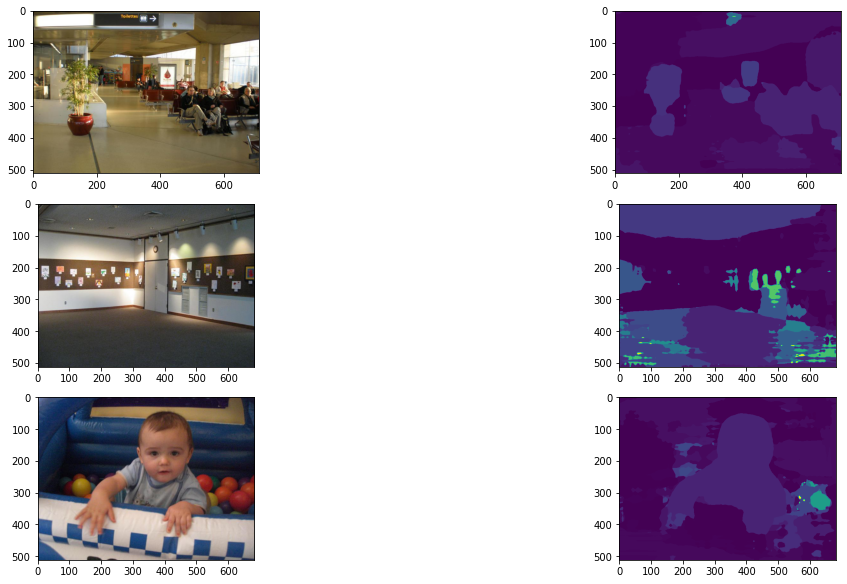

In [ ]:
visualize_performance_on_sample_image(0)

In [ ]:
evaluate_model(new_FCN_model,loss_f,validation_dataloader)

  0%|          | 1/500 [00:10<1:28:23, 10.63s/it]

initial validation loss:  1.3502473831176758
initial validation IOU:  22.315390982426614


 20%|██        | 100/500 [15:30<55:07,  8.27s/it]

validation loss per 100 itr 1.825564455986023
validation mean IOU per 100 itr:  26.997281081208598


 40%|████      | 200/500 [27:06<28:37,  5.73s/it]

validation loss per 100 itr 1.8273177218437195
validation mean IOU per 100 itr:  26.405702415818283


 60%|██████    | 300/500 [36:52<17:29,  5.25s/it]

validation loss per 100 itr 1.867933988571167
validation mean IOU per 100 itr:  25.37143342517176


 80%|████████  | 400/500 [45:36<07:39,  4.60s/it]

validation loss per 100 itr 1.8928779971599579
validation mean IOU per 100 itr:  26.11501832044569


100%|██████████| 500/500 [53:32<00:00,  6.43s/it]

validation loss per 100 itr 1.8851685392856599
validation mean IOU per 100 itr:  25.967953920212523
final mean IOU:  26.17147783257139
test loss:  1.8597725405693055


(1.8597725405693055, 26.17147783257139)

weird thing happen like my previous model is covered and not able to recover so I retrain my model from version 6(which is different as well)

In [ ]:
model_name_610 = "new_FCN610"
path = '/content/drive/MyDrive/6.869/{model_name_610}'
torch.save(new_FCN_model.state_dict(), path)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 768])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 342, 500])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 500, 375])


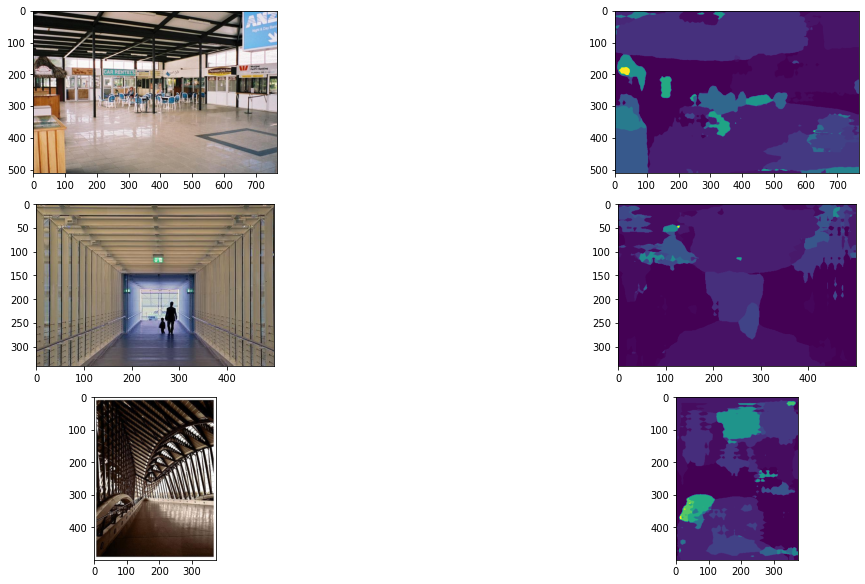

In [ ]:
model_name_610 = "new_FCN610"
path = '/content/drive/MyDrive/6.869/{model_name_610}'
new_FCN_model.load_state_dict(torch.load(path))
new_FCN_model.to(device)
visualize_performance_on_sample_image(new_FCN_model,"validation",1)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 768])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 342, 500])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 500, 375])


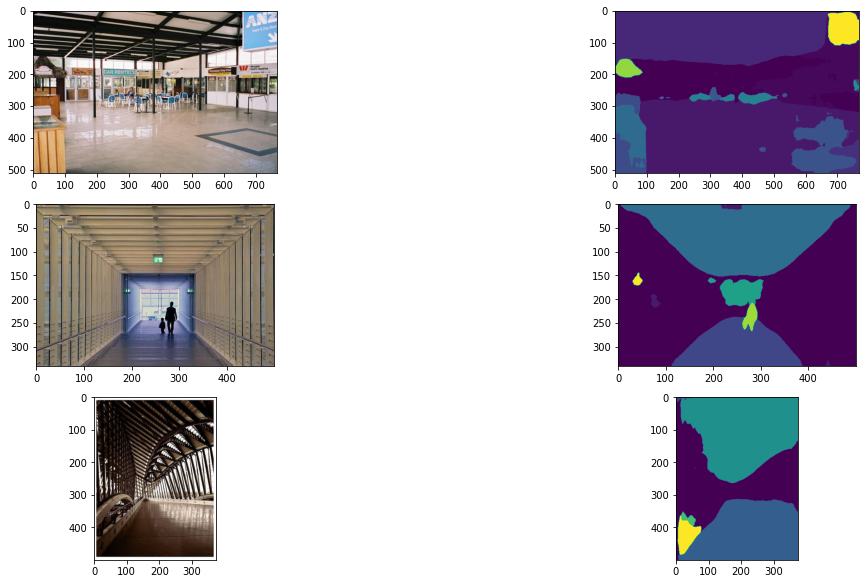

In [21]:
model_name_9 = "new_FCN10"
path = '/content/drive/MyDrive/6.869/{model_name_9}'
new_FCN_model.load_state_dict(torch.load(path))
new_FCN_model.eval()
new_FCN_model.to(device)
visualize_performance_on_sample_image(new_FCN_model,"validation",1)

In [ ]:
evaluate_model(new_FCN_model,loss_f,train_dataloader)

  0%|          | 1/500 [00:11<1:35:48, 11.52s/it]

initial validation loss:  0.8295581340789795
initial validation IOU:  31.60264966343011


 20%|██        | 100/500 [17:17<1:03:59,  9.60s/it]

validation loss per 100 itr 1.2034721863269806
validation mean IOU per 100 itr:  28.500856652580524


 40%|████      | 200/500 [33:44<48:22,  9.68s/it]

validation loss per 100 itr 1.173570311665535
validation mean IOU per 100 itr:  27.967062890902763


 48%|████▊     | 241/500 [40:34<43:36, 10.10s/it]


KeyboardInterrupt: ignored

#DeepLabV3

In [22]:
deeplabv3_model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


In [24]:
new_deeplabv3 = deeplabv3_model
new_deeplabv3.classifier[4] = nn.Conv2d(256, 150, kernel_size=(1, 1), stride=(1, 1))
new_deeplabv3.aux_classifier[4] = nn.Conv2d(256, 150, kernel_size=(1, 1), stride=(1, 1))

In [23]:
new_deeplabv3.eval()
visualize_performance_on_sample_image(new_deeplabv3,"training",0)

NameError: ignored

evaluate the pretrained deeplabv3 model

In [ ]:
new_deeplabv3.to(device)
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:04<39:17,  4.72s/it]

initial validation loss:  3.966395854949951
initial validation IOU:  0.012972562707173762


 20%|██        | 100/500 [07:04<27:13,  4.08s/it]

validation loss per 100 itr 4.601539375782013
validation mean IOU per 100 itr:  0.12236684323728345


 40%|████      | 200/500 [13:57<20:16,  4.06s/it]

validation loss per 100 itr 4.588118028640747
validation mean IOU per 100 itr:  0.12418288227612045


 60%|██████    | 300/500 [20:49<13:27,  4.04s/it]

validation loss per 100 itr 4.6430193567276
validation mean IOU per 100 itr:  0.1130997204442564


 80%|████████  | 400/500 [27:38<06:44,  4.04s/it]

validation loss per 100 itr 4.536734807491302
validation mean IOU per 100 itr:  0.24051737885926797


100%|██████████| 500/500 [34:32<00:00,  4.14s/it]

validation loss per 100 itr 4.5351449656486515
validation mean IOU per 100 itr:  0.12978742831825302
final mean IOU:  0.14599085062703626
test loss:  4.580911306858063


(4.580911306858063, 0.14599085062703626)

compare pretrained very first one FCN model

initial loss is 4.58 and iou is only 0.14599. 
 lets train 1 epoachs


In [ ]:
new_deeplabv3.to(device)
optimizer_deep = torch.optim.SGD(new_deeplabv3.parameters(), lr=0.001, momentum=0.9)
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:11<6:24:01, 11.53s/it]

initial loss:  4.74440336227417


  5%|▌         | 100/2000 [18:04<5:28:02, 10.36s/it]

avg train loss per 100 itr:  3.147850308418274
avg train mean iou per 100 itr:  1.8029969895532632


 10%|█         | 200/2000 [35:15<4:53:56,  9.80s/it]

avg train loss per 100 itr:  2.6490756845474244
avg train mean iou per 100 itr:  4.741559664218473


 15%|█▌        | 300/2000 [51:42<4:45:45, 10.09s/it]

avg train loss per 100 itr:  2.4098611384630204
avg train mean iou per 100 itr:  7.718753306496312


 20%|██        | 400/2000 [1:07:28<4:25:01,  9.94s/it]

avg train loss per 100 itr:  2.099789236783981
avg train mean iou per 100 itr:  11.205794735600772


 25%|██▌       | 500/2000 [1:22:59<4:12:07, 10.09s/it]

avg train loss per 100 itr:  1.8748653960227966
avg train mean iou per 100 itr:  13.92759978388276


 30%|███       | 600/2000 [1:38:25<3:20:56,  8.61s/it]

avg train loss per 100 itr:  1.9127126777172088
avg train mean iou per 100 itr:  14.694832871439155


 35%|███▌      | 700/2000 [1:52:46<3:04:23,  8.51s/it]

avg train loss per 100 itr:  1.836737909913063
avg train mean iou per 100 itr:  15.169312090842318


 40%|████      | 800/2000 [2:07:07<2:38:52,  7.94s/it]

avg train loss per 100 itr:  1.9567236852645875
avg train mean iou per 100 itr:  14.690136896384054


 45%|████▌     | 900/2000 [2:20:40<2:26:53,  8.01s/it]

avg train loss per 100 itr:  1.8323417043685912
avg train mean iou per 100 itr:  15.378211239130437


 50%|█████     | 1000/2000 [2:34:04<2:08:21,  7.70s/it]

avg train loss per 100 itr:  1.9002866393327713
avg train mean iou per 100 itr:  16.262494639381195


 55%|█████▌    | 1100/2000 [2:47:05<1:54:45,  7.65s/it]

avg train loss per 100 itr:  1.6874994319677352
avg train mean iou per 100 itr:  17.514932276710432


 60%|██████    | 1200/2000 [2:59:18<1:44:29,  7.84s/it]

avg train loss per 100 itr:  1.682246069908142
avg train mean iou per 100 itr:  18.4648009118111


 65%|██████▌   | 1300/2000 [3:11:23<1:21:16,  6.97s/it]

avg train loss per 100 itr:  1.635985598564148
avg train mean iou per 100 itr:  18.242415409891997


 70%|███████   | 1400/2000 [3:23:02<1:08:48,  6.88s/it]

avg train loss per 100 itr:  1.683616688847542
avg train mean iou per 100 itr:  18.086599682489393


 75%|███████▌  | 1500/2000 [3:34:14<49:13,  5.91s/it]

avg train loss per 100 itr:  1.554018010497093
avg train mean iou per 100 itr:  18.635235015037996


 80%|████████  | 1600/2000 [3:45:26<39:44,  5.96s/it]

avg train loss per 100 itr:  1.6171495079994203
avg train mean iou per 100 itr:  18.774622458403584


 85%|████████▌ | 1700/2000 [3:56:34<34:24,  6.88s/it]

avg train loss per 100 itr:  1.6332052385807037
avg train mean iou per 100 itr:  18.223774115120737


 90%|█████████ | 1800/2000 [4:07:24<21:59,  6.60s/it]

avg train loss per 100 itr:  1.5220661026239395
avg train mean iou per 100 itr:  19.46420802807021


 95%|█████████▌| 1900/2000 [4:17:47<09:52,  5.93s/it]

avg train loss per 100 itr:  1.5829810851812363
avg train mean iou per 100 itr:  19.507578790934186


100%|██████████| 2000/2000 [4:27:48<00:00,  8.03s/it]

avg train loss per 100 itr:  1.5443824523687362
avg train mean iou per 100 itr:  18.54208880426478
train loss per epoch:  [1.9072017068266869]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


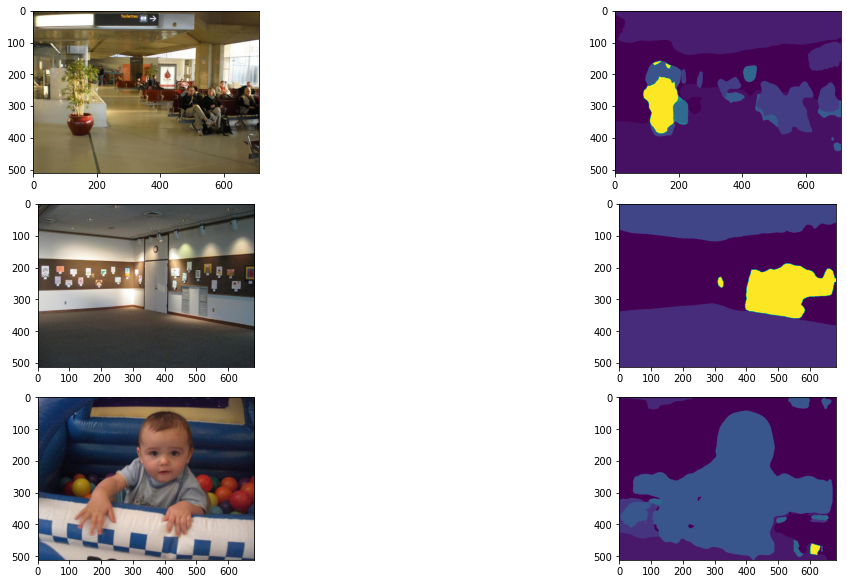

In [ ]:
new_deeplabv3.eval()
visualize_performance_on_sample_image(new_deeplabv3,"training",0)

In [ ]:
deeplabv3_1 = "new_deeplabv3_1"
path = '/content/drive/MyDrive/6.869/{deeplabv3_1}'
torch.save(new_deeplabv3.state_dict(), path)

In [ ]:
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:10<1:29:32, 10.77s/it]

initial validation loss:  0.9907993078231812
initial validation IOU:  30.345839292577942


 20%|██        | 100/500 [14:22<49:48,  7.47s/it]

validation loss per 100 itr 1.4314663392305373
validation mean IOU per 100 itr:  22.25522159673195


 40%|████      | 200/500 [25:48<33:26,  6.69s/it]

validation loss per 100 itr 1.458721531033516
validation mean IOU per 100 itr:  21.351775370304182


 60%|██████    | 300/500 [35:28<18:01,  5.41s/it]

validation loss per 100 itr 1.576959218978882
validation mean IOU per 100 itr:  20.793795041790073


 80%|████████  | 400/500 [43:59<08:58,  5.39s/it]

validation loss per 100 itr 1.4620061618089677
validation mean IOU per 100 itr:  21.665701196803283


100%|██████████| 500/500 [51:56<00:00,  6.23s/it]

validation loss per 100 itr 1.4641784644126892
validation mean IOU per 100 itr:  21.576465502727366
final mean IOU:  21.528591741671388
test loss:  1.4786663430929183


(1.4786663430929183, 21.528591741671388)

further training 1 epoch

In [ ]:
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:05<3:16:42,  5.90s/it]

initial loss:  1.6759562492370605


  5%|▌         | 100/2000 [10:58<3:41:23,  6.99s/it]

avg train loss per 100 itr:  1.4492518946528434
avg train mean iou per 100 itr:  21.056297782789443


 10%|█         | 200/2000 [21:51<3:04:18,  6.14s/it]

avg train loss per 100 itr:  1.5719668540358542
avg train mean iou per 100 itr:  18.83120360602678


 15%|█▌        | 300/2000 [32:12<2:49:33,  5.98s/it]

avg train loss per 100 itr:  1.6522971075773238
avg train mean iou per 100 itr:  19.751271062974816


 20%|██        | 400/2000 [42:16<2:44:04,  6.15s/it]

avg train loss per 100 itr:  1.5148487275838851
avg train mean iou per 100 itr:  19.706515167999083


 25%|██▌       | 500/2000 [52:05<2:31:38,  6.07s/it]

avg train loss per 100 itr:  1.5640036955475807
avg train mean iou per 100 itr:  19.48625722088279


 30%|███       | 600/2000 [1:01:51<2:12:40,  5.69s/it]

avg train loss per 100 itr:  1.473144339323044
avg train mean iou per 100 itr:  20.331128255863515


 35%|███▌      | 700/2000 [1:11:38<2:13:35,  6.17s/it]

avg train loss per 100 itr:  1.481378362774849
avg train mean iou per 100 itr:  19.487754094548574


 40%|████      | 800/2000 [1:21:15<1:50:12,  5.51s/it]

avg train loss per 100 itr:  1.441299731731415
avg train mean iou per 100 itr:  20.786385086872755


 45%|████▌     | 900/2000 [1:30:28<1:38:36,  5.38s/it]

avg train loss per 100 itr:  1.447212012410164
avg train mean iou per 100 itr:  21.460922196847317


 50%|█████     | 1000/2000 [1:39:44<1:28:25,  5.31s/it]

avg train loss per 100 itr:  1.3706124120950698
avg train mean iou per 100 itr:  21.46798269588555


 55%|█████▌    | 1100/2000 [1:49:01<1:24:01,  5.60s/it]

avg train loss per 100 itr:  1.3483882063627244
avg train mean iou per 100 itr:  22.45865697721147


 60%|██████    | 1200/2000 [1:58:03<1:16:33,  5.74s/it]

avg train loss per 100 itr:  1.3857657492160798
avg train mean iou per 100 itr:  21.729802707288453


 65%|██████▌   | 1300/2000 [2:07:06<58:49,  5.04s/it]  

avg train loss per 100 itr:  1.4387641924619674
avg train mean iou per 100 itr:  21.118686134141697


 70%|███████   | 1400/2000 [2:15:55<50:28,  5.05s/it]

avg train loss per 100 itr:  1.6164859807491303
avg train mean iou per 100 itr:  20.144174799502046


 75%|███████▌  | 1500/2000 [2:24:31<41:12,  4.95s/it]

avg train loss per 100 itr:  1.410462637245655
avg train mean iou per 100 itr:  19.87429926560611


 80%|████████  | 1600/2000 [2:33:22<35:49,  5.37s/it]

avg train loss per 100 itr:  1.3267513757944107
avg train mean iou per 100 itr:  23.84452782124734


 85%|████████▌ | 1700/2000 [2:41:54<24:19,  4.86s/it]

avg train loss per 100 itr:  1.3755451548099518
avg train mean iou per 100 itr:  23.193224123305473


 90%|█████████ | 1800/2000 [2:50:32<15:58,  4.79s/it]

avg train loss per 100 itr:  1.4075154396891594
avg train mean iou per 100 itr:  22.49597730222643


 95%|█████████▌| 1900/2000 [2:58:54<08:50,  5.30s/it]

avg train loss per 100 itr:  1.4061280488967896
avg train mean iou per 100 itr:  22.156038839589932


100%|██████████| 2000/2000 [3:07:16<00:00,  5.62s/it]

avg train loss per 100 itr:  1.3232408636808395
avg train mean iou per 100 itr:  21.845331614826073
train loss per epoch:  [1.4659644916206598]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_2 = "new_deeplabv3_2"
path = '/content/drive/MyDrive/6.869/{deeplabv3_2}'
torch.save(new_deeplabv3.state_dict(), path)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 364, 500])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 300, 400])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 300, 400])


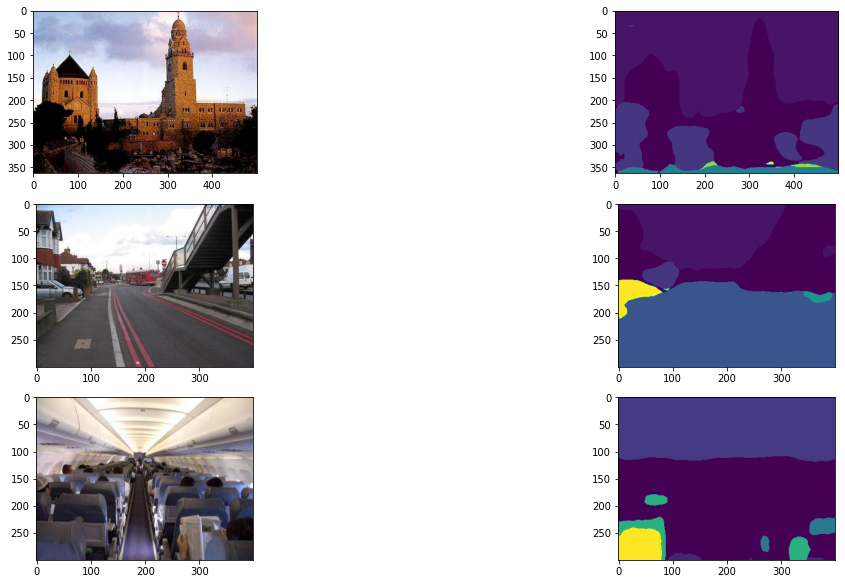

In [ ]:
new_deeplabv3.eval()
visualize_performance_on_sample_image(new_deeplabv3,"validation",0)

In [ ]:
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:04<40:40,  4.89s/it]

initial validation loss:  1.0606416463851929
initial validation IOU:  21.06869170781775


 20%|██        | 100/500 [07:12<27:53,  4.18s/it]

validation loss per 100 itr 1.3298149555921555
validation mean IOU per 100 itr:  23.19327379236625


 40%|████      | 200/500 [14:07<21:26,  4.29s/it]

validation loss per 100 itr 1.3810163915157319
validation mean IOU per 100 itr:  22.85130155461929


 60%|██████    | 300/500 [21:00<13:32,  4.06s/it]

validation loss per 100 itr 1.4072095477581024
validation mean IOU per 100 itr:  22.63348544926012


 80%|████████  | 400/500 [27:49<06:56,  4.16s/it]

validation loss per 100 itr 1.3878014063835145
validation mean IOU per 100 itr:  24.5906926477759


 94%|█████████▍| 471/500 [32:39<01:57,  4.06s/it]

In [ ]:
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,2)

Epoch 1/2
----------


  0%|          | 1/2000 [00:06<3:26:57,  6.21s/it]

initial loss:  1.3223172426223755


  5%|▌         | 100/2000 [09:05<2:53:29,  5.48s/it]

avg train loss per 100 itr:  1.373793592453003
avg train mean iou per 100 itr:  22.578998596837458


 10%|█         | 200/2000 [18:10<2:47:36,  5.59s/it]

avg train loss per 100 itr:  1.4414390158653259
avg train mean iou per 100 itr:  22.412093825057127


 15%|█▌        | 300/2000 [27:07<2:27:50,  5.22s/it]

avg train loss per 100 itr:  1.3270614868402482
avg train mean iou per 100 itr:  23.547151512267497


 20%|██        | 400/2000 [35:53<2:19:58,  5.25s/it]

avg train loss per 100 itr:  1.2752557986974715
avg train mean iou per 100 itr:  23.319368505460403


 25%|██▌       | 500/2000 [44:19<2:09:55,  5.20s/it]

avg train loss per 100 itr:  1.5652311968803405
avg train mean iou per 100 itr:  21.393603508384444


 30%|███       | 600/2000 [52:37<2:03:10,  5.28s/it]

avg train loss per 100 itr:  1.432781286239624
avg train mean iou per 100 itr:  23.572664598701873


 35%|███▌      | 700/2000 [1:00:53<1:45:02,  4.85s/it]

avg train loss per 100 itr:  1.214832524061203
avg train mean iou per 100 itr:  25.09196257864364


 40%|████      | 800/2000 [1:09:01<1:36:48,  4.84s/it]

avg train loss per 100 itr:  1.3505455219745637
avg train mean iou per 100 itr:  23.632475298620214


 45%|████▌     | 900/2000 [1:17:07<1:24:37,  4.62s/it]

avg train loss per 100 itr:  1.3687907338142395
avg train mean iou per 100 itr:  23.735622457172553


 50%|█████     | 1000/2000 [1:25:14<1:17:19,  4.64s/it]

avg train loss per 100 itr:  1.236493781208992
avg train mean iou per 100 itr:  23.70984154581647


 55%|█████▌    | 1100/2000 [1:33:19<1:16:23,  5.09s/it]

avg train loss per 100 itr:  1.301506762802601
avg train mean iou per 100 itr:  23.515202793805987


 60%|██████    | 1200/2000 [1:41:17<1:03:58,  4.80s/it]

avg train loss per 100 itr:  1.3144827008247375
avg train mean iou per 100 itr:  23.682085719035687


 65%|██████▌   | 1300/2000 [1:49:29<55:54,  4.79s/it]

avg train loss per 100 itr:  1.3743172284960747
avg train mean iou per 100 itr:  22.753434114496862


 70%|███████   | 1400/2000 [1:57:33<49:00,  4.90s/it]

avg train loss per 100 itr:  1.3789092972874641
avg train mean iou per 100 itr:  23.67428770300424


 72%|███████▏  | 1436/2000 [2:00:28<43:59,  4.68s/it]Traceback (most recent call last):
  File "/usr/lib/python3.7/shutil.py", line 498, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/usr/lib/python3.7/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/usr/lib/python3.7/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/usr/lib/python3.7/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/usr/lib/python3.7/shutil.py", line 496, in rmtree
    os.rmdir(path)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-98k0mpok'
 75%|███████▌  | 1500/2000 [2:05:37<40:14,  4.83s/it]

avg train loss per 100 itr:  1.2239042031764984
avg train mean iou per 100 itr:  25.098375745545194


 80%|████████  | 1600/2000 [2:13:43<31:13,  4.68s/it]

avg train loss per 100 itr:  1.330403861105442
avg train mean iou per 100 itr:  24.60251342533736


 85%|████████▌ | 1700/2000 [2:21:45<24:07,  4.82s/it]

avg train loss per 100 itr:  1.2764476555585862
avg train mean iou per 100 itr:  23.693416280301445


 90%|█████████ | 1800/2000 [2:29:52<16:27,  4.94s/it]

avg train loss per 100 itr:  1.1855447486042976
avg train mean iou per 100 itr:  24.62512571639381


 95%|█████████▌| 1900/2000 [2:37:48<08:05,  4.86s/it]

avg train loss per 100 itr:  1.3400810071825981
avg train mean iou per 100 itr:  23.615108536889192


100%|██████████| 2000/2000 [2:45:52<00:00,  4.98s/it]


avg train loss per 100 itr:  1.2600780740380286
avg train mean iou per 100 itr:  24.65577886390317
train loss per epoch:  [1.3421832735091448]
train loss per epoch:  0.0
Epoch 2/2
----------


  0%|          | 1/2000 [00:04<2:33:59,  4.62s/it]

initial loss:  1.5337705612182617


  5%|▌         | 100/2000 [08:00<2:29:44,  4.73s/it]

avg train loss per 100 itr:  1.1950994145870208
avg train mean iou per 100 itr:  26.425586448088396


 10%|█         | 200/2000 [16:00<2:22:36,  4.75s/it]

avg train loss per 100 itr:  1.1818422409892082
avg train mean iou per 100 itr:  24.812780470638444


 15%|█▌        | 300/2000 [23:59<2:13:05,  4.70s/it]

avg train loss per 100 itr:  1.2790403479337693
avg train mean iou per 100 itr:  24.157025949137136


 20%|██        | 400/2000 [31:52<2:04:02,  4.65s/it]

avg train loss per 100 itr:  1.3402530762553215
avg train mean iou per 100 itr:  23.514882467975262


 25%|██▌       | 500/2000 [39:40<1:56:10,  4.65s/it]

avg train loss per 100 itr:  1.2531226056814193
avg train mean iou per 100 itr:  25.023260740643806


 30%|███       | 600/2000 [47:35<1:49:59,  4.71s/it]

avg train loss per 100 itr:  1.2889802113175393
avg train mean iou per 100 itr:  23.06127249950177


 35%|███▌      | 700/2000 [55:32<1:41:24,  4.68s/it]

avg train loss per 100 itr:  1.1627023950219155
avg train mean iou per 100 itr:  26.09134605697216


 40%|████      | 800/2000 [1:03:23<1:33:43,  4.69s/it]

avg train loss per 100 itr:  1.2923278602957726
avg train mean iou per 100 itr:  25.029645554199966


 45%|████▌     | 900/2000 [1:11:21<1:28:27,  4.83s/it]

avg train loss per 100 itr:  1.2916994804143906
avg train mean iou per 100 itr:  24.729275282093113


 50%|█████     | 1000/2000 [1:19:18<1:18:35,  4.72s/it]

avg train loss per 100 itr:  1.2978955593705177
avg train mean iou per 100 itr:  23.962510411814915


 55%|█████▌    | 1100/2000 [1:27:08<1:11:32,  4.77s/it]

avg train loss per 100 itr:  1.3244936609268187
avg train mean iou per 100 itr:  24.97650149162509


 60%|██████    | 1200/2000 [1:35:04<1:03:36,  4.77s/it]

avg train loss per 100 itr:  1.272758605480194
avg train mean iou per 100 itr:  24.252813015232956


 65%|██████▌   | 1300/2000 [1:42:57<54:20,  4.66s/it]

avg train loss per 100 itr:  1.2740078485012054
avg train mean iou per 100 itr:  25.4463554416628


 70%|███████   | 1400/2000 [1:50:47<46:07,  4.61s/it]

avg train loss per 100 itr:  1.169544476866722
avg train mean iou per 100 itr:  26.202888754557797


 75%|███████▌  | 1500/2000 [1:58:34<38:45,  4.65s/it]

avg train loss per 100 itr:  1.2162259036302567
avg train mean iou per 100 itr:  24.308091255799148


 80%|████████  | 1600/2000 [2:06:18<30:31,  4.58s/it]

avg train loss per 100 itr:  1.2458200553059577
avg train mean iou per 100 itr:  25.417491683660106


 85%|████████▌ | 1700/2000 [2:14:03<22:56,  4.59s/it]

avg train loss per 100 itr:  1.211289877295494
avg train mean iou per 100 itr:  24.97160771535211


 90%|█████████ | 1800/2000 [2:21:52<15:18,  4.59s/it]

avg train loss per 100 itr:  1.136174612045288
avg train mean iou per 100 itr:  25.06086910260972


 95%|█████████▌| 1900/2000 [2:29:37<07:40,  4.60s/it]

avg train loss per 100 itr:  1.253720044195652
avg train mean iou per 100 itr:  24.938360767467376


 97%|█████████▋| 1948/2000 [2:33:20<04:00,  4.63s/it]

In [ ]:
deeplabv3_3 = "new_deeplabv3_3"
path = '/content/drive/MyDrive/6.869/{deeplabv3_3}'
torch.save(new_deeplabv3.state_dict(), path)

In [ ]:
new_deeplabv3.eval()
visualize_performance_on_sample_image(new_deeplabv3,"training",0)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 768])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 342, 500])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 500, 375])


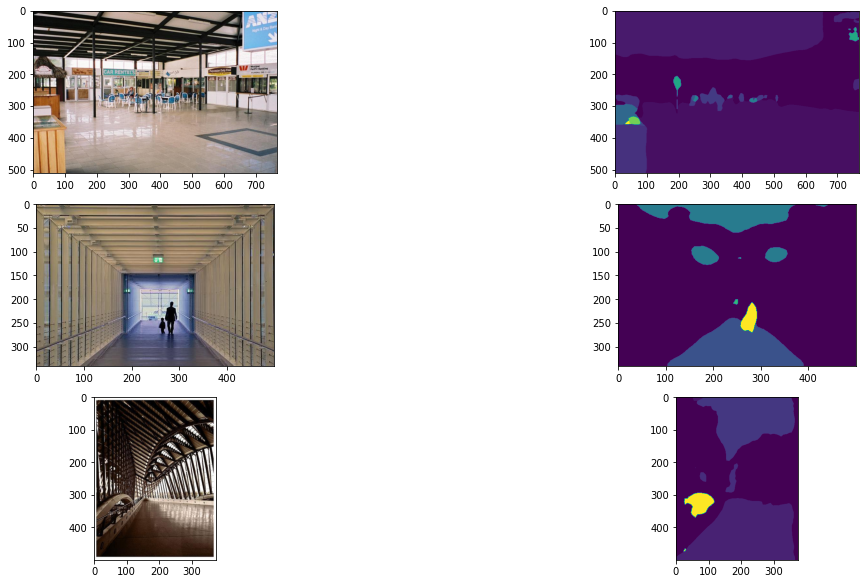

In [ ]:
deeplabv3_3 = "new_deeplabv3_3"
path = '/content/drive/MyDrive/6.869/{deeplabv3_3}'
new_deeplabv3.load_state_dict(torch.load(path))
new_deeplabv3.eval()
new_deeplabv3.to(device)
visualize_performance_on_sample_image(new_deeplabv3,"validation",1)

In [ ]:
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:12<1:41:36, 12.22s/it]

initial validation loss:  1.4957029819488525
initial validation IOU:  16.88628397973028


 20%|██        | 100/500 [14:38<52:20,  7.85s/it]

validation loss per 100 itr 1.3095130711793899
validation mean IOU per 100 itr:  24.892690177222175


 40%|████      | 200/500 [25:32<29:12,  5.84s/it]

validation loss per 100 itr 1.2558233827352523
validation mean IOU per 100 itr:  25.226344335555364


 60%|██████    | 300/500 [34:47<16:47,  5.04s/it]

validation loss per 100 itr 1.2595629072189332
validation mean IOU per 100 itr:  24.8666629692095


 80%|████████  | 400/500 [43:13<08:49,  5.30s/it]

validation loss per 100 itr 1.2840102478861808
validation mean IOU per 100 itr:  24.23622349055055


100%|██████████| 500/500 [51:06<00:00,  6.13s/it]

validation loss per 100 itr 1.2844169628620148
validation mean IOU per 100 itr:  24.810965256570302
final mean IOU:  24.806577245821586
test loss:  1.2786653143763542


(1.2786653143763542, 24.806577245821586)

In [ ]:
new_deeplabv3.to(device)
optimizer_deep = torch.optim.SGD(new_deeplabv3.parameters(), lr=0.001, momentum=0.9)
new_deeplabv3.eval()
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,2)

Epoch 1/2
----------


  0%|          | 1/2000 [00:07<4:11:46,  7.56s/it]

initial loss:  1.2654131650924683


  5%|▌         | 100/2000 [11:59<3:41:53,  7.01s/it]

avg train loss per 100 itr:  1.2250622248649596
avg train mean iou per 100 itr:  25.760603347298993


 10%|█         | 200/2000 [23:19<3:12:57,  6.43s/it]

avg train loss per 100 itr:  1.1739398801326753
avg train mean iou per 100 itr:  25.978414127500017


 15%|█▌        | 300/2000 [34:08<2:55:30,  6.19s/it]

avg train loss per 100 itr:  1.1772935390472412
avg train mean iou per 100 itr:  24.620284197555165


 20%|██        | 400/2000 [44:23<2:39:51,  5.99s/it]

avg train loss per 100 itr:  1.2915073853731156
avg train mean iou per 100 itr:  25.6864376810628


 25%|██▌       | 500/2000 [54:24<2:24:42,  5.79s/it]

avg train loss per 100 itr:  1.1599719074368477
avg train mean iou per 100 itr:  25.565795598074228


 30%|███       | 600/2000 [1:03:58<2:18:33,  5.94s/it]

avg train loss per 100 itr:  1.2516897696256637
avg train mean iou per 100 itr:  24.600877561430167


 35%|███▌      | 700/2000 [1:13:03<2:07:51,  5.90s/it]

avg train loss per 100 itr:  1.198865418434143
avg train mean iou per 100 itr:  24.815385171677676


 40%|████      | 800/2000 [1:21:54<1:39:18,  4.97s/it]

avg train loss per 100 itr:  1.1198183122277259
avg train mean iou per 100 itr:  28.540141717553638


 45%|████▌     | 900/2000 [1:30:47<1:38:53,  5.39s/it]

avg train loss per 100 itr:  1.2094606079161168
avg train mean iou per 100 itr:  25.54577527803912


 50%|█████     | 1000/2000 [1:39:02<1:28:01,  5.28s/it]

avg train loss per 100 itr:  1.1052586132287978
avg train mean iou per 100 itr:  27.027451751474896


 55%|█████▌    | 1100/2000 [1:47:13<1:07:18,  4.49s/it]

avg train loss per 100 itr:  1.203978232741356
avg train mean iou per 100 itr:  26.05306493124016


 60%|██████    | 1200/2000 [1:55:16<1:02:11,  4.66s/it]

avg train loss per 100 itr:  1.214043815433979
avg train mean iou per 100 itr:  25.664781397775982


 65%|██████▌   | 1300/2000 [2:03:00<53:14,  4.56s/it]

avg train loss per 100 itr:  1.217395613193512
avg train mean iou per 100 itr:  25.686061567589583


 70%|███████   | 1400/2000 [2:10:31<46:04,  4.61s/it]

avg train loss per 100 itr:  1.284390449821949
avg train mean iou per 100 itr:  25.614784319271095


 75%|███████▌  | 1500/2000 [2:18:01<38:49,  4.66s/it]

avg train loss per 100 itr:  1.2155027282238007
avg train mean iou per 100 itr:  27.12411063583962


 80%|████████  | 1600/2000 [2:25:14<28:30,  4.28s/it]

avg train loss per 100 itr:  1.1818003368377685
avg train mean iou per 100 itr:  26.32037414598821


 85%|████████▌ | 1700/2000 [2:32:13<19:46,  3.96s/it]

avg train loss per 100 itr:  1.120951638519764
avg train mean iou per 100 itr:  27.061969956062356


 90%|█████████ | 1800/2000 [2:39:14<14:28,  4.34s/it]

avg train loss per 100 itr:  1.3045265012979508
avg train mean iou per 100 itr:  23.644183582003638


 95%|█████████▌| 1900/2000 [2:45:54<06:49,  4.10s/it]

avg train loss per 100 itr:  1.0765468543767929
avg train mean iou per 100 itr:  27.455627229167984


100%|██████████| 2000/2000 [2:52:39<00:00,  5.18s/it]


avg train loss per 100 itr:  1.13938833296299
avg train mean iou per 100 itr:  26.21410945712103
train loss per epoch:  [1.2072878761067987]
train loss per epoch:  0.0
Epoch 2/2
----------


  0%|          | 1/2000 [00:04<2:19:56,  4.20s/it]

initial loss:  1.3366973400115967


  5%|▌         | 100/2000 [06:38<1:56:20,  3.67s/it]

avg train loss per 100 itr:  1.1324354965984822
avg train mean iou per 100 itr:  25.360703272181283


 10%|█         | 200/2000 [12:57<1:44:43,  3.49s/it]

avg train loss per 100 itr:  1.1178199845552443
avg train mean iou per 100 itr:  27.964259552849118


 15%|█▌        | 300/2000 [19:19<1:49:16,  3.86s/it]

avg train loss per 100 itr:  1.1667760708928108
avg train mean iou per 100 itr:  26.406720757007385


 20%|██        | 400/2000 [25:37<1:41:46,  3.82s/it]

avg train loss per 100 itr:  1.1796614143252373
avg train mean iou per 100 itr:  27.28821556090025


 25%|██▌       | 500/2000 [31:59<1:38:22,  3.94s/it]

avg train loss per 100 itr:  1.1220360946655275
avg train mean iou per 100 itr:  26.393014099766283


 27%|██▋       | 531/2000 [33:51<1:28:24,  3.61s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f67855ef320>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1358, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1341, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f67855ef320>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1358, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1341, in _shutdown

avg train loss per 100 itr:  1.1545378109812736
avg train mean iou per 100 itr:  27.302496171536994


 35%|███▌      | 700/2000 [44:13<1:18:25,  3.62s/it]

avg train loss per 100 itr:  1.1576397022604943
avg train mean iou per 100 itr:  26.066462239458293


 40%|████      | 800/2000 [50:11<1:11:17,  3.56s/it]

avg train loss per 100 itr:  1.0646825766563415
avg train mean iou per 100 itr:  26.281019999024146


 45%|████▌     | 900/2000 [56:07<1:04:27,  3.52s/it]

avg train loss per 100 itr:  1.138952161371708
avg train mean iou per 100 itr:  28.522904043991506


 50%|█████     | 1000/2000 [1:02:01<57:03,  3.42s/it]

avg train loss per 100 itr:  1.137936492562294
avg train mean iou per 100 itr:  27.08910397579444


 55%|█████▌    | 1100/2000 [1:07:53<59:48,  3.99s/it]

avg train loss per 100 itr:  1.126878345310688
avg train mean iou per 100 itr:  26.744577327296398


 60%|██████    | 1200/2000 [1:13:51<46:26,  3.48s/it]

avg train loss per 100 itr:  1.1878192430734635
avg train mean iou per 100 itr:  26.080458217939018


 65%|██████▌   | 1300/2000 [1:19:32<39:28,  3.38s/it]

avg train loss per 100 itr:  1.0984688618779181
avg train mean iou per 100 itr:  26.86332660390053


 70%|███████   | 1400/2000 [1:25:09<35:26,  3.54s/it]

avg train loss per 100 itr:  1.106151056587696
avg train mean iou per 100 itr:  28.067697347285563


 75%|███████▌  | 1500/2000 [1:30:47<26:10,  3.14s/it]

avg train loss per 100 itr:  1.1399214617908
avg train mean iou per 100 itr:  27.674019612623216


 80%|████████  | 1600/2000 [1:36:28<22:37,  3.39s/it]

avg train loss per 100 itr:  1.2425644251704215
avg train mean iou per 100 itr:  26.376807186232814


 85%|████████▌ | 1700/2000 [1:41:52<16:27,  3.29s/it]

avg train loss per 100 itr:  1.0861923494935035
avg train mean iou per 100 itr:  28.142433423700776


 90%|█████████ | 1800/2000 [1:47:24<10:13,  3.07s/it]

avg train loss per 100 itr:  1.1682008764147758
avg train mean iou per 100 itr:  27.93954913216932


 95%|█████████▌| 1900/2000 [1:52:54<05:26,  3.27s/it]

avg train loss per 100 itr:  1.1717929735779762
avg train mean iou per 100 itr:  26.300477614387965


100%|██████████| 2000/2000 [1:58:23<00:00,  3.55s/it]

avg train loss per 100 itr:  1.0475669580698013
avg train mean iou per 100 itr:  28.224996986292826
train loss per epoch:  [1.2072878761067987, 2.35757322678715]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_4 = "new_deeplabv3_4"
path = '/content/drive/MyDrive/6.869/{deeplabv3_4}'
torch.save(new_deeplabv3.state_dict(), path)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


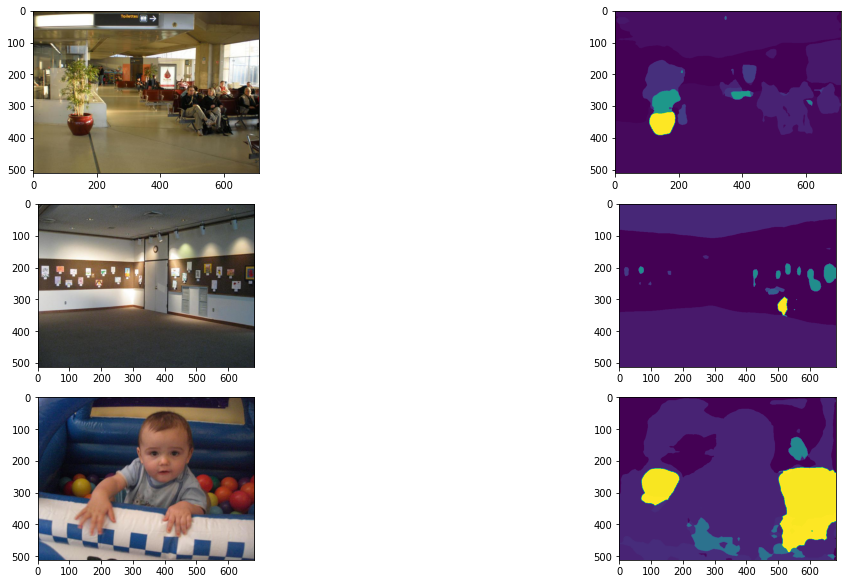

In [ ]:
new_deeplabv3.eval()
visualize_performance_on_sample_image(new_deeplabv3,"training",0)

In [ ]:
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:02<22:35,  2.72s/it]

initial validation loss:  1.0472654104232788
initial validation IOU:  27.341560198051823


 20%|██        | 100/500 [04:31<18:08,  2.72s/it]

validation loss per 100 itr 1.1410316973924637
validation mean IOU per 100 itr:  26.63149524556565


 40%|████      | 200/500 [09:03<13:36,  2.72s/it]

validation loss per 100 itr 1.1490245687961578
validation mean IOU per 100 itr:  28.57272421276758


 60%|██████    | 300/500 [13:35<09:04,  2.72s/it]

validation loss per 100 itr 1.087812038064003
validation mean IOU per 100 itr:  27.513815335295412


 80%|████████  | 400/500 [18:07<04:32,  2.72s/it]

validation loss per 100 itr 1.1050466361641884
validation mean IOU per 100 itr:  28.146321780765525


100%|██████████| 500/500 [22:39<00:00,  2.72s/it]

validation loss per 100 itr 1.115539689064026
validation mean IOU per 100 itr:  27.773979386755006
final mean IOU:  27.72766719222983
test loss:  1.1196909258961678


(1.1196909258961678, 27.72766719222983)

In [ ]:
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:03<1:42:55,  3.09s/it]

initial loss:  0.8499743938446045


  5%|▌         | 100/2000 [05:37<1:46:33,  3.36s/it]

avg train loss per 100 itr:  1.0640503147244453
avg train mean iou per 100 itr:  26.416698139464998


 10%|█         | 200/2000 [11:14<1:43:16,  3.44s/it]

avg train loss per 100 itr:  1.1529697987437248
avg train mean iou per 100 itr:  27.335485840759453


 15%|█▌        | 300/2000 [16:53<1:33:45,  3.31s/it]

avg train loss per 100 itr:  1.1408421832323075
avg train mean iou per 100 itr:  26.635318943181314


 20%|██        | 400/2000 [22:26<1:29:47,  3.37s/it]

avg train loss per 100 itr:  1.1944277364015579
avg train mean iou per 100 itr:  24.799286225105345


 25%|██▌       | 500/2000 [28:01<1:25:55,  3.44s/it]

avg train loss per 100 itr:  1.0726994150876998
avg train mean iou per 100 itr:  27.852732972337844


 30%|███       | 600/2000 [33:20<1:15:19,  3.23s/it]

avg train loss per 100 itr:  1.127707012295723
avg train mean iou per 100 itr:  28.586396354123405


 35%|███▌      | 700/2000 [38:43<1:08:50,  3.18s/it]

avg train loss per 100 itr:  1.1392993354797363
avg train mean iou per 100 itr:  27.196692767007665


 40%|████      | 800/2000 [44:09<1:07:06,  3.36s/it]

avg train loss per 100 itr:  1.1106443518400193
avg train mean iou per 100 itr:  25.97894805289874


 45%|████▌     | 900/2000 [49:38<1:00:12,  3.28s/it]

avg train loss per 100 itr:  1.1158529171347618
avg train mean iou per 100 itr:  29.229353887819105


 50%|█████     | 1000/2000 [55:02<52:55,  3.18s/it]

avg train loss per 100 itr:  1.1998367986083032
avg train mean iou per 100 itr:  26.906391178691027


 55%|█████▌    | 1100/2000 [1:00:30<47:07,  3.14s/it]

avg train loss per 100 itr:  1.1559945705533028
avg train mean iou per 100 itr:  27.33572713583732


 60%|██████    | 1200/2000 [1:05:47<40:44,  3.06s/it]

avg train loss per 100 itr:  1.1539841732382774
avg train mean iou per 100 itr:  27.090297169670567


 65%|██████▌   | 1300/2000 [1:11:12<36:22,  3.12s/it]

avg train loss per 100 itr:  1.039594686627388
avg train mean iou per 100 itr:  30.035602829861162


 70%|███████   | 1400/2000 [1:16:34<32:15,  3.23s/it]

avg train loss per 100 itr:  1.1307553343474865
avg train mean iou per 100 itr:  28.342941810606213


 75%|███████▌  | 1500/2000 [1:21:52<26:54,  3.23s/it]

avg train loss per 100 itr:  1.1053835853934288
avg train mean iou per 100 itr:  28.419250023491216


 80%|████████  | 1600/2000 [1:27:11<21:23,  3.21s/it]

avg train loss per 100 itr:  1.0466628909111022
avg train mean iou per 100 itr:  26.81708378875732


 85%|████████▌ | 1700/2000 [1:32:30<15:49,  3.17s/it]

avg train loss per 100 itr:  1.056968464255333
avg train mean iou per 100 itr:  27.83660514683079


 90%|█████████ | 1800/2000 [1:37:48<10:43,  3.22s/it]

avg train loss per 100 itr:  1.1554537549614907
avg train mean iou per 100 itr:  26.350785934966538


 95%|█████████▌| 1900/2000 [1:43:04<05:18,  3.18s/it]

avg train loss per 100 itr:  1.0760529246926307
avg train mean iou per 100 itr:  28.67139513317043


100%|██████████| 2000/2000 [1:48:17<00:00,  3.25s/it]

avg train loss per 100 itr:  1.0744974395632745
avg train mean iou per 100 itr:  29.25629221967246
train loss per epoch:  [1.1259557917043568]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_5 = "new_deeplabv3_5"
path = '/content/drive/MyDrive/6.869/{deeplabv3_5}'
torch.save(new_deeplabv3.state_dict(), path)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


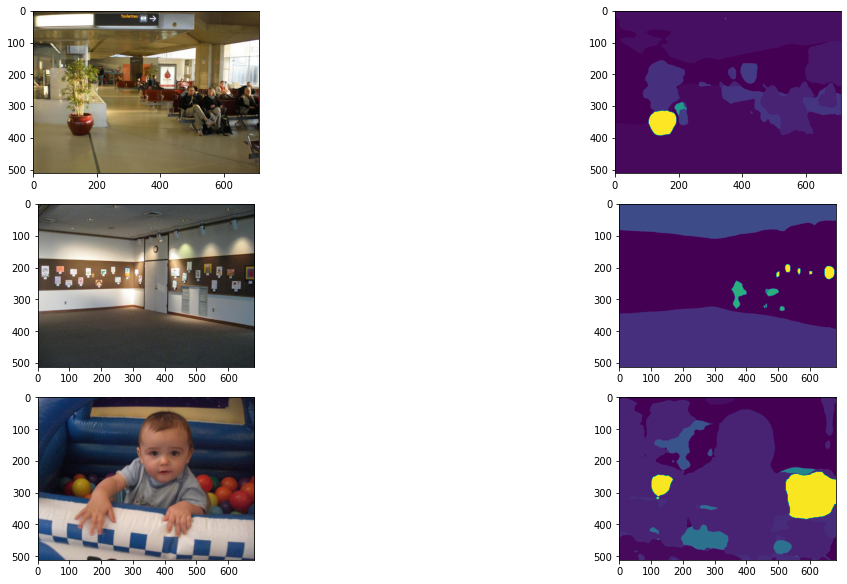

In [ ]:
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

In [ ]:
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:02<23:30,  2.83s/it]

initial validation loss:  0.7263098359107971
initial validation IOU:  34.367975530059105


 20%|██        | 100/500 [04:38<18:36,  2.79s/it]

validation loss per 100 itr 1.1269630885124207
validation mean IOU per 100 itr:  29.420819940454116


 40%|████      | 200/500 [09:16<13:52,  2.77s/it]

validation loss per 100 itr 1.0632857513427734
validation mean IOU per 100 itr:  29.26904797291661


 60%|██████    | 300/500 [13:55<09:17,  2.79s/it]

validation loss per 100 itr 1.032087713778019
validation mean IOU per 100 itr:  30.289064629511618


 80%|████████  | 400/500 [18:34<04:39,  2.79s/it]

validation loss per 100 itr 1.2033753687143325
validation mean IOU per 100 itr:  29.613577712528887


100%|██████████| 500/500 [23:14<00:00,  2.79s/it]

validation loss per 100 itr 1.0965407007932664
validation mean IOU per 100 itr:  30.347569198143706
final mean IOU:  29.788015890710987
test loss:  1.1044505246281624


(1.1044505246281624, 29.788015890710987)

In [ ]:
deeplabv3_5 = "new_deeplabv3_5"
path = '/content/drive/MyDrive/6.869/{deeplabv3_5}'
new_deeplabv3.load_state_dict(torch.load(path))
new_deeplabv3.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [ ]:
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:03<2:03:12,  3.70s/it]

initial loss:  1.468881607055664


  5%|▌         | 100/2000 [06:00<1:51:18,  3.52s/it]

avg train loss per 100 itr:  1.0010204383730887
avg train mean iou per 100 itr:  28.58623038252133


 10%|█         | 200/2000 [11:50<1:44:03,  3.47s/it]

avg train loss per 100 itr:  1.0306923761963844
avg train mean iou per 100 itr:  28.06476464518719


 15%|█▌        | 300/2000 [17:41<1:42:28,  3.62s/it]

avg train loss per 100 itr:  1.09748399913311
avg train mean iou per 100 itr:  28.867104211879862


 20%|██        | 400/2000 [23:30<1:31:05,  3.42s/it]

avg train loss per 100 itr:  1.1424941566586495
avg train mean iou per 100 itr:  27.183404001246636


 25%|██▌       | 500/2000 [29:12<1:24:42,  3.39s/it]

avg train loss per 100 itr:  1.1026354134082794
avg train mean iou per 100 itr:  29.186920717556156


 30%|███       | 600/2000 [34:53<1:19:46,  3.42s/it]

avg train loss per 100 itr:  1.0452781558036803
avg train mean iou per 100 itr:  30.1474813556226


 35%|███▌      | 700/2000 [40:32<1:14:00,  3.42s/it]

avg train loss per 100 itr:  1.040466537773609
avg train mean iou per 100 itr:  29.83680980674812


 40%|████      | 800/2000 [46:13<1:09:03,  3.45s/it]

avg train loss per 100 itr:  0.9989642012119293
avg train mean iou per 100 itr:  27.8813653639763


 45%|████▌     | 900/2000 [51:52<1:01:29,  3.35s/it]

avg train loss per 100 itr:  1.0342845273017884
avg train mean iou per 100 itr:  29.335870541948342


 50%|█████     | 1000/2000 [57:31<55:38,  3.34s/it]

avg train loss per 100 itr:  1.1779711139202118
avg train mean iou per 100 itr:  27.68279479458638


 55%|█████▌    | 1100/2000 [1:03:13<50:29,  3.37s/it]

avg train loss per 100 itr:  1.0058934590220452
avg train mean iou per 100 itr:  28.812240429750478


 60%|██████    | 1200/2000 [1:08:54<45:09,  3.39s/it]

avg train loss per 100 itr:  1.030257231593132
avg train mean iou per 100 itr:  28.189418484534905


 65%|██████▌   | 1300/2000 [1:14:32<40:14,  3.45s/it]

avg train loss per 100 itr:  1.0514188398420812
avg train mean iou per 100 itr:  28.328358683493107


 70%|███████   | 1400/2000 [1:20:12<33:47,  3.38s/it]

avg train loss per 100 itr:  1.118176433146
avg train mean iou per 100 itr:  27.862768316616197


 75%|███████▌  | 1500/2000 [1:25:47<27:33,  3.31s/it]

avg train loss per 100 itr:  1.0595775419473648
avg train mean iou per 100 itr:  29.27912991977948


 80%|████████  | 1600/2000 [1:31:24<22:39,  3.40s/it]

avg train loss per 100 itr:  1.0324566102027892
avg train mean iou per 100 itr:  27.848864495023086


 85%|████████▌ | 1700/2000 [1:37:01<16:55,  3.38s/it]

avg train loss per 100 itr:  1.0418436762690544
avg train mean iou per 100 itr:  27.57225911049453


 90%|█████████ | 1800/2000 [1:42:36<11:07,  3.34s/it]

avg train loss per 100 itr:  1.0617241978645324
avg train mean iou per 100 itr:  28.971836408669247


 95%|█████████▌| 1900/2000 [1:48:13<05:31,  3.32s/it]

avg train loss per 100 itr:  1.1354100547730923
avg train mean iou per 100 itr:  28.99989502831007


100%|██████████| 2000/2000 [1:53:50<00:00,  3.42s/it]

avg train loss per 100 itr:  1.0638650795817375
avg train mean iou per 100 itr:  28.769381573110135
train loss per epoch:  [1.0746967624127866]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_6 = "new_deeplabv3_6"
path = '/content/drive/MyDrive/6.869/{deeplabv3_6}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:03<25:33,  3.07s/it]

initial validation loss:  1.4058411121368408
initial validation IOU:  20.36446769423259


 20%|██        | 100/500 [05:08<20:33,  3.08s/it]

validation loss per 100 itr 1.0807435795664788
validation mean IOU per 100 itr:  29.761437689848925


 40%|████      | 200/500 [10:16<15:36,  3.12s/it]

validation loss per 100 itr 1.0447298017144204
validation mean IOU per 100 itr:  28.990005684659568


 60%|██████    | 300/500 [15:24<10:21,  3.11s/it]

validation loss per 100 itr 1.140267201066017
validation mean IOU per 100 itr:  29.10930373825202


 80%|████████  | 400/500 [20:33<05:07,  3.08s/it]

validation loss per 100 itr 1.0500735953450202
validation mean IOU per 100 itr:  29.85088178862515


100%|██████████| 500/500 [25:43<00:00,  3.09s/it]

validation loss per 100 itr 1.0696004021167755
validation mean IOU per 100 itr:  27.986811731150024
final mean IOU:  29.139688126507124
test loss:  1.0770829159617423


(1.0770829159617423, 29.139688126507124)

In [ ]:
deeplabv3_6 = "new_deeplabv3_6"
path = '/content/drive/MyDrive/6.869/{deeplabv3_6}'
new_deeplabv3.load_state_dict(torch.load(path))
new_deeplabv3.eval()
new_deeplabv3.to(device)
optimizer_deep = torch.optim.SGD(new_deeplabv3.parameters(), lr=0.001, momentum=0.9)
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:05<2:56:41,  5.30s/it]

initial loss:  1.3899842500686646


  4%|▍         | 90/2000 [10:16<3:43:02,  7.01s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f8d6d0af560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1358, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1341, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
  5%|▍         | 91/2000 [10:22<3:31:52,  6.66s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f8d6d0af560>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1358, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/

avg train loss per 100 itr:  0.9877392205595971
avg train mean iou per 100 itr:  27.339564365977445


 10%|█         | 200/2000 [22:34<3:24:54,  6.83s/it]

avg train loss per 100 itr:  1.1342194232344627
avg train mean iou per 100 itr:  27.080515659501863


 15%|█▌        | 300/2000 [33:28<3:01:11,  6.39s/it]

avg train loss per 100 itr:  1.0742294672131538
avg train mean iou per 100 itr:  28.94189033742491


 20%|██        | 400/2000 [43:52<3:01:57,  6.82s/it]

avg train loss per 100 itr:  1.0682431834936141
avg train mean iou per 100 itr:  28.968954454453023


 25%|██▌       | 500/2000 [53:37<2:28:49,  5.95s/it]

avg train loss per 100 itr:  1.0284574985504151
avg train mean iou per 100 itr:  29.383379523585585


 30%|███       | 600/2000 [1:03:13<2:07:24,  5.46s/it]

avg train loss per 100 itr:  1.0281249579787255
avg train mean iou per 100 itr:  28.243675321471994


 35%|███▌      | 700/2000 [1:12:40<2:07:12,  5.87s/it]

avg train loss per 100 itr:  1.0190720182657242
avg train mean iou per 100 itr:  28.17267060645058


 40%|████      | 800/2000 [1:21:53<1:53:42,  5.69s/it]

avg train loss per 100 itr:  1.072768047451973
avg train mean iou per 100 itr:  28.23863087202956


 45%|████▌     | 900/2000 [1:31:04<1:42:27,  5.59s/it]

avg train loss per 100 itr:  1.0769706881046295
avg train mean iou per 100 itr:  29.639525492195816


 50%|█████     | 1000/2000 [1:39:44<1:29:18,  5.36s/it]

avg train loss per 100 itr:  1.1254001331329346
avg train mean iou per 100 itr:  28.852910670403766


 55%|█████▌    | 1100/2000 [1:48:07<1:14:49,  4.99s/it]

avg train loss per 100 itr:  1.0340829879045486
avg train mean iou per 100 itr:  29.147008783765727


 60%|██████    | 1200/2000 [1:56:29<1:02:33,  4.69s/it]

avg train loss per 100 itr:  1.0062664106488228
avg train mean iou per 100 itr:  29.699749042033105


 65%|██████▌   | 1300/2000 [2:04:50<57:20,  4.91s/it]  

avg train loss per 100 itr:  1.0503611445426941
avg train mean iou per 100 itr:  29.438879939616303


 70%|███████   | 1400/2000 [2:13:11<49:17,  4.93s/it]

avg train loss per 100 itr:  1.0378011137247085
avg train mean iou per 100 itr:  28.43023819597599


 75%|███████▌  | 1500/2000 [2:20:56<42:28,  5.10s/it]

avg train loss per 100 itr:  1.052197398543358
avg train mean iou per 100 itr:  29.22634377674069


 80%|████████  | 1600/2000 [2:28:26<27:37,  4.14s/it]

avg train loss per 100 itr:  0.976305895447731
avg train mean iou per 100 itr:  31.400643078600023


 85%|████████▌ | 1700/2000 [2:35:37<22:32,  4.51s/it]

avg train loss per 100 itr:  1.0556939005851746
avg train mean iou per 100 itr:  30.07775798743009


 90%|█████████ | 1800/2000 [2:42:41<13:24,  4.02s/it]

avg train loss per 100 itr:  1.0283338758349418
avg train mean iou per 100 itr:  29.588781555314892


 95%|█████████▌| 1900/2000 [2:49:41<07:20,  4.40s/it]

avg train loss per 100 itr:  1.0049890825152397
avg train mean iou per 100 itr:  31.81057775401664


 99%|█████████▉| 1983/2000 [2:55:21<01:05,  3.84s/it]

In [ ]:
deeplabv3_7 = "new_deeplabv3_7"
path = '/content/drive/MyDrive/6.869/{deeplabv3_7}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:04<37:29,  4.51s/it]

initial validation loss:  0.6558274030685425
initial validation IOU:  29.43703590078947


 20%|██        | 100/500 [06:43<25:39,  3.85s/it]

validation loss per 100 itr 1.0669446447491646
validation mean IOU per 100 itr:  30.013141128323923


 40%|████      | 200/500 [12:37<17:18,  3.46s/it]

validation loss per 100 itr 1.03464033305645
validation mean IOU per 100 itr:  29.56690271075265


 60%|██████    | 300/500 [18:07<10:58,  3.29s/it]

validation loss per 100 itr 1.0585951399803162
validation mean IOU per 100 itr:  28.67353980896075


 80%|████████  | 400/500 [23:20<05:13,  3.13s/it]

validation loss per 100 itr 1.083623712360859
validation mean IOU per 100 itr:  28.35098703431501


100%|██████████| 500/500 [28:28<00:00,  3.42s/it]

validation loss per 100 itr 1.0795028281211854
validation mean IOU per 100 itr:  28.94974198998746
final mean IOU:  29.110862534467966
test loss:  1.064661331653595


(1.064661331653595, 29.110862534467966)

In [ ]:
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:04<2:16:03,  4.08s/it]

initial loss:  0.7031144499778748


  5%|▌         | 100/2000 [07:25<2:17:14,  4.33s/it]

avg train loss per 100 itr:  0.9881978139281273
avg train mean iou per 100 itr:  29.447295120147682


 10%|█         | 200/2000 [14:41<2:05:49,  4.19s/it]

avg train loss per 100 itr:  1.0285537719726563
avg train mean iou per 100 itr:  28.704673215196532


 15%|█▌        | 300/2000 [22:08<2:09:42,  4.58s/it]

avg train loss per 100 itr:  0.9722256681323052
avg train mean iou per 100 itr:  29.729590621469406


 20%|██        | 400/2000 [29:24<1:54:20,  4.29s/it]

avg train loss per 100 itr:  1.0119275122880935
avg train mean iou per 100 itr:  29.352238113293527


 25%|██▌       | 500/2000 [36:30<1:57:01,  4.68s/it]

avg train loss per 100 itr:  1.0003658726811409
avg train mean iou per 100 itr:  29.776001028268567


 30%|███       | 600/2000 [43:35<1:37:30,  4.18s/it]

avg train loss per 100 itr:  1.0318663069605827
avg train mean iou per 100 itr:  29.190358988185427


 35%|███▌      | 700/2000 [50:41<1:38:56,  4.57s/it]

avg train loss per 100 itr:  1.0389433974027633
avg train mean iou per 100 itr:  28.65607792925964


 40%|████      | 800/2000 [57:46<1:28:15,  4.41s/it]

avg train loss per 100 itr:  1.0286540308594703
avg train mean iou per 100 itr:  28.622912285750814


 45%|████▌     | 900/2000 [1:04:46<1:17:35,  4.23s/it]

avg train loss per 100 itr:  0.9941990742087364
avg train mean iou per 100 itr:  28.904802515088914


 50%|█████     | 1000/2000 [1:11:42<1:11:53,  4.31s/it]

avg train loss per 100 itr:  0.9698359557986259
avg train mean iou per 100 itr:  29.716415062727844


 55%|█████▌    | 1100/2000 [1:18:51<1:02:46,  4.19s/it]

avg train loss per 100 itr:  1.026609597504139
avg train mean iou per 100 itr:  30.03474321219923


 60%|██████    | 1200/2000 [1:25:40<53:59,  4.05s/it]

avg train loss per 100 itr:  1.0648316642642022
avg train mean iou per 100 itr:  28.89787324320532


 65%|██████▌   | 1300/2000 [1:32:25<49:01,  4.20s/it]

avg train loss per 100 itr:  1.0581131386756897
avg train mean iou per 100 itr:  29.36633711923763


 70%|███████   | 1400/2000 [1:39:03<40:24,  4.04s/it]

avg train loss per 100 itr:  1.0440205132961273
avg train mean iou per 100 itr:  29.473740833128822


 75%|███████▌  | 1500/2000 [1:45:41<33:54,  4.07s/it]

avg train loss per 100 itr:  0.9625147557258606
avg train mean iou per 100 itr:  28.77381174282449


 80%|████████  | 1600/2000 [1:52:23<27:45,  4.16s/it]

avg train loss per 100 itr:  1.0317254811525345
avg train mean iou per 100 itr:  29.66080088575471


 85%|████████▌ | 1700/2000 [1:59:03<21:46,  4.36s/it]

avg train loss per 100 itr:  1.0203413298726083
avg train mean iou per 100 itr:  28.03649587731429


 90%|█████████ | 1800/2000 [2:05:39<13:02,  3.91s/it]

avg train loss per 100 itr:  0.9651835539937019
avg train mean iou per 100 itr:  30.13615259349804


 95%|█████████▌| 1900/2000 [2:12:12<06:20,  3.80s/it]

avg train loss per 100 itr:  1.0349287211894989
avg train mean iou per 100 itr:  28.344811501035288


100%|██████████| 2000/2000 [2:18:44<00:00,  4.16s/it]

avg train loss per 100 itr:  1.1286255240440368
avg train mean iou per 100 itr:  27.072794483103813
train loss per epoch:  [1.0312931315898894]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_8 = "new_deeplabv3_8"
path = '/content/drive/MyDrive/6.869/{deeplabv3_8}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:03<28:15,  3.40s/it]

initial validation loss:  0.9486264586448669
initial validation IOU:  34.33475347562799


 20%|██        | 100/500 [05:47<22:43,  3.41s/it]

validation loss per 100 itr 1.0943144902586937
validation mean IOU per 100 itr:  30.759652654114802


 40%|████      | 200/500 [11:32<16:59,  3.40s/it]

validation loss per 100 itr 1.1464698386192322
validation mean IOU per 100 itr:  29.013552640969483


 60%|██████    | 300/500 [17:16<11:26,  3.43s/it]

validation loss per 100 itr 1.1330621147155762
validation mean IOU per 100 itr:  27.882393188356495


 80%|████████  | 400/500 [23:02<05:46,  3.46s/it]

validation loss per 100 itr 1.067240130007267
validation mean IOU per 100 itr:  29.769303978543938


100%|██████████| 500/500 [28:47<00:00,  3.46s/it]

validation loss per 100 itr 1.0864174807071685
validation mean IOU per 100 itr:  29.807933357874898
final mean IOU:  29.446567163971945
test loss:  1.1055008108615876


(1.1055008108615876, 29.446567163971945)

In [ ]:
new_deeplabv3.eval()
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,2)

Epoch 1/2
----------


  0%|          | 1/2000 [00:03<2:08:40,  3.86s/it]

initial loss:  1.116337537765503


  5%|▌         | 100/2000 [06:48<2:07:26,  4.02s/it]

avg train loss per 100 itr:  1.0172229665517807
avg train mean iou per 100 itr:  29.623845510219883


 10%|█         | 200/2000 [13:31<2:09:24,  4.31s/it]

avg train loss per 100 itr:  1.0372962334752083
avg train mean iou per 100 itr:  28.335289598976644


 15%|█▌        | 300/2000 [20:15<1:47:32,  3.80s/it]

avg train loss per 100 itr:  0.9714622497558594
avg train mean iou per 100 itr:  29.02254550001702


 20%|██        | 400/2000 [26:57<1:48:43,  4.08s/it]

avg train loss per 100 itr:  0.9698558479547501
avg train mean iou per 100 itr:  31.010816519152012


 25%|██▌       | 500/2000 [33:27<1:39:22,  3.97s/it]

avg train loss per 100 itr:  1.04165626257658
avg train mean iou per 100 itr:  29.53385532814658


 30%|███       | 600/2000 [39:55<1:28:41,  3.80s/it]

avg train loss per 100 itr:  1.0275432266294957
avg train mean iou per 100 itr:  29.76217161090757


 35%|███▌      | 700/2000 [46:20<1:21:42,  3.77s/it]

avg train loss per 100 itr:  1.01969414383173
avg train mean iou per 100 itr:  29.81497306628177


 40%|████      | 800/2000 [52:41<1:14:28,  3.72s/it]

avg train loss per 100 itr:  0.988551017343998
avg train mean iou per 100 itr:  29.965187772930744


 45%|████▌     | 900/2000 [58:59<1:07:11,  3.67s/it]

avg train loss per 100 itr:  0.9690421563386917
avg train mean iou per 100 itr:  29.387008856524975


 50%|█████     | 1000/2000 [1:05:18<1:06:21,  3.98s/it]

avg train loss per 100 itr:  0.9898402036726475
avg train mean iou per 100 itr:  30.89845677565316


 55%|█████▌    | 1100/2000 [1:11:35<56:39,  3.78s/it]

avg train loss per 100 itr:  1.0366299560666083
avg train mean iou per 100 itr:  29.70003838590289


 60%|██████    | 1200/2000 [1:17:41<47:21,  3.55s/it]

avg train loss per 100 itr:  1.0228916350007058
avg train mean iou per 100 itr:  29.78640456895768


 65%|██████▌   | 1300/2000 [1:23:36<41:17,  3.54s/it]

avg train loss per 100 itr:  0.9031347970664502
avg train mean iou per 100 itr:  31.42394089855393


 70%|███████   | 1400/2000 [1:29:25<33:56,  3.39s/it]

avg train loss per 100 itr:  0.9649918955564499
avg train mean iou per 100 itr:  29.208601061508233


 75%|███████▌  | 1500/2000 [1:35:17<31:59,  3.84s/it]

avg train loss per 100 itr:  0.9588761711120606
avg train mean iou per 100 itr:  30.273593017571457


 80%|████████  | 1600/2000 [1:41:04<23:39,  3.55s/it]

avg train loss per 100 itr:  1.004024936258793
avg train mean iou per 100 itr:  30.680550653311045


 85%|████████▌ | 1700/2000 [1:46:50<17:15,  3.45s/it]

avg train loss per 100 itr:  1.036091966331005
avg train mean iou per 100 itr:  29.647745472889316


 90%|█████████ | 1800/2000 [1:52:35<11:20,  3.40s/it]

avg train loss per 100 itr:  0.9624445846676827
avg train mean iou per 100 itr:  29.868012882324912


 95%|█████████▌| 1900/2000 [1:58:24<05:50,  3.50s/it]

avg train loss per 100 itr:  1.0699689307808875
avg train mean iou per 100 itr:  28.703036462163276


100%|██████████| 2000/2000 [2:04:13<00:00,  3.73s/it]


avg train loss per 100 itr:  1.022318708896637
avg train mean iou per 100 itr:  29.322382706309412
train loss per epoch:  [1.010387247748673]
train loss per epoch:  0.0
Epoch 2/2
----------


  0%|          | 1/2000 [00:03<1:51:32,  3.35s/it]

initial loss:  0.819037675857544


  5%|▌         | 100/2000 [05:45<1:50:40,  3.49s/it]

avg train loss per 100 itr:  1.0330019818246365
avg train mean iou per 100 itr:  28.72907112517391


 10%|█         | 200/2000 [11:30<1:40:51,  3.36s/it]

avg train loss per 100 itr:  1.0577279090881349
avg train mean iou per 100 itr:  30.000936278537452


 15%|█▌        | 300/2000 [17:14<1:39:28,  3.51s/it]

avg train loss per 100 itr:  0.9693835934996605
avg train mean iou per 100 itr:  32.969122259475306


 20%|██        | 400/2000 [22:53<1:29:22,  3.35s/it]

avg train loss per 100 itr:  0.9741894194483757
avg train mean iou per 100 itr:  30.216026298870705


 25%|██▌       | 500/2000 [28:34<1:23:15,  3.33s/it]

avg train loss per 100 itr:  0.9706336331367492
avg train mean iou per 100 itr:  31.255674528189942


 30%|███       | 600/2000 [34:13<1:18:30,  3.36s/it]

avg train loss per 100 itr:  1.0397791385650634
avg train mean iou per 100 itr:  27.957337833819093


 35%|███▌      | 700/2000 [39:55<1:15:34,  3.49s/it]

avg train loss per 100 itr:  0.9713738125562668
avg train mean iou per 100 itr:  29.309998386749047


 40%|████      | 800/2000 [45:31<1:06:49,  3.34s/it]

avg train loss per 100 itr:  0.9701351681351662
avg train mean iou per 100 itr:  31.166427465423634


 45%|████▌     | 900/2000 [51:10<1:04:44,  3.53s/it]

avg train loss per 100 itr:  0.9749003809690475
avg train mean iou per 100 itr:  29.170087870608576


 50%|█████     | 1000/2000 [56:48<56:53,  3.41s/it]

avg train loss per 100 itr:  1.0159415498375892
avg train mean iou per 100 itr:  30.71311033177221


 55%|█████▌    | 1100/2000 [1:02:27<50:52,  3.39s/it]

avg train loss per 100 itr:  0.9535333761572837
avg train mean iou per 100 itr:  30.766678589995696


 60%|██████    | 1200/2000 [1:08:06<47:24,  3.56s/it]

avg train loss per 100 itr:  0.9391953632235527
avg train mean iou per 100 itr:  30.362461471733603


 65%|██████▌   | 1300/2000 [1:13:44<38:47,  3.33s/it]

avg train loss per 100 itr:  0.9563783264160156
avg train mean iou per 100 itr:  30.21990261394629


 70%|███████   | 1400/2000 [1:19:21<33:37,  3.36s/it]

avg train loss per 100 itr:  1.0061226972937585
avg train mean iou per 100 itr:  29.599008898113354


 75%|███████▌  | 1500/2000 [1:25:03<29:56,  3.59s/it]

avg train loss per 100 itr:  0.9011415401101113
avg train mean iou per 100 itr:  31.966375145841212


 80%|████████  | 1600/2000 [1:30:46<22:43,  3.41s/it]

avg train loss per 100 itr:  1.0042316235601902
avg train mean iou per 100 itr:  31.54115519318409


 85%|████████▌ | 1700/2000 [1:36:28<16:57,  3.39s/it]

avg train loss per 100 itr:  0.9852288764715195
avg train mean iou per 100 itr:  31.657082075093985


 90%|█████████ | 1800/2000 [1:42:11<11:13,  3.37s/it]

avg train loss per 100 itr:  0.9747838652133942
avg train mean iou per 100 itr:  31.13656675676048


 95%|█████████▌| 1900/2000 [1:47:54<05:39,  3.40s/it]

avg train loss per 100 itr:  1.0017418333888053
avg train mean iou per 100 itr:  31.214992255019816


100%|██████████| 2000/2000 [1:53:35<00:00,  3.41s/it]

avg train loss per 100 itr:  0.8930001360177994
avg train mean iou per 100 itr:  30.885270801594732
train loss per epoch:  [1.010387247748673, 1.9994677512273193]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_9 = "new_deeplabv3_9"
path = '/content/drive/MyDrive/6.869/{deeplabv3_9}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:03<26:09,  3.14s/it]

initial validation loss:  0.6902821063995361
initial validation IOU:  24.6296257444232
initial validation loss:  0.6902821063995361
initial validation IOU:  24.6296257444232


 20%|██        | 100/500 [05:14<21:03,  3.16s/it]

validation loss per 100 itr 0.9456977424025536
validation mean IOU per 100 itr:  32.14231014455666
validation loss per 100 itr 0.9456977424025536
validation mean IOU per 100 itr:  32.14231014455666


 40%|████      | 200/500 [10:28<15:52,  3.18s/it]

validation loss per 100 itr 0.9796705123782158
validation mean IOU per 100 itr:  30.871559848623374
validation loss per 100 itr 0.9796705123782158
validation mean IOU per 100 itr:  30.871559848623374


 60%|██████    | 300/500 [15:42<10:28,  3.14s/it]

validation loss per 100 itr 0.9746510916948319
validation mean IOU per 100 itr:  30.543160517282985
validation loss per 100 itr 0.9746510916948319
validation mean IOU per 100 itr:  30.543160517282985


 80%|████████  | 400/500 [20:56<05:13,  3.13s/it]

validation loss per 100 itr 0.9658367523550987
validation mean IOU per 100 itr:  31.72442088815514
validation loss per 100 itr 0.9658367523550987
validation mean IOU per 100 itr:  31.72442088815514


100%|██████████| 500/500 [26:11<00:00,  3.14s/it]

validation loss per 100 itr 0.9312329879403114
validation mean IOU per 100 itr:  31.496866206607866
final mean IOU:  31.355663521045194
test loss:  0.9594178173542023
validation loss per 100 itr 0.9312329879403114
validation mean IOU per 100 itr:  31.496866206607866
final mean IOU:  31.355663521045194
test loss:  0.9594178173542023


(0.9594178173542023, 31.355663521045194)

(0.9594178173542023, 31.355663521045194)

In [ ]:
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:03<1:54:29,  3.44s/it]

initial loss:  0.9764029383659363


  5%|▌         | 100/2000 [05:43<1:52:12,  3.54s/it]

avg train loss per 100 itr:  0.8771806040406227
avg train mean iou per 100 itr:  31.655714916320633


 10%|█         | 200/2000 [11:25<1:41:55,  3.40s/it]

avg train loss per 100 itr:  0.9996829068660736
avg train mean iou per 100 itr:  31.14358593000203


 15%|█▌        | 300/2000 [17:07<1:36:31,  3.41s/it]

avg train loss per 100 itr:  1.0573694708943366
avg train mean iou per 100 itr:  31.01996000867535


 20%|██        | 400/2000 [22:49<1:30:55,  3.41s/it]

avg train loss per 100 itr:  1.0508943375945092
avg train mean iou per 100 itr:  30.633754191269944


 25%|██▌       | 500/2000 [28:29<1:27:55,  3.52s/it]

avg train loss per 100 itr:  0.9688282987475395
avg train mean iou per 100 itr:  29.415355734205306


 30%|███       | 600/2000 [34:09<1:19:15,  3.40s/it]

avg train loss per 100 itr:  0.9317778767645359
avg train mean iou per 100 itr:  30.28340778616449


 35%|███▌      | 700/2000 [39:49<1:13:20,  3.39s/it]

avg train loss per 100 itr:  1.0328351986408233
avg train mean iou per 100 itr:  29.525695093802412


 40%|████      | 800/2000 [45:28<1:07:56,  3.40s/it]

avg train loss per 100 itr:  0.9266813576221467
avg train mean iou per 100 itr:  29.895852103164522


 45%|████▌     | 900/2000 [51:10<1:02:11,  3.39s/it]

avg train loss per 100 itr:  0.9743704923987389
avg train mean iou per 100 itr:  29.49752123354675


 50%|█████     | 1000/2000 [56:51<56:36,  3.40s/it]

avg train loss per 100 itr:  0.9243667700886726
avg train mean iou per 100 itr:  30.90004978160488


 55%|█████▌    | 1100/2000 [1:02:33<50:40,  3.38s/it]

avg train loss per 100 itr:  0.9232642827928066
avg train mean iou per 100 itr:  29.842183004410114


 60%|██████    | 1200/2000 [1:08:13<44:55,  3.37s/it]

avg train loss per 100 itr:  1.0411914244294167
avg train mean iou per 100 itr:  30.411744012460577


 65%|██████▌   | 1300/2000 [1:13:55<39:53,  3.42s/it]

avg train loss per 100 itr:  0.9911342190206051
avg train mean iou per 100 itr:  30.649587537226513


 70%|███████   | 1400/2000 [1:19:35<33:25,  3.34s/it]

avg train loss per 100 itr:  0.9963203743100166
avg train mean iou per 100 itr:  29.772517217757496


 75%|███████▌  | 1500/2000 [1:25:09<27:36,  3.31s/it]

avg train loss per 100 itr:  0.908767297565937
avg train mean iou per 100 itr:  32.01719664002632


 80%|████████  | 1600/2000 [1:30:43<22:10,  3.33s/it]

avg train loss per 100 itr:  1.0021147088706492
avg train mean iou per 100 itr:  30.32263713928505


 85%|████████▌ | 1700/2000 [1:36:16<16:37,  3.33s/it]

avg train loss per 100 itr:  0.9180778494477272
avg train mean iou per 100 itr:  31.826371468442016


 90%|█████████ | 1800/2000 [1:41:50<11:08,  3.34s/it]

avg train loss per 100 itr:  0.988126873075962
avg train mean iou per 100 itr:  31.655131667317356


 95%|█████████▌| 1900/2000 [1:47:24<05:32,  3.32s/it]

avg train loss per 100 itr:  0.9725250147283078
avg train mean iou per 100 itr:  31.99847024240886


100%|██████████| 2000/2000 [1:52:59<00:00,  3.39s/it]

avg train loss per 100 itr:  0.9410301768779754
avg train mean iou per 100 itr:  32.89794251438883
train loss per epoch:  [0.9797331655696034]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_10 = "new_deeplabv3_10"
path = '/content/drive/MyDrive/6.869/{deeplabv3_10}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:03<25:49,  3.11s/it]

initial validation loss:  0.5474629402160645
initial validation IOU:  38.84815836507961


 20%|██        | 100/500 [05:11<20:44,  3.11s/it]

validation loss per 100 itr 0.9744544517993927
validation mean IOU per 100 itr:  32.65899406199293


 40%|████      | 200/500 [10:21<15:24,  3.08s/it]

validation loss per 100 itr 0.9843749511241913
validation mean IOU per 100 itr:  31.3051643639962


 60%|██████    | 300/500 [15:30<10:18,  3.09s/it]

validation loss per 100 itr 0.9909957808256149
validation mean IOU per 100 itr:  31.143587394381278


 80%|████████  | 400/500 [20:42<05:10,  3.11s/it]

validation loss per 100 itr 0.9670023499429226
validation mean IOU per 100 itr:  32.22119188312443


100%|██████████| 500/500 [25:52<00:00,  3.10s/it]

validation loss per 100 itr 0.9628911286592483
validation mean IOU per 100 itr:  32.31271495098645
final mean IOU:  31.928330530896268
test loss:  0.975943732470274


(0.975943732470274, 31.928330530896268)

In [ ]:
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:03<1:52:54,  3.39s/it]

initial loss:  0.4172786474227905


  5%|▌         | 100/2000 [05:41<1:47:40,  3.40s/it]

avg train loss per 100 itr:  0.9763555291295052
avg train mean iou per 100 itr:  32.333335158300834


 10%|█         | 200/2000 [11:23<1:42:34,  3.42s/it]

avg train loss per 100 itr:  0.9893495631217957
avg train mean iou per 100 itr:  29.74107538906152


 15%|█▌        | 300/2000 [17:06<1:37:19,  3.43s/it]

avg train loss per 100 itr:  0.938476890027523
avg train mean iou per 100 itr:  30.30213010194102


 20%|██        | 400/2000 [22:48<1:31:05,  3.42s/it]

avg train loss per 100 itr:  0.9866957938671113
avg train mean iou per 100 itr:  30.91273633746066


 25%|██▌       | 500/2000 [28:33<1:29:02,  3.56s/it]

avg train loss per 100 itr:  0.9063587510585784
avg train mean iou per 100 itr:  32.83356013611593


 30%|███       | 600/2000 [34:18<1:20:14,  3.44s/it]

avg train loss per 100 itr:  0.9951589134335518
avg train mean iou per 100 itr:  31.303955722157006


 35%|███▌      | 700/2000 [40:01<1:13:56,  3.41s/it]

avg train loss per 100 itr:  1.0058835652470588
avg train mean iou per 100 itr:  29.70185324981137


 40%|████      | 800/2000 [45:43<1:08:06,  3.41s/it]

avg train loss per 100 itr:  0.9649982792139054
avg train mean iou per 100 itr:  31.187711092777423


 45%|████▌     | 900/2000 [51:26<1:02:38,  3.42s/it]

avg train loss per 100 itr:  0.9930745476484298
avg train mean iou per 100 itr:  32.0517977025265


 50%|█████     | 1000/2000 [57:08<57:17,  3.44s/it]

avg train loss per 100 itr:  1.0540913319587708
avg train mean iou per 100 itr:  29.318865184335863


 55%|█████▌    | 1100/2000 [1:02:53<51:54,  3.46s/it]

avg train loss per 100 itr:  0.9801974979043007
avg train mean iou per 100 itr:  30.465636421660932


 60%|██████    | 1200/2000 [1:08:37<46:46,  3.51s/it]

avg train loss per 100 itr:  0.9455578228831292
avg train mean iou per 100 itr:  32.723794333305996


 65%|██████▌   | 1300/2000 [1:14:21<39:58,  3.43s/it]

avg train loss per 100 itr:  0.9406813904643059
avg train mean iou per 100 itr:  29.761355817476982


 70%|███████   | 1400/2000 [1:20:06<34:23,  3.44s/it]

avg train loss per 100 itr:  0.9551331853866577
avg train mean iou per 100 itr:  30.97541382374025


 75%|███████▌  | 1500/2000 [1:25:51<28:48,  3.46s/it]

avg train loss per 100 itr:  0.98220489859581
avg train mean iou per 100 itr:  30.901743219555016


 80%|████████  | 1600/2000 [1:31:35<22:45,  3.41s/it]

avg train loss per 100 itr:  0.9756175073981285
avg train mean iou per 100 itr:  31.30334505635311


 85%|████████▌ | 1700/2000 [1:37:20<17:15,  3.45s/it]

avg train loss per 100 itr:  0.8819599595665931
avg train mean iou per 100 itr:  31.612814791597692


 90%|█████████ | 1800/2000 [1:43:05<11:27,  3.44s/it]

avg train loss per 100 itr:  0.9874485677480698
avg train mean iou per 100 itr:  29.981621693122374


 95%|█████████▌| 1900/2000 [1:48:51<05:52,  3.53s/it]

avg train loss per 100 itr:  0.9561669278144836
avg train mean iou per 100 itr:  31.223270529709815


100%|█████████▉| 1991/2000 [1:54:05<00:31,  3.46s/it]

In [ ]:
deeplabv3_11 = "new_deeplabv3_11"
path = '/content/drive/MyDrive/6.869/{deeplabv3_11}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:03<26:25,  3.18s/it]

initial validation loss:  0.7281861901283264
initial validation IOU:  36.19000043506526


 20%|██        | 100/500 [05:20<21:33,  3.23s/it]

validation loss per 100 itr 0.985198611319065
validation mean IOU per 100 itr:  32.289373178445125


 40%|████      | 200/500 [10:41<16:02,  3.21s/it]

validation loss per 100 itr 1.035649020075798
validation mean IOU per 100 itr:  30.335690653794046


 60%|██████    | 300/500 [16:02<10:43,  3.22s/it]

validation loss per 100 itr 1.023316252231598
validation mean IOU per 100 itr:  31.113936467580285


 80%|████████  | 400/500 [21:22<05:19,  3.20s/it]

validation loss per 100 itr 0.9969556756317616
validation mean IOU per 100 itr:  32.31817709771309


100%|██████████| 500/500 [26:45<00:00,  3.21s/it]

validation loss per 100 itr 1.0768820500373841
validation mean IOU per 100 itr:  30.65602676791276
final mean IOU:  31.34264083308905
test loss:  1.0236003218591214


(1.0236003218591214, 31.34264083308905)

In [ ]:
deeplabv3_11 = "new_deeplabv3_11"
path = '/content/drive/MyDrive/6.869/{deeplabv3_11}'
new_deeplabv3.load_state_dict(torch.load(path))
new_deeplabv3.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [ ]:
optimizer_deep = torch.optim.SGD(new_deeplabv3.parameters(), lr=0.001, momentum=0.9)
new_deeplabv3.to(device)
new_deeplabv3.eval()
train_model(new_deeplabv3,train_dataloader,validation_dataloader,optimizer_deep,loss_f,2)

Epoch 1/2
----------


  0%|          | 1/2000 [00:11<6:25:00, 11.56s/it]

initial loss:  0.8923657536506653


  5%|▌         | 100/2000 [17:32<5:16:10,  9.98s/it]

avg train loss per 100 itr:  0.9246196925640107
avg train mean iou per 100 itr:  30.79847942959429


 10%|█         | 200/2000 [34:17<5:05:25, 10.18s/it]

avg train loss per 100 itr:  0.9370759636163711
avg train mean iou per 100 itr:  31.94631694541434


 15%|█▌        | 300/2000 [50:10<4:29:34,  9.51s/it]

avg train loss per 100 itr:  0.9289640492200851
avg train mean iou per 100 itr:  32.3483162782632


 20%|██        | 400/2000 [1:05:59<4:13:59,  9.52s/it]

avg train loss per 100 itr:  0.907789745926857
avg train mean iou per 100 itr:  31.383476949897243


 25%|██▌       | 500/2000 [1:21:00<3:27:53,  8.32s/it]

avg train loss per 100 itr:  1.0145240887999534
avg train mean iou per 100 itr:  31.355492989779883


 30%|███       | 600/2000 [1:35:27<3:34:27,  9.19s/it]

avg train loss per 100 itr:  0.9578804153203965
avg train mean iou per 100 itr:  32.49840207033615


 35%|███▌      | 700/2000 [1:49:05<2:59:55,  8.30s/it]

avg train loss per 100 itr:  1.0343515641987324
avg train mean iou per 100 itr:  31.865297697140914


 40%|████      | 800/2000 [2:02:34<2:51:36,  8.58s/it]

avg train loss per 100 itr:  0.9454784044623374
avg train mean iou per 100 itr:  31.319772109369527


 45%|████▌     | 900/2000 [2:15:42<2:26:56,  8.02s/it]

avg train loss per 100 itr:  1.011681206971407
avg train mean iou per 100 itr:  30.488663152121447


 50%|█████     | 1000/2000 [2:28:53<2:17:26,  8.25s/it]

avg train loss per 100 itr:  0.8972240358591079
avg train mean iou per 100 itr:  32.599491423662855


 55%|█████▌    | 1100/2000 [2:42:34<2:00:48,  8.05s/it]

avg train loss per 100 itr:  0.869508670270443
avg train mean iou per 100 itr:  33.5874602348896


 60%|██████    | 1200/2000 [2:55:52<1:40:15,  7.52s/it]

avg train loss per 100 itr:  1.0395457303524018
avg train mean iou per 100 itr:  30.872552729825586


 65%|██████▌   | 1300/2000 [3:08:45<1:25:10,  7.30s/it]

avg train loss per 100 itr:  1.0348709309101105
avg train mean iou per 100 itr:  30.47576111593126


 70%|███████   | 1400/2000 [3:20:58<1:13:59,  7.40s/it]

avg train loss per 100 itr:  1.0032285803556442
avg train mean iou per 100 itr:  30.768596452184347


 75%|███████▌  | 1500/2000 [3:33:14<1:01:17,  7.36s/it]

avg train loss per 100 itr:  0.8997354969382286
avg train mean iou per 100 itr:  32.487964566770536


 80%|████████  | 1600/2000 [3:45:11<48:00,  7.20s/it]

avg train loss per 100 itr:  0.9024083608388901
avg train mean iou per 100 itr:  31.981371159410983


 85%|████████▌ | 1700/2000 [3:56:40<34:14,  6.85s/it]

avg train loss per 100 itr:  0.8779434743523598
avg train mean iou per 100 itr:  31.882345737774532


 90%|█████████ | 1800/2000 [4:08:06<21:32,  6.46s/it]

avg train loss per 100 itr:  0.9575865167379379
avg train mean iou per 100 itr:  31.03396041810272


 95%|█████████▌| 1900/2000 [4:19:08<10:23,  6.23s/it]

avg train loss per 100 itr:  0.8818483437597752
avg train mean iou per 100 itr:  31.735119917810444


100%|██████████| 2000/2000 [4:29:57<00:00,  8.10s/it]


avg train loss per 100 itr:  0.9407521444559097
avg train mean iou per 100 itr:  31.48812021630915
train loss per epoch:  [0.9577913597226143]
train loss per epoch:  0.0
Epoch 2/2
----------


  0%|          | 1/2000 [00:07<3:55:15,  7.06s/it]

initial loss:  0.6429151892662048


  5%|▌         | 100/2000 [10:26<3:19:41,  6.31s/it]

avg train loss per 100 itr:  0.9672876241803169
avg train mean iou per 100 itr:  32.51582665423795


 10%|█         | 200/2000 [21:28<3:24:25,  6.81s/it]

avg train loss per 100 itr:  0.8900170082598925
avg train mean iou per 100 itr:  32.04292753274042


 15%|█▌        | 300/2000 [32:21<2:57:51,  6.28s/it]

avg train loss per 100 itr:  0.896094751060009
avg train mean iou per 100 itr:  31.850127442193433


 20%|██        | 400/2000 [42:47<2:38:00,  5.93s/it]

avg train loss per 100 itr:  0.9222749978303909
avg train mean iou per 100 itr:  31.337458794307977


 25%|██▌       | 500/2000 [52:57<2:37:45,  6.31s/it]

avg train loss per 100 itr:  0.8516827321052551
avg train mean iou per 100 itr:  33.06541086275045


 30%|███       | 600/2000 [1:03:56<2:42:49,  6.98s/it]

avg train loss per 100 itr:  0.8135417729616166
avg train mean iou per 100 itr:  34.25286248033545


 35%|███▌      | 700/2000 [1:14:20<2:14:24,  6.20s/it]

avg train loss per 100 itr:  0.9213483539223671
avg train mean iou per 100 itr:  31.762506896888052


 40%|████      | 800/2000 [1:25:02<2:11:58,  6.60s/it]

avg train loss per 100 itr:  0.8475479146838188
avg train mean iou per 100 itr:  31.875982771346333


 45%|████▌     | 900/2000 [1:35:05<1:55:10,  6.28s/it]

avg train loss per 100 itr:  0.9450485709309578
avg train mean iou per 100 itr:  31.517099991440688


 50%|█████     | 1000/2000 [1:44:52<1:33:57,  5.64s/it]

avg train loss per 100 itr:  0.9166945570707321
avg train mean iou per 100 itr:  31.171633740039326


 55%|█████▌    | 1100/2000 [1:54:12<1:24:19,  5.62s/it]

avg train loss per 100 itr:  0.9446462345123291
avg train mean iou per 100 itr:  30.706412923707227


 60%|██████    | 1200/2000 [2:03:59<1:25:31,  6.41s/it]

avg train loss per 100 itr:  0.8664766988158226
avg train mean iou per 100 itr:  32.85100616533601


 65%|██████▌   | 1300/2000 [2:13:20<1:08:35,  5.88s/it]

avg train loss per 100 itr:  0.9599010545015335
avg train mean iou per 100 itr:  32.12448396207527


 70%|███████   | 1400/2000 [2:22:45<55:34,  5.56s/it]

avg train loss per 100 itr:  0.9226041880249977
avg train mean iou per 100 itr:  33.338342510865665


 75%|███████▌  | 1500/2000 [2:31:52<42:23,  5.09s/it]

avg train loss per 100 itr:  0.9492286981642246
avg train mean iou per 100 itr:  32.88939948348306


 80%|████████  | 1600/2000 [2:41:04<36:22,  5.46s/it]

avg train loss per 100 itr:  0.9490973442792893
avg train mean iou per 100 itr:  31.979220477050443


 85%|████████▌ | 1700/2000 [2:50:12<26:43,  5.34s/it]

avg train loss per 100 itr:  0.9898816245794296
avg train mean iou per 100 itr:  28.707239287357382


 90%|█████████ | 1800/2000 [2:59:13<17:18,  5.19s/it]

avg train loss per 100 itr:  0.8743004709482193
avg train mean iou per 100 itr:  32.19912495881184


 95%|█████████▌| 1900/2000 [3:08:08<08:53,  5.34s/it]

avg train loss per 100 itr:  0.9116680210828781
avg train mean iou per 100 itr:  31.746048963547732


100%|██████████| 2000/2000 [3:16:56<00:00,  5.91s/it]

avg train loss per 100 itr:  0.9204978865385055
avg train mean iou per 100 itr:  31.477697532919084
train loss per epoch:  [0.9577913597226143, 1.8811478461660445]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_12 = "new_deeplabv3_12"
path = '/content/drive/MyDrive/6.869/{deeplabv3_12}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:10<1:25:43, 10.31s/it]

initial validation loss:  0.5899602770805359
initial validation IOU:  44.85445565264172


 20%|██        | 100/500 [15:40<55:52,  8.38s/it]

validation loss per 100 itr 0.9747604814171791
validation mean IOU per 100 itr:  32.98919987045691


 40%|████      | 200/500 [27:32<33:31,  6.70s/it]

validation loss per 100 itr 0.9010098087787628
validation mean IOU per 100 itr:  33.38286179682071


 60%|██████    | 300/500 [37:13<18:35,  5.58s/it]

validation loss per 100 itr 0.9109100711345672
validation mean IOU per 100 itr:  34.255823199259254


 80%|████████  | 400/500 [46:00<08:46,  5.27s/it]

validation loss per 100 itr 0.980300666987896
validation mean IOU per 100 itr:  33.31042820912961


100%|██████████| 500/500 [54:30<00:00,  6.54s/it]

validation loss per 100 itr 0.9756310322880745
validation mean IOU per 100 itr:  33.19941891567826
final mean IOU:  33.42754639826895
test loss:  0.948522412121296


(0.948522412121296, 33.42754639826895)

In [ ]:
deeplabv3_12 = "new_deeplabv3_12"
path = '/content/drive/MyDrive/6.869/{deeplabv3_12}'
new_deeplabv3.load_state_dict(torch.load(path))
new_deeplabv3.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [ ]:
optimizer_deep = torch.optim.SGD(new_deeplabv3.parameters(), lr=0.001, momentum=0.9)
new_deeplabv3.to(device)
new_deeplabv3.eval()
train_model(new_deeplabv3,validation_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:03<1:47:27,  3.23s/it]

initial loss:  0.8141760230064392


  5%|▌         | 100/2000 [05:09<1:38:17,  3.10s/it]

avg train loss per 100 itr:  0.8123683255910873
avg train mean iou per 100 itr:  34.86247032621119


 10%|█         | 200/2000 [10:16<1:32:23,  3.08s/it]

avg train loss per 100 itr:  0.8742703497409821
avg train mean iou per 100 itr:  34.087615374988076


 15%|█▌        | 300/2000 [15:23<1:27:08,  3.08s/it]

avg train loss per 100 itr:  0.8427040976285934
avg train mean iou per 100 itr:  35.17245479492101


 20%|██        | 400/2000 [20:30<1:21:47,  3.07s/it]

avg train loss per 100 itr:  0.7751879552006722
avg train mean iou per 100 itr:  36.59893068894797


 25%|██▌       | 500/2000 [25:37<1:16:24,  3.06s/it]

avg train loss per 100 itr:  0.7808912383019924
avg train mean iou per 100 itr:  36.84124686295874


 30%|███       | 600/2000 [30:44<1:11:47,  3.08s/it]

avg train loss per 100 itr:  0.745042285323143
avg train mean iou per 100 itr:  37.294219399596706


 35%|███▌      | 700/2000 [35:50<1:05:50,  3.04s/it]

avg train loss per 100 itr:  0.7807840716838836
avg train mean iou per 100 itr:  37.08486793692588


 40%|████      | 800/2000 [40:57<1:01:17,  3.06s/it]

avg train loss per 100 itr:  0.6830998384952545
avg train mean iou per 100 itr:  38.78710726863746


 45%|████▌     | 900/2000 [46:04<56:13,  3.07s/it]

avg train loss per 100 itr:  0.7850743642449379
avg train mean iou per 100 itr:  37.32932010522788


 50%|█████     | 1000/2000 [51:10<50:50,  3.05s/it]

avg train loss per 100 itr:  0.7175516349077224
avg train mean iou per 100 itr:  38.55915494558104


 55%|█████▌    | 1100/2000 [56:16<46:08,  3.08s/it]

avg train loss per 100 itr:  0.6843726053833962
avg train mean iou per 100 itr:  39.06701429871701


 60%|██████    | 1200/2000 [1:01:23<40:52,  3.07s/it]

avg train loss per 100 itr:  0.6542067438364029
avg train mean iou per 100 itr:  39.1472126750481


 65%|██████▌   | 1300/2000 [1:06:29<35:44,  3.06s/it]

avg train loss per 100 itr:  0.6333262766897678
avg train mean iou per 100 itr:  39.50690687313535


 70%|███████   | 1400/2000 [1:11:35<30:38,  3.06s/it]

avg train loss per 100 itr:  0.6432786518335343
avg train mean iou per 100 itr:  40.500350084638015


 75%|███████▌  | 1500/2000 [1:16:41<25:18,  3.04s/it]

avg train loss per 100 itr:  0.6057002615928649
avg train mean iou per 100 itr:  40.24870686099255


 80%|████████  | 1600/2000 [1:21:47<20:34,  3.09s/it]

avg train loss per 100 itr:  0.5530912691354751
avg train mean iou per 100 itr:  41.040544616292074


 85%|████████▌ | 1700/2000 [1:26:55<15:21,  3.07s/it]

avg train loss per 100 itr:  0.5714015662670135
avg train mean iou per 100 itr:  42.16683746153239


 90%|█████████ | 1800/2000 [1:32:02<10:15,  3.08s/it]

avg train loss per 100 itr:  0.5524555359780788
avg train mean iou per 100 itr:  41.23857424737302


 95%|█████████▌| 1900/2000 [1:37:10<05:09,  3.09s/it]

avg train loss per 100 itr:  0.5344633473455906
avg train mean iou per 100 itr:  42.48317059019073


100%|██████████| 2000/2000 [1:42:19<00:00,  3.07s/it]

avg train loss per 100 itr:  0.5475228706002235
avg train mean iou per 100 itr:  42.84298805802246
train loss per epoch:  [0.6958957331031561]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_13 = "new_deeplabv3_13"
path = '/content/drive/MyDrive/6.869/{deeplabv3_13}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:02<24:08,  2.90s/it]

initial validation loss:  0.5299493670463562
initial validation IOU:  40.496978209334124


 20%|██        | 100/500 [04:52<19:27,  2.92s/it]

validation loss per 100 itr 0.5346633639931678
validation mean IOU per 100 itr:  42.00391555147219


 40%|████      | 200/500 [09:45<14:39,  2.93s/it]

validation loss per 100 itr 0.5104085764288903
validation mean IOU per 100 itr:  43.588751521592755


 60%|██████    | 300/500 [14:38<09:47,  2.94s/it]

validation loss per 100 itr 0.5899838089942933
validation mean IOU per 100 itr:  40.92851574989905


 80%|████████  | 400/500 [19:32<04:54,  2.94s/it]

validation loss per 100 itr 0.5508157820999622
validation mean IOU per 100 itr:  43.30553653790239


100%|██████████| 500/500 [24:26<00:00,  2.93s/it]

validation loss per 100 itr 0.5546269649267197
validation mean IOU per 100 itr:  43.16980058449002
final mean IOU:  42.59930398907128
test loss:  0.5480996992886067


(0.5480996992886067, 42.59930398907128)

In [ ]:
train_model(new_deeplabv3,validation_dataloader,validation_dataloader,optimizer_deep,loss_f,1)

Epoch 1/1
----------


  0%|          | 1/2000 [00:03<1:43:01,  3.09s/it]

initial loss:  0.7766924500465393


  5%|▌         | 100/2000 [05:11<1:38:51,  3.12s/it]

avg train loss per 100 itr:  0.48150060564279556
avg train mean iou per 100 itr:  44.1319603810952


 10%|█         | 200/2000 [10:22<1:33:15,  3.11s/it]

avg train loss per 100 itr:  0.5074710562825203
avg train mean iou per 100 itr:  43.628536024867884


 15%|█▌        | 300/2000 [15:34<1:28:05,  3.11s/it]

avg train loss per 100 itr:  0.4675072100758553
avg train mean iou per 100 itr:  43.971268710110415


 20%|██        | 400/2000 [20:48<1:22:44,  3.10s/it]

avg train loss per 100 itr:  0.47942971259355543
avg train mean iou per 100 itr:  45.246663353263926


 25%|██▌       | 500/2000 [25:59<1:17:52,  3.12s/it]

avg train loss per 100 itr:  0.5116328454017639
avg train mean iou per 100 itr:  44.06319864444312


 30%|███       | 600/2000 [31:11<1:12:26,  3.10s/it]

avg train loss per 100 itr:  0.5059043200314045
avg train mean iou per 100 itr:  44.733667529932255


 35%|███▌      | 700/2000 [36:23<1:07:28,  3.11s/it]

avg train loss per 100 itr:  0.49850634127855303
avg train mean iou per 100 itr:  43.500559433791125


 40%|████      | 800/2000 [41:34<1:02:11,  3.11s/it]

avg train loss per 100 itr:  0.48196783021092415
avg train mean iou per 100 itr:  43.460552839610266


 45%|████▌     | 900/2000 [46:45<57:05,  3.11s/it]

avg train loss per 100 itr:  0.43911836326122283
avg train mean iou per 100 itr:  45.905693309847884


 50%|█████     | 1000/2000 [51:56<51:58,  3.12s/it]

avg train loss per 100 itr:  0.3997739500552416
avg train mean iou per 100 itr:  47.03863419467971


 55%|█████▌    | 1100/2000 [57:08<46:39,  3.11s/it]

avg train loss per 100 itr:  0.4085282750427723
avg train mean iou per 100 itr:  47.10296531440541


 60%|██████    | 1200/2000 [1:02:19<41:27,  3.11s/it]

avg train loss per 100 itr:  0.3652427177131176
avg train mean iou per 100 itr:  49.54312803242568


 65%|██████▌   | 1300/2000 [1:07:31<36:16,  3.11s/it]

avg train loss per 100 itr:  0.41662909016013144
avg train mean iou per 100 itr:  46.95609311443581


 70%|███████   | 1400/2000 [1:12:43<31:20,  3.13s/it]

avg train loss per 100 itr:  0.3909826232492924
avg train mean iou per 100 itr:  47.97154262435103


 75%|███████▌  | 1500/2000 [1:17:55<26:00,  3.12s/it]

avg train loss per 100 itr:  0.37362237930297854
avg train mean iou per 100 itr:  47.30569025611506


 80%|████████  | 1600/2000 [1:23:09<21:00,  3.15s/it]

avg train loss per 100 itr:  0.4088010057806969
avg train mean iou per 100 itr:  46.306771768431915


 85%|████████▌ | 1700/2000 [1:28:22<15:44,  3.15s/it]

avg train loss per 100 itr:  0.36205257318913936
avg train mean iou per 100 itr:  48.84226309847736


 90%|█████████ | 1800/2000 [1:33:36<10:28,  3.14s/it]

avg train loss per 100 itr:  0.36820618733763694
avg train mean iou per 100 itr:  48.36404561119132


 95%|█████████▌| 1900/2000 [1:38:51<05:13,  3.14s/it]

avg train loss per 100 itr:  0.3852293223142624
avg train mean iou per 100 itr:  48.8036123540858


100%|██████████| 2000/2000 [1:44:05<00:00,  3.12s/it]

avg train loss per 100 itr:  0.38153990685939787
avg train mean iou per 100 itr:  47.881887746682835
train loss per epoch:  [0.43637317573279144]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_14 = "new_deeplabv3_14"
path = '/content/drive/MyDrive/6.869/{deeplabv3_14}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:02<24:39,  2.96s/it]

initial validation loss:  0.2417006641626358
initial validation IOU:  49.16645010902527


 20%|██        | 100/500 [04:56<19:45,  2.96s/it]

validation loss per 100 itr 0.3629698938131332
validation mean IOU per 100 itr:  48.56419267445226


 40%|████      | 200/500 [09:53<14:48,  2.96s/it]

validation loss per 100 itr 0.377336660400033
validation mean IOU per 100 itr:  47.95787069547582


 60%|██████    | 300/500 [14:50<09:55,  2.98s/it]

validation loss per 100 itr 0.3577284026145935
validation mean IOU per 100 itr:  49.572237509188255


 80%|████████  | 400/500 [19:47<04:58,  2.98s/it]

validation loss per 100 itr 0.3806162570416927
validation mean IOU per 100 itr:  47.621939381917315


100%|██████████| 500/500 [24:44<00:00,  2.97s/it]

validation loss per 100 itr 0.3856373892724514
validation mean IOU per 100 itr:  46.99136709406996
final mean IOU:  48.14152147102071
test loss:  0.3728577206283808


(0.3728577206283808, 48.14152147102071)

In [ ]:
train_model(new_deeplabv3,validation_dataloader,validation_dataloader,optimizer_deep,loss_f,2)

Epoch 1/2
----------


  0%|          | 1/2000 [00:03<1:46:04,  3.18s/it]

initial loss:  0.5808296799659729


  5%|▌         | 100/2000 [05:15<1:40:08,  3.16s/it]

avg train loss per 100 itr:  0.34484892070293427
avg train mean iou per 100 itr:  50.49441159550263


 10%|█         | 200/2000 [10:31<1:35:23,  3.18s/it]

avg train loss per 100 itr:  0.36763047069311144
avg train mean iou per 100 itr:  48.93545778666923


 15%|█▌        | 300/2000 [15:48<1:29:53,  3.17s/it]

avg train loss per 100 itr:  0.3333772200345993
avg train mean iou per 100 itr:  50.487977855918864


 20%|██        | 400/2000 [21:04<1:24:17,  3.16s/it]

avg train loss per 100 itr:  0.3320096433907747
avg train mean iou per 100 itr:  49.424822479281765


 25%|██▌       | 500/2000 [26:20<1:19:07,  3.17s/it]

avg train loss per 100 itr:  0.32438213780522346
avg train mean iou per 100 itr:  51.27258404844133


 30%|███       | 600/2000 [31:37<1:14:17,  3.18s/it]

avg train loss per 100 itr:  0.34628381587564944
avg train mean iou per 100 itr:  49.968797187737046


 35%|███▌      | 700/2000 [36:54<1:08:28,  3.16s/it]

avg train loss per 100 itr:  0.3087309271842241
avg train mean iou per 100 itr:  51.05345149008389


 40%|████      | 800/2000 [42:11<1:03:17,  3.16s/it]

avg train loss per 100 itr:  0.3124041464924812
avg train mean iou per 100 itr:  51.03804723362278


 45%|████▌     | 900/2000 [47:29<58:07,  3.17s/it]

avg train loss per 100 itr:  0.31346355967223644
avg train mean iou per 100 itr:  50.79951310832403


 50%|█████     | 1000/2000 [52:46<52:46,  3.17s/it]

avg train loss per 100 itr:  0.2941825095564127
avg train mean iou per 100 itr:  51.83239418456294


 55%|█████▌    | 1100/2000 [58:04<47:36,  3.17s/it]

avg train loss per 100 itr:  0.2879730612039566
avg train mean iou per 100 itr:  52.74478395711276


 60%|██████    | 1200/2000 [1:03:22<42:14,  3.17s/it]

avg train loss per 100 itr:  0.30193869285285474
avg train mean iou per 100 itr:  52.32962520351485


 65%|██████▌   | 1300/2000 [1:08:40<37:17,  3.20s/it]

avg train loss per 100 itr:  0.29307138696312907
avg train mean iou per 100 itr:  51.79224827981489


 70%|███████   | 1400/2000 [1:13:58<31:40,  3.17s/it]

avg train loss per 100 itr:  0.2818827599287033
avg train mean iou per 100 itr:  53.1634265914664


 75%|███████▌  | 1500/2000 [1:19:15<26:20,  3.16s/it]

avg train loss per 100 itr:  0.279362406283617
avg train mean iou per 100 itr:  53.856177353385156


 80%|████████  | 1600/2000 [1:24:32<21:11,  3.18s/it]

avg train loss per 100 itr:  0.255078739374876
avg train mean iou per 100 itr:  55.16433164142499


 85%|████████▌ | 1700/2000 [1:29:50<15:56,  3.19s/it]

avg train loss per 100 itr:  0.26703717119991777
avg train mean iou per 100 itr:  53.59473344675306


 90%|█████████ | 1800/2000 [1:35:07<10:34,  3.17s/it]

avg train loss per 100 itr:  0.26746503591537474
avg train mean iou per 100 itr:  53.37239740525531


 95%|█████████▌| 1900/2000 [1:40:25<05:20,  3.20s/it]

avg train loss per 100 itr:  0.25235165692865846
avg train mean iou per 100 itr:  55.051435459500844


100%|██████████| 2000/2000 [1:45:44<00:00,  3.17s/it]


avg train loss per 100 itr:  0.2640937820822
avg train mean iou per 100 itr:  54.01222272196001
train loss per epoch:  [0.30508604457601907]
train loss per epoch:  0.0
Epoch 2/2
----------


  0%|          | 1/2000 [00:03<1:45:31,  3.17s/it]

initial loss:  0.2643730938434601


  5%|▌         | 100/2000 [05:19<1:40:59,  3.19s/it]

avg train loss per 100 itr:  0.25589334733784197
avg train mean iou per 100 itr:  54.69331097909806


 10%|█         | 200/2000 [10:37<1:35:39,  3.19s/it]

avg train loss per 100 itr:  0.2306523837149143
avg train mean iou per 100 itr:  56.90444798418219


 15%|█▌        | 300/2000 [15:56<1:29:57,  3.18s/it]

avg train loss per 100 itr:  0.23783541917800904
avg train mean iou per 100 itr:  56.94615824909448


 20%|██        | 400/2000 [21:15<1:24:50,  3.18s/it]

avg train loss per 100 itr:  0.2546809878945351
avg train mean iou per 100 itr:  55.78031704404375


 25%|██▌       | 500/2000 [26:34<1:20:01,  3.20s/it]

avg train loss per 100 itr:  0.23517663814127446
avg train mean iou per 100 itr:  56.30990293485213


 30%|███       | 600/2000 [31:53<1:14:42,  3.20s/it]

avg train loss per 100 itr:  0.22185154788196088
avg train mean iou per 100 itr:  56.97587311942712


 35%|███▌      | 700/2000 [37:14<1:09:18,  3.20s/it]

avg train loss per 100 itr:  0.22402888007462024
avg train mean iou per 100 itr:  58.584810745733186


 40%|████      | 800/2000 [42:34<1:03:50,  3.19s/it]

avg train loss per 100 itr:  0.22739601958543063
avg train mean iou per 100 itr:  57.38598345228369


 45%|████▌     | 900/2000 [47:54<58:32,  3.19s/it]

avg train loss per 100 itr:  0.22521946907043458
avg train mean iou per 100 itr:  56.452892495198064


 50%|█████     | 1000/2000 [53:15<53:40,  3.22s/it]

avg train loss per 100 itr:  0.21815090119838715
avg train mean iou per 100 itr:  56.48410055149143


 55%|█████▌    | 1100/2000 [58:35<48:03,  3.20s/it]

avg train loss per 100 itr:  0.20629472739994525
avg train mean iou per 100 itr:  57.577098077406625


 60%|██████    | 1200/2000 [1:03:55<42:42,  3.20s/it]

avg train loss per 100 itr:  0.20927294068038463
avg train mean iou per 100 itr:  56.6795100026297


 65%|██████▌   | 1300/2000 [1:09:16<37:20,  3.20s/it]

avg train loss per 100 itr:  0.20492283135652542
avg train mean iou per 100 itr:  58.50918439555889


 70%|███████   | 1400/2000 [1:14:39<32:20,  3.23s/it]

avg train loss per 100 itr:  0.20108285628259182
avg train mean iou per 100 itr:  57.46601522430781


 75%|███████▌  | 1500/2000 [1:20:00<26:47,  3.22s/it]

avg train loss per 100 itr:  0.19580399811267854
avg train mean iou per 100 itr:  58.18299921097093


 80%|████████  | 1600/2000 [1:25:21<21:18,  3.20s/it]

avg train loss per 100 itr:  0.18904172904789449
avg train mean iou per 100 itr:  59.75262907369111


 85%|████████▌ | 1700/2000 [1:30:42<16:05,  3.22s/it]

avg train loss per 100 itr:  0.19907148450613021
avg train mean iou per 100 itr:  58.03654216193451


 90%|█████████ | 1800/2000 [1:36:02<10:41,  3.21s/it]

avg train loss per 100 itr:  0.1912895104289055
avg train mean iou per 100 itr:  58.29121388831126


 95%|█████████▌| 1900/2000 [1:41:23<05:20,  3.21s/it]

avg train loss per 100 itr:  0.20136133927851915
avg train mean iou per 100 itr:  59.996417240414594


100%|██████████| 2000/2000 [1:46:43<00:00,  3.20s/it]

avg train loss per 100 itr:  0.1844915234297514
avg train mean iou per 100 itr:  58.9967739075083
train loss per epoch:  [0.30508604457601907, 0.5230897750519216]
train loss per epoch:  0.0


(DeepLabV3(
   (backbone): IntermediateLayerGetter(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): Bottleneck(
         (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
         (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         

In [ ]:
deeplabv3_15 = "new_deeplabv3_15"
path = '/content/drive/MyDrive/6.869/{deeplabv3_15}'
torch.save(new_deeplabv3.state_dict(), path)
new_deeplabv3.eval()
evaluate_model(new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:03<25:04,  3.02s/it]

initial validation loss:  0.3162262737751007
initial validation IOU:  43.23649160225197


 20%|██        | 100/500 [05:02<20:05,  3.01s/it]

validation loss per 100 itr 0.20451475478708744
validation mean IOU per 100 itr:  59.26634717790986


 40%|████      | 200/500 [10:04<15:10,  3.04s/it]

validation loss per 100 itr 0.19572501000016929
validation mean IOU per 100 itr:  57.246752868131935


 60%|██████    | 300/500 [15:07<10:11,  3.06s/it]

validation loss per 100 itr 0.19280413389205933
validation mean IOU per 100 itr:  58.24968605096705


 80%|████████  | 400/500 [20:10<05:06,  3.07s/it]

validation loss per 100 itr 0.19767655923962593
validation mean IOU per 100 itr:  58.09344708224451


100%|██████████| 500/500 [25:14<00:00,  3.03s/it]

validation loss per 100 itr 0.21007217459380625
validation mean IOU per 100 itr:  57.15110732471099
final mean IOU:  58.00146810079293
test loss:  0.20015852650254964


(0.20015852650254964, 58.00146810079293)

In [24]:
deeplabv3_10 = "new_deeplabv3_10"
path = '/content/drive/MyDrive/6.869/{deeplabv3_10}'
new_deeplabv3.load_state_dict(torch.load(path))

<All keys matched successfully>

# Ensemble Method

In [120]:
def semantic_ensemble_visualize(model1,model2,input_batch,weight = 0.2):
  with torch.no_grad():
    output1 = model1(input_batch)
    output1 = output1['out'][0]
    output2 = model2(input_batch)
    output2 = output2['out'][0]
    output = output1*weight + output2*(1-weight)
  output_predictions = output.argmax(0)
  return output_predictions

In [119]:
def visualize_performance_on_sample_image_ensemble(model1,model2,dataset = "training",index = 0,weight = 0.2):
  if dataset == "training":
    if index == 0:
      image_name_list = ["ADE_train_00000002","ADE_train_00000003","ADE_train_00000005"]
    else:
      image_name_list = ["ADE_train_00000009","ADE_train_00000007","ADE_train_00000008"]
  else:
    if index == 0:
      image_name_list = ["ADE_val_00000002","ADE_val_00000003","ADE_val_00000005"]
    else:
      image_name_list = ["ADE_val_00000009","ADE_val_00000007","ADE_val_00000008"]
  preprocess = transforms.Compose([
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
  model1.to('cuda')
  model2.to('cuda')
  fig, axs = plt.subplots(len(image_name_list), 2, figsize=(16, 8), constrained_layout=True)

  for i,image_name in enumerate(image_name_list):
    if dataset == "training":
      input_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","training",f"{image_name}.jpg")
    else:
      input_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","validation",f"{image_name}.jpg")
    input_image = Image.open(input_image).convert('RGB')

    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0)


    input_batch = input_batch.to('cuda')


    output_predictions = semantic_ensemble_visualize(model1,model2,input_batch,weight)

    r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
    #r.putpalette(colors)
    axs[i,0].imshow(input_image)
    axs[i,1].imshow(r)

In [27]:
def semantic_ensemble_eval(model1,model2,test_data,weight):
  with torch.no_grad():
    output1 = model1(test_data)
    output1 = output1['out']
    output2 = model2(test_data)
    output2 = output2['out']
    output = output1*weight + output2*(1-weight)
  return output

In [28]:
def evaluate_model_ensemble(model1,model2,loss_f,test_dataloader,weight = 0.5):
  total_test_loss = 0
  test_loss_itr = 0
  validation_mean_iou = 0
  validation_mean_accuracy = 0
  mean_iou_per_100 = 0
  mean_accuracy_per_100 = 0
  for i in tqdm(range(500)):
    test_pair = next(iter(test_dataloader))
    test_data = test_pair[0]
    semantic_label = test_pair[1]
    semantic_data = one_hot_encoding(semantic_label).float()
    test_data = test_data.to(device)
    semantic_data = semantic_data.to(device)
    semantic_label = semantic_label.to(device)
    count = i+1

    with torch.no_grad():
      output = semantic_ensemble_eval(model1,model2,test_data,weight)
      iou_per_batch = IoU_compute(output,semantic_label)
      accuracy_per_batch = compute_classification_accuracy(output,semantic_label)
      validation_mean_iou += iou_per_batch
      validation_mean_accuracy += accuracy_per_batch.item()
      mean_accuracy_per_100 += accuracy_per_batch.item()
      mean_iou_per_100 += iou_per_batch
      test_loss = loss_f(output,semantic_data)
      total_test_loss += test_loss.item()
      test_loss_itr += test_loss.item()

      if i == 0:
        print("initial validation loss: ", test_loss.item())
        print("======")
        print("initial validation IOU: ", iou_per_batch)
        print("======")
        print("initial validation accuracy: ", accuracy_per_batch.item())
      elif count % 100 == 0:
        print("validation loss per 100 itr", test_loss_itr/100)
        print("======")
        print("validation mean IOU per 100 itr: ", mean_iou_per_100/100)
        print("======")
        print("validation mean accuracy per 100 ite ", mean_accuracy_per_100/100)
        mean_iou_per_100 = 0
        test_loss_itr = 0
        mean_accuracy_per_100 = 0

  avg_test_loss = total_test_loss/500
  avg_iou = validation_mean_iou/500
  avg_accuracy = validation_mean_accuracy/500
  print("final mean IOU: ", avg_iou)
  print("test loss: ", avg_test_loss)
  print("validation mean accuracy: ", avg_accuracy)
  return avg_test_loss,avg_iou,avg_accuracy

In [29]:
def compute_classification_accuracy(model,test_dataloader):
  test_pair = next(iter(validation_dataloader))
  test_data = test_pair[0]
  semantic_label = test_pair[1]
  semantic_data = one_hot_encoding(semantic_label).float()
  test_data = test_data.to(device)
  semantic_data = semantic_data.to(device)
  semantic_label = semantic_label.to(device)

  with torch.no_grad():
    output = model(test_data)['out']
  output_predictions = output.argmax(1)
  output_predictions = output.argmax(1)
  output_predictions = output_predictions.reshape(-1,1)
  output_predictions = output_predictions.squeeze(1)
  output_predictions = output_predictions.to(device)
  semantic_label = semantic_label.reshape(-1,1)
  semantic_label = semantic_label.squeeze(1)
  mean = (semantic_label == output_predictions).sum()/len(output_predictions)
  return mean

In [ ]:
def compute_class_accuracy(model,test_dataloader):
  avg_class_accuracy = []

In [30]:
def evaluate_class_iou(model1,test_dataloader,weight = 0.2):

  avg_model1_class_iou_list = []
  #avg_model2_class_iou_list = []
  #avg_ensemble_class_iou_list = []

  for i in tqdm(range(500)):
    test_pair = next(iter(test_dataloader))
    test_data = test_pair[0]
    semantic_label = test_pair[1]
    semantic_data = one_hot_encoding(semantic_label).float()
    test_data = test_data.to(device)
    semantic_data = semantic_data.to(device)
    semantic_label = semantic_label.to(device)
    count = i+1

    with torch.no_grad():
      model1_output = model1(test_data)['out']
      #model2_output = model2(test_data)['out']
      #ensemble_output = semantic_ensemble_eval(model1,model2,test_data,weight)
      model1_class_iou = class_IoU_compute(model1_output,semantic_label)
      #model2_class_iou = class_IoU_compute(model2_output,semantic_label)
      #ensemble_class_iou = class_IoU_compute(ensemble_output,semantic_label)
      if i == 1:
        avg_model1_class_iou_list = model1_class_iou
        #avg_model2_class_iou_list = model2_class_iou
        #avg_ensemble_class_iou_list = ensemble_class_iou
      else:
        avg_model1_class_iou_list += model1_class_iou
        #avg_model2_class_iou_list += model2_class_iou
        #avg_ensemble_class_iou_list += ensemble_class_iou  
    avg_model1_class_iou_list = avg_model1_class_iou_list
    #avg_model2_class_iou_list = avg_model2_class_iou_list
    #avg_ensemble_class_iou_list = avg_ensemble_class_iou_list     
  return avg_model1_class_iou_list

In [31]:
def evaluate_class_iou_ensemble(model1,model2,test_dataloader,weight = 0.2):

  #avg_model1_class_iou_list = []
  #avg_model2_class_iou_list = []
  avg_ensemble_class_iou_list = []

  for i in tqdm(range(500)):
    test_pair = next(iter(test_dataloader))
    test_data = test_pair[0]
    semantic_label = test_pair[1]
    semantic_data = one_hot_encoding(semantic_label).float()
    test_data = test_data.to(device)
    semantic_data = semantic_data.to(device)
    semantic_label = semantic_label.to(device)
    count = i+1

    with torch.no_grad():
      #model1_output = model1(test_data)['out']
      #model2_output = model2(test_data)['out']
      ensemble_output = semantic_ensemble_eval(model1,model2,test_data,weight)
      #model1_class_iou = class_IoU_compute(model1_output,semantic_label)
      #model2_class_iou = class_IoU_compute(model2_output,semantic_label)
      ensemble_class_iou = class_IoU_compute(ensemble_output,semantic_label)
      if i == 1:
        #avg_model1_class_iou_list = model1_class_iou
        #avg_model2_class_iou_list = model2_class_iou
        avg_ensemble_class_iou_list = ensemble_class_iou
      else:
        #avg_model1_class_iou_list += model1_class_iou
        #avg_model2_class_iou_list += model2_class_iou
        avg_ensemble_class_iou_list += ensemble_class_iou  
    #avg_model1_class_iou_list = avg_model1_class_iou_list
    #avg_model2_class_iou_list = avg_model2_class_iou_list
    avg_ensemble_class_iou_list = avg_ensemble_class_iou_list     
  return avg_ensemble_class_iou_list

new_FCN_model version 6

In [ ]:
evaluate_model(new_FCN_model,loss_f,validation_dataloader)

  0%|          | 1/500 [00:06<52:43,  6.34s/it]

initial validation loss:  0.11526911705732346
initial validation IOU:  66.01843481120395


 20%|██        | 100/500 [09:11<36:25,  5.46s/it]

validation loss per 100 itr 0.13749926373362542
validation mean IOU per 100 itr:  63.637040079991856


 40%|████      | 200/500 [16:39<21:03,  4.21s/it]

validation loss per 100 itr 0.13634107418358327
validation mean IOU per 100 itr:  63.30499898607253


 60%|██████    | 300/500 [23:22<13:27,  4.04s/it]

validation loss per 100 itr 0.14199346970766782
validation mean IOU per 100 itr:  63.775153721192325


 80%|████████  | 400/500 [29:35<05:56,  3.57s/it]

validation loss per 100 itr 0.1405426952242851
validation mean IOU per 100 itr:  63.81517218201271


100%|██████████| 500/500 [35:36<00:00,  4.27s/it]

validation loss per 100 itr 0.13931159161031245
validation mean IOU per 100 itr:  64.72381578747269
final mean IOU:  63.851236151348395
test loss:  0.13913761889189483


(0.13913761889189483, 63.851236151348395)

In [ ]:
evaluate_model_ensemble(new_FCN_model,new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:03<32:10,  3.87s/it]

initial validation loss:  0.15378354489803314
initial validation IOU:  49.802621804437536


 20%|██        | 100/500 [05:58<23:26,  3.52s/it]

validation loss per 100 itr 0.21576249230653047
validation mean IOU per 100 itr:  57.342904925836756


 40%|████      | 200/500 [11:54<17:22,  3.47s/it]

validation loss per 100 itr 0.2036326713860035
validation mean IOU per 100 itr:  57.566621492944165


 60%|██████    | 300/500 [17:47<11:39,  3.50s/it]

validation loss per 100 itr 0.1981615772098303
validation mean IOU per 100 itr:  57.50956727396238


 80%|████████  | 400/500 [23:40<05:48,  3.49s/it]

validation loss per 100 itr 0.22961992397904396
validation mean IOU per 100 itr:  55.923768284618


100%|██████████| 500/500 [29:30<00:00,  3.54s/it]

validation loss per 100 itr 0.21817330181598663
validation mean IOU per 100 itr:  54.870840219917994
final mean IOU:  56.64274043945583
test loss:  0.21306999333947896


(0.21306999333947896, 56.64274043945583)

Use new_FCN_model(version 6) and new_Deeplabv3 (version 10) 

In [ ]:
evaluate_model_ensemble(new_FCN_model,new_deeplabv3,loss_f,validation_dataloader)

  0%|          | 1/500 [00:03<26:24,  3.18s/it]

initial validation loss:  0.19907478988170624
initial validation IOU:  71.34250536395237


 20%|██        | 100/500 [05:16<21:03,  3.16s/it]

validation loss per 100 itr 0.19779577281326055
validation mean IOU per 100 itr:  58.52055411626861


 40%|████      | 200/500 [10:32<15:46,  3.16s/it]

validation loss per 100 itr 0.20706828124821186
validation mean IOU per 100 itr:  56.30926777364967


 60%|██████    | 300/500 [15:49<10:35,  3.18s/it]

validation loss per 100 itr 0.2211383382230997
validation mean IOU per 100 itr:  55.50975487468014


 80%|████████  | 400/500 [21:08<05:17,  3.18s/it]

validation loss per 100 itr 0.21099215887486936
validation mean IOU per 100 itr:  56.53576152396367


100%|██████████| 500/500 [26:26<00:00,  3.17s/it]

validation loss per 100 itr 0.20771497406065464
validation mean IOU per 100 itr:  57.49721478163218
final mean IOU:  56.87451061403891
test loss:  0.20894190504401922


(0.20894190504401922, 56.87451061403891)

weighted

In [ ]:
evaluate_model_ensemble(new_FCN_model,new_deeplabv3,loss_f,validation_dataloader,0.7)

  0%|          | 1/500 [00:03<26:43,  3.21s/it]

initial validation loss:  0.21056224405765533
initial validation IOU:  62.01926528870686


 20%|██        | 100/500 [05:18<21:15,  3.19s/it]

validation loss per 100 itr 0.15285397112369536
validation mean IOU per 100 itr:  63.62666691363624


 40%|████      | 200/500 [10:37<16:00,  3.20s/it]

validation loss per 100 itr 0.16512419581413268
validation mean IOU per 100 itr:  60.4541600522378


 60%|██████    | 300/500 [15:55<10:39,  3.20s/it]

validation loss per 100 itr 0.16175393991172313
validation mean IOU per 100 itr:  61.60014303821069


 80%|████████  | 400/500 [21:14<05:19,  3.19s/it]

validation loss per 100 itr 0.15859727706760168
validation mean IOU per 100 itr:  61.283843115091344


100%|██████████| 500/500 [26:34<00:00,  3.19s/it]

validation loss per 100 itr 0.16294026780873538
validation mean IOU per 100 itr:  61.79032859987288
final mean IOU:  61.75102834380985
test loss:  0.16025393034517765


(0.16025393034517765, 61.75102834380985)

In [ ]:
new_FCN_model.to(device)
new_deeplabv3.to(device)
new_FCN_model.eval()
new_deeplabv3.eval()
evaluate_model_ensemble(new_FCN_model,new_deeplabv3,loss_f,validation_dataloader,0.7)

  0%|          | 1/500 [00:10<1:28:41, 10.66s/it]

initial validation loss:  0.14163172245025635
initial validation IOU:  59.565184431784914


 20%|██        | 100/500 [14:34<51:13,  7.68s/it]

validation loss per 100 itr 0.16376697354018688
validation mean IOU per 100 itr:  60.99491259189497


 40%|████      | 200/500 [25:41<29:15,  5.85s/it]

validation loss per 100 itr 0.1627574433386326
validation mean IOU per 100 itr:  61.34745950379184


 60%|██████    | 300/500 [35:10<18:06,  5.43s/it]

validation loss per 100 itr 0.16255188934504985
validation mean IOU per 100 itr:  62.485499644995514


 80%|████████  | 400/500 [43:45<08:59,  5.39s/it]

validation loss per 100 itr 0.16272856902331115
validation mean IOU per 100 itr:  61.47806447910324


100%|██████████| 500/500 [51:33<00:00,  6.19s/it]

validation loss per 100 itr 0.15452197257429362
validation mean IOU per 100 itr:  60.995864306604524
final mean IOU:  61.46036010527803
test loss:  0.16126536956429482


(0.16126536956429482, 61.46036010527803)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


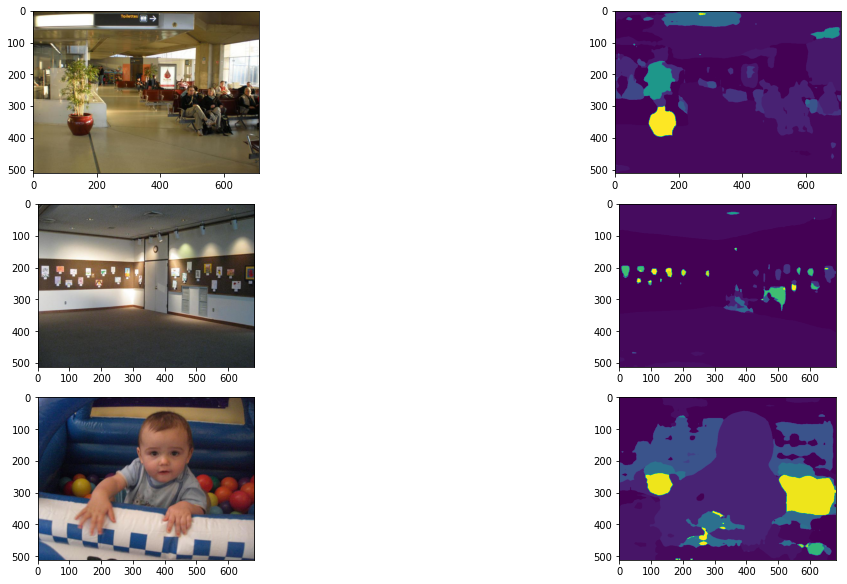

In [ ]:
visualize_performance_on_sample_image(new_FCN_model,"training",0)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


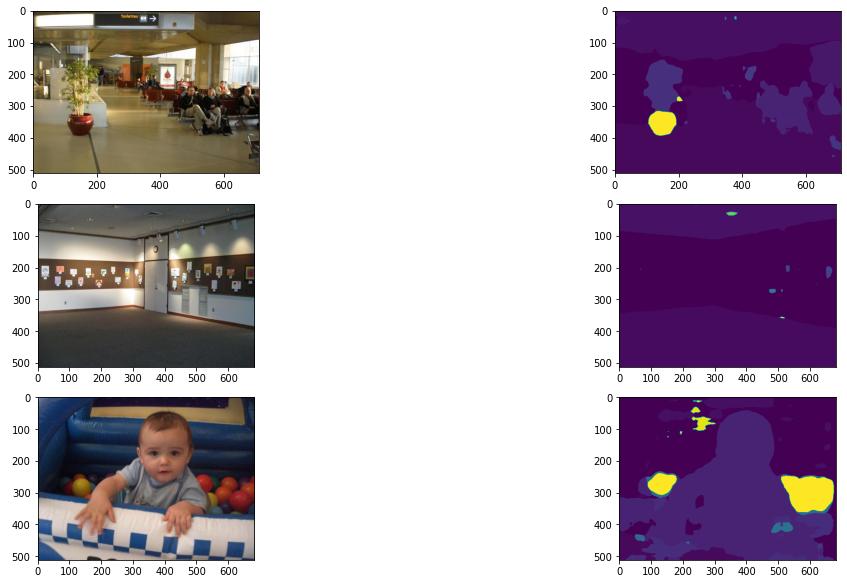

In [ ]:
visualize_performance_on_sample_image(new_deeplabv3,"training",0)

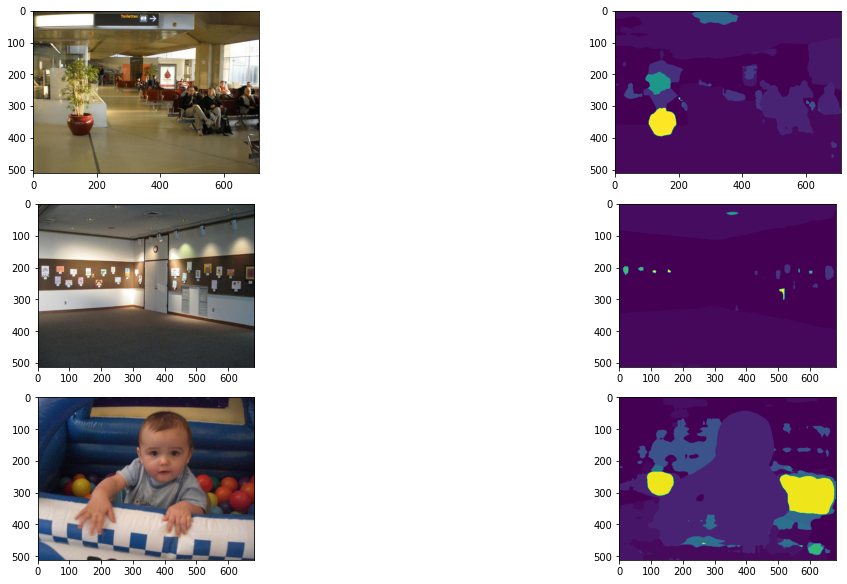

In [ ]:
visualize_performance_on_sample_image_ensemble(new_FCN_model,new_deeplabv3,dataset = "training",index = 0,weight = 0.7)

In [ ]:
new_FCN_model.to(device)
new_deeplabv3.to(device)
new_FCN_model.eval()
new_deeplabv3.eval()
evaluate_model_ensemble(new_FCN_model,new_deeplabv3,loss_f,validation_dataloader,0.8)

  0%|          | 1/500 [00:11<1:31:32, 11.01s/it]

initial validation loss:  0.17601467669010162
initial validation IOU:  66.77288880871647


 20%|██        | 100/500 [16:23<54:01,  8.10s/it]

validation loss per 100 itr 0.1464998123049736
validation mean IOU per 100 itr:  62.56379234405481


 40%|████      | 200/500 [28:47<34:07,  6.82s/it]

validation loss per 100 itr 0.15208094373345374
validation mean IOU per 100 itr:  61.351771814981795


 60%|██████    | 300/500 [38:47<19:18,  5.79s/it]

validation loss per 100 itr 0.15235987856984137
validation mean IOU per 100 itr:  62.097241437576756


 80%|████████  | 400/500 [47:05<08:21,  5.02s/it]

validation loss per 100 itr 0.15156591761857272
validation mean IOU per 100 itr:  61.45988210837943


100%|██████████| 500/500 [54:40<00:00,  6.56s/it]

validation loss per 100 itr 0.1434949855133891
validation mean IOU per 100 itr:  62.962132758374786
final mean IOU:  62.08696409267345
test loss:  0.1492003075480461


(0.1492003075480461, 62.08696409267345)

In [ ]:
weight_list = np.arange(0.1,1,0.05)
weight_list

array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 ,
       0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95])

In [ ]:
#pick the best weight
mean_IoU_list = []
validation_loss_list = []
new_FCN_model.to(device)
new_deeplabv3.to(device)
for weight in weight_list:
  loss,iou = evaluate_model_ensemble(new_FCN_model,new_deeplabv3,loss_f,validation_dataloader,weight)
  validation_loss_list.append(loss)
  mean_IoU_list.append(iou)
print("loss: ", validation_loss_list)
print("iou: ", mean_IoU_list)

  0%|          | 1/500 [00:06<54:31,  6.56s/it]

initial validation loss:  0.8015263080596924
initial validation IOU:  27.808509549414506


 20%|██        | 100/500 [09:02<29:13,  4.38s/it]

validation loss per 100 itr 0.6346749885380268
validation mean IOU per 100 itr:  38.58008651671884


 25%|██▌       | 126/500 [11:04<27:46,  4.46s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fc3a0a4f710>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1358, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1341, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.7/multiprocessing/process.py", line 151, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
 26%|██▌       | 128/500 [11:13<28:13,  4.55s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fc3a0a4f710>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1358, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/util

validation loss per 100 itr 0.6268052706122398
validation mean IOU per 100 itr:  40.024910914087194


 60%|██████    | 300/500 [22:16<11:10,  3.35s/it]

validation loss per 100 itr 0.632826450318098
validation mean IOU per 100 itr:  41.119204133360626


 80%|████████  | 400/500 [27:51<05:20,  3.20s/it]

validation loss per 100 itr 0.6495486128330231
validation mean IOU per 100 itr:  38.82345536501778


100%|██████████| 500/500 [33:06<00:00,  3.97s/it]


validation loss per 100 itr 0.6429709509015084
validation mean IOU per 100 itr:  40.24641042945678
final mean IOU:  39.758813471728246
test loss:  0.6373652546405792


  0%|          | 1/500 [00:02<24:14,  2.91s/it]

initial validation loss:  0.6785838603973389
initial validation IOU:  38.686437966460474


 20%|██        | 100/500 [05:08<20:33,  3.08s/it]

validation loss per 100 itr 0.5393755711615086
validation mean IOU per 100 itr:  42.59164575429252


 40%|████      | 200/500 [10:09<14:41,  2.94s/it]

validation loss per 100 itr 0.5262556998431682
validation mean IOU per 100 itr:  43.04264780368152


 60%|██████    | 300/500 [15:10<10:07,  3.04s/it]

validation loss per 100 itr 0.5157945537567139
validation mean IOU per 100 itr:  43.92193042889936


 80%|████████  | 400/500 [20:06<04:59,  3.00s/it]

validation loss per 100 itr 0.5489991250634193
validation mean IOU per 100 itr:  42.90800869266852


100%|██████████| 500/500 [25:00<00:00,  3.00s/it]


validation loss per 100 itr 0.4797789552807808
validation mean IOU per 100 itr:  43.7189345818123
final mean IOU:  43.236633452270866
test loss:  0.5220407810211182


  0%|          | 1/500 [00:02<24:22,  2.93s/it]

initial validation loss:  0.32304614782333374
initial validation IOU:  51.9663216689597


 20%|██        | 100/500 [04:54<19:32,  2.93s/it]

validation loss per 100 itr 0.4323048071563244
validation mean IOU per 100 itr:  46.45244549663628


 40%|████      | 200/500 [09:48<14:39,  2.93s/it]

validation loss per 100 itr 0.43305650979280474
validation mean IOU per 100 itr:  45.64157417329288


 60%|██████    | 300/500 [14:41<09:48,  2.94s/it]

validation loss per 100 itr 0.4373477973043919
validation mean IOU per 100 itr:  46.58250594887824


 80%|████████  | 400/500 [19:35<04:54,  2.95s/it]

validation loss per 100 itr 0.4135614812374115
validation mean IOU per 100 itr:  45.77836577760045


100%|██████████| 500/500 [24:30<00:00,  2.94s/it]


validation loss per 100 itr 0.43462897270917894
validation mean IOU per 100 itr:  45.11542649197997
final mean IOU:  45.91406357767756
test loss:  0.4301799136400223


  0%|          | 1/500 [00:02<24:31,  2.95s/it]

initial validation loss:  0.3914092481136322
initial validation IOU:  53.99281935842342


 20%|██        | 100/500 [04:54<19:43,  2.96s/it]

validation loss per 100 itr 0.3617883013188839
validation mean IOU per 100 itr:  48.62422848557793


 40%|████      | 200/500 [09:49<14:46,  2.95s/it]

validation loss per 100 itr 0.3985822719335556
validation mean IOU per 100 itr:  47.32753949926919


 60%|██████    | 300/500 [14:43<09:49,  2.95s/it]

validation loss per 100 itr 0.3757461307942867
validation mean IOU per 100 itr:  47.2766982001938


 80%|████████  | 400/500 [19:38<04:54,  2.94s/it]

validation loss per 100 itr 0.337210533618927
validation mean IOU per 100 itr:  49.71925027265817


100%|██████████| 500/500 [24:34<00:00,  2.95s/it]


validation loss per 100 itr 0.37196807757019995
validation mean IOU per 100 itr:  48.59160683350439
final mean IOU:  48.30786465824069
test loss:  0.3690590630471706


  0%|          | 1/500 [00:02<24:29,  2.94s/it]

initial validation loss:  0.14386902749538422
initial validation IOU:  65.18081114346504


 20%|██        | 100/500 [04:54<19:40,  2.95s/it]

validation loss per 100 itr 0.3324423388391733
validation mean IOU per 100 itr:  49.468903859997226


 40%|████      | 200/500 [09:50<14:48,  2.96s/it]

validation loss per 100 itr 0.31230239540338517
validation mean IOU per 100 itr:  50.72852088606364


 60%|██████    | 300/500 [14:45<09:54,  2.97s/it]

validation loss per 100 itr 0.3252026166766882
validation mean IOU per 100 itr:  49.29202752064761


 80%|████████  | 400/500 [19:41<04:56,  2.96s/it]

validation loss per 100 itr 0.33131291024386883
validation mean IOU per 100 itr:  51.62492542560945


100%|██████████| 500/500 [24:36<00:00,  2.95s/it]


validation loss per 100 itr 0.325137090831995
validation mean IOU per 100 itr:  50.6032982011702
final mean IOU:  50.343535178697586
test loss:  0.3252794703990221


  0%|          | 1/500 [00:02<24:35,  2.96s/it]

initial validation loss:  0.13824085891246796
initial validation IOU:  46.22856694693114


 20%|██        | 100/500 [04:55<19:36,  2.94s/it]

validation loss per 100 itr 0.27108184836804866
validation mean IOU per 100 itr:  54.16969090042081


 40%|████      | 200/500 [09:50<14:47,  2.96s/it]

validation loss per 100 itr 0.2803856482356787
validation mean IOU per 100 itr:  52.11322364448024


 60%|██████    | 300/500 [14:45<09:50,  2.95s/it]

validation loss per 100 itr 0.27093105286359787
validation mean IOU per 100 itr:  54.735861259422144


 80%|████████  | 400/500 [19:40<04:55,  2.96s/it]

validation loss per 100 itr 0.28566571086645126
validation mean IOU per 100 itr:  51.893838874621366


100%|██████████| 500/500 [24:35<00:00,  2.95s/it]


validation loss per 100 itr 0.2722019097954035
validation mean IOU per 100 itr:  53.18696879518007
final mean IOU:  53.21991669482492
test loss:  0.276053234025836


  0%|          | 1/500 [00:02<24:22,  2.93s/it]

initial validation loss:  0.16135264933109283
initial validation IOU:  66.62934882704108


 20%|██        | 100/500 [04:54<19:33,  2.93s/it]

validation loss per 100 itr 0.24412868648767472
validation mean IOU per 100 itr:  53.84506665153337


 40%|████      | 200/500 [09:49<14:41,  2.94s/it]

validation loss per 100 itr 0.2637090420722961
validation mean IOU per 100 itr:  53.301321693126376


 60%|██████    | 300/500 [14:43<09:47,  2.94s/it]

validation loss per 100 itr 0.2637558732926846
validation mean IOU per 100 itr:  53.79390218088233


 80%|████████  | 400/500 [19:37<04:52,  2.93s/it]

validation loss per 100 itr 0.2495219673961401
validation mean IOU per 100 itr:  53.174560941810924


100%|██████████| 500/500 [24:31<00:00,  2.94s/it]


validation loss per 100 itr 0.24376861087977886
validation mean IOU per 100 itr:  54.963250361915634
final mean IOU:  53.81562036585371
test loss:  0.25297683602571486


  0%|          | 1/500 [00:02<24:29,  2.94s/it]

initial validation loss:  0.1833769828081131
initial validation IOU:  56.730575031610286


 20%|██        | 100/500 [04:53<19:38,  2.95s/it]

validation loss per 100 itr 0.2337125562131405
validation mean IOU per 100 itr:  56.05444837997354


 40%|████      | 200/500 [09:47<14:41,  2.94s/it]

validation loss per 100 itr 0.23839048720896244
validation mean IOU per 100 itr:  54.937104746124476


 60%|██████    | 300/500 [14:41<09:43,  2.92s/it]

validation loss per 100 itr 0.23004636563360692
validation mean IOU per 100 itr:  56.27499387104259


 80%|████████  | 400/500 [19:34<04:53,  2.93s/it]

validation loss per 100 itr 0.23758720494806768
validation mean IOU per 100 itr:  55.041985906250694


100%|██████████| 500/500 [24:28<00:00,  2.94s/it]


validation loss per 100 itr 0.22268862418830396
validation mean IOU per 100 itr:  56.21566582727022
final mean IOU:  55.70483974613232
test loss:  0.2324850476384163


  0%|          | 1/500 [00:02<24:25,  2.94s/it]

initial validation loss:  0.218067467212677
initial validation IOU:  56.303241438699004


 20%|██        | 100/500 [04:53<19:35,  2.94s/it]

validation loss per 100 itr 0.19302802428603172
validation mean IOU per 100 itr:  58.79933925253112


 40%|████      | 200/500 [09:47<14:41,  2.94s/it]

validation loss per 100 itr 0.20947771817445754
validation mean IOU per 100 itr:  57.41381634985915


 60%|██████    | 300/500 [14:42<09:48,  2.94s/it]

validation loss per 100 itr 0.19398596182465552
validation mean IOU per 100 itr:  58.90715746481714


 80%|████████  | 400/500 [19:36<04:56,  2.97s/it]

validation loss per 100 itr 0.21081688366830348
validation mean IOU per 100 itr:  56.7911839859112


100%|██████████| 500/500 [24:32<00:00,  2.94s/it]


validation loss per 100 itr 0.1997890989482403
validation mean IOU per 100 itr:  57.88070245000695
final mean IOU:  57.9584399006251
test loss:  0.20141953738033772


  0%|          | 1/500 [00:02<24:50,  2.99s/it]

initial validation loss:  0.26846596598625183
initial validation IOU:  55.67307625942406


 20%|██        | 100/500 [04:57<19:53,  2.98s/it]

validation loss per 100 itr 0.1957089939340949
validation mean IOU per 100 itr:  58.7708778873676


 40%|████      | 200/500 [09:55<14:54,  2.98s/it]

validation loss per 100 itr 0.19037375338375567
validation mean IOU per 100 itr:  58.749035495118804


 60%|██████    | 300/500 [14:53<09:56,  2.98s/it]

validation loss per 100 itr 0.1919400255382061
validation mean IOU per 100 itr:  56.79959369957114


 80%|████████  | 400/500 [19:50<04:57,  2.98s/it]

validation loss per 100 itr 0.18401487704366445
validation mean IOU per 100 itr:  59.24098220823466


100%|██████████| 500/500 [24:48<00:00,  2.98s/it]


validation loss per 100 itr 0.18557959787547587
validation mean IOU per 100 itr:  59.594761449630695
final mean IOU:  58.631050147984546
test loss:  0.1895234495550394


  0%|          | 1/500 [00:02<24:55,  3.00s/it]

initial validation loss:  0.18451879918575287
initial validation IOU:  58.00666952715241


 20%|██        | 100/500 [04:57<19:54,  2.99s/it]

validation loss per 100 itr 0.18035675160586834
validation mean IOU per 100 itr:  60.09162422003214


 40%|████      | 200/500 [09:56<14:54,  2.98s/it]

validation loss per 100 itr 0.18015233386307955
validation mean IOU per 100 itr:  58.12048044670271


 60%|██████    | 300/500 [14:54<09:57,  2.99s/it]

validation loss per 100 itr 0.16807847142219542
validation mean IOU per 100 itr:  61.385231910383254


 80%|████████  | 400/500 [19:52<04:58,  2.98s/it]

validation loss per 100 itr 0.17103610705584288
validation mean IOU per 100 itr:  59.18332759072235


100%|██████████| 500/500 [24:51<00:00,  2.98s/it]


validation loss per 100 itr 0.16512256298214198
validation mean IOU per 100 itr:  60.53632623879214
final mean IOU:  59.863398081326515
test loss:  0.17294924538582562


  0%|          | 1/500 [00:02<24:47,  2.98s/it]

initial validation loss:  0.1248297318816185
initial validation IOU:  72.53634694679057


 20%|██        | 100/500 [04:58<19:51,  2.98s/it]

validation loss per 100 itr 0.16955692663788796
validation mean IOU per 100 itr:  60.5006444060865


 40%|████      | 200/500 [09:58<14:52,  2.98s/it]

validation loss per 100 itr 0.16410949483513831
validation mean IOU per 100 itr:  60.513277033195926


 60%|██████    | 300/500 [14:57<10:01,  3.01s/it]

validation loss per 100 itr 0.16321068536490202
validation mean IOU per 100 itr:  60.1432615575502


 80%|████████  | 400/500 [19:54<04:56,  2.97s/it]

validation loss per 100 itr 0.17013038590550422
validation mean IOU per 100 itr:  60.53173112690807


100%|██████████| 500/500 [24:50<00:00,  2.98s/it]


validation loss per 100 itr 0.171297504901886
validation mean IOU per 100 itr:  60.46359349740057
final mean IOU:  60.43050152422824
test loss:  0.16766099952906371


  0%|          | 1/500 [00:02<24:41,  2.97s/it]

initial validation loss:  0.24734391272068024
initial validation IOU:  51.23859212937797


 20%|██        | 100/500 [04:55<19:42,  2.96s/it]

validation loss per 100 itr 0.15971810400485992
validation mean IOU per 100 itr:  60.35405586439824


 40%|████      | 200/500 [09:51<14:44,  2.95s/it]

validation loss per 100 itr 0.15568150524049998
validation mean IOU per 100 itr:  61.385409806103524


 60%|██████    | 300/500 [14:45<09:47,  2.94s/it]

validation loss per 100 itr 0.15841639302670957
validation mean IOU per 100 itr:  61.48571752631208


 80%|████████  | 400/500 [19:40<04:55,  2.95s/it]

validation loss per 100 itr 0.1606304931640625
validation mean IOU per 100 itr:  61.71118957370332


100%|██████████| 500/500 [24:36<00:00,  2.95s/it]


validation loss per 100 itr 0.15738563872873784
validation mean IOU per 100 itr:  62.309507789429865
final mean IOU:  61.449176111989374
test loss:  0.15836642683297394


  0%|          | 1/500 [00:02<24:38,  2.96s/it]

initial validation loss:  0.14705973863601685
initial validation IOU:  64.56489249974145


 20%|██        | 100/500 [04:55<19:43,  2.96s/it]

validation loss per 100 itr 0.15256785294041036
validation mean IOU per 100 itr:  62.297606067005056


 40%|████      | 200/500 [09:51<14:49,  2.97s/it]

validation loss per 100 itr 0.14980891540646554
validation mean IOU per 100 itr:  62.9371731583733


 60%|██████    | 300/500 [14:47<09:51,  2.96s/it]

validation loss per 100 itr 0.15102022413164376
validation mean IOU per 100 itr:  62.69438424183646


 80%|████████  | 400/500 [19:43<04:56,  2.97s/it]

validation loss per 100 itr 0.1452610055729747
validation mean IOU per 100 itr:  61.572234065425675


100%|██████████| 500/500 [24:40<00:00,  2.96s/it]


validation loss per 100 itr 0.15397760279476644
validation mean IOU per 100 itr:  63.62079880231252
final mean IOU:  62.62443926699054
test loss:  0.15052712016925215


  0%|          | 1/500 [00:02<24:44,  2.97s/it]

initial validation loss:  0.1696058064699173
initial validation IOU:  53.77162933437235


 20%|██        | 100/500 [04:57<19:50,  2.98s/it]

validation loss per 100 itr 0.14679147940129042
validation mean IOU per 100 itr:  61.58553640903406


 40%|████      | 200/500 [09:55<14:53,  2.98s/it]

validation loss per 100 itr 0.1454964814335108
validation mean IOU per 100 itr:  62.88480637031685


 60%|██████    | 300/500 [14:53<09:53,  2.97s/it]

validation loss per 100 itr 0.1525596285611391
validation mean IOU per 100 itr:  62.05285825700256


 80%|████████  | 400/500 [19:51<04:58,  2.98s/it]

validation loss per 100 itr 0.15453519616276026
validation mean IOU per 100 itr:  62.33013570377877


100%|██████████| 500/500 [24:49<00:00,  2.98s/it]


validation loss per 100 itr 0.1456050546094775
validation mean IOU per 100 itr:  62.6845310625205
final mean IOU:  62.307573560530614
test loss:  0.14899756803363562


  0%|          | 1/500 [00:02<24:35,  2.96s/it]

initial validation loss:  0.07511655986309052
initial validation IOU:  62.28856644170724


 20%|██        | 100/500 [04:58<19:55,  2.99s/it]

validation loss per 100 itr 0.14131034603342413
validation mean IOU per 100 itr:  64.31532931505569


 40%|████      | 200/500 [09:57<14:57,  2.99s/it]

validation loss per 100 itr 0.14556655094027518
validation mean IOU per 100 itr:  62.995222374449604


 60%|██████    | 300/500 [14:55<09:59,  3.00s/it]

validation loss per 100 itr 0.15013850249350072
validation mean IOU per 100 itr:  62.97608688429503


 80%|████████  | 400/500 [19:54<04:58,  2.99s/it]

validation loss per 100 itr 0.14616279795765877
validation mean IOU per 100 itr:  62.902062434718076


100%|██████████| 500/500 [24:54<00:00,  2.99s/it]


validation loss per 100 itr 0.14374569937586784
validation mean IOU per 100 itr:  62.54667807811804
final mean IOU:  63.14707581732733
test loss:  0.14538477936014532


  0%|          | 1/500 [00:02<24:54,  2.99s/it]

initial validation loss:  0.1414385437965393
initial validation IOU:  74.14929294937157


 20%|██        | 100/500 [04:59<20:00,  3.00s/it]

validation loss per 100 itr 0.14256750747561456
validation mean IOU per 100 itr:  64.5681367270694


 40%|████      | 200/500 [09:59<14:57,  2.99s/it]

validation loss per 100 itr 0.14026696495711805
validation mean IOU per 100 itr:  63.47205880385769


 60%|██████    | 300/500 [14:59<09:58,  2.99s/it]

validation loss per 100 itr 0.13940316267311573
validation mean IOU per 100 itr:  62.6739498952314


 80%|████████  | 400/500 [19:59<04:59,  3.00s/it]

validation loss per 100 itr 0.14135108556598425
validation mean IOU per 100 itr:  63.34604931479106


100%|██████████| 500/500 [24:57<00:00,  3.00s/it]


validation loss per 100 itr 0.14620775997638702
validation mean IOU per 100 itr:  63.48171705065667
final mean IOU:  63.508382358321256
test loss:  0.14195929612964392


  0%|          | 1/500 [00:03<24:57,  3.00s/it]

initial validation loss:  0.10257655382156372
initial validation IOU:  68.19692035217379


 20%|██        | 100/500 [04:58<19:55,  2.99s/it]

validation loss per 100 itr 0.1369890873134136
validation mean IOU per 100 itr:  65.13158682727789


 40%|████      | 200/500 [09:57<14:56,  2.99s/it]

validation loss per 100 itr 0.14202428013086318
validation mean IOU per 100 itr:  65.47432651048561


 60%|██████    | 300/500 [14:56<09:57,  2.99s/it]

validation loss per 100 itr 0.14354126572608947
validation mean IOU per 100 itr:  63.86070481259463


 80%|████████  | 400/500 [19:55<04:57,  2.98s/it]

validation loss per 100 itr 0.14345939829945564
validation mean IOU per 100 itr:  63.060973734407405


100%|██████████| 500/500 [24:54<00:00,  2.99s/it]

validation loss per 100 itr 0.13874529764056207
validation mean IOU per 100 itr:  62.98123770470485
final mean IOU:  64.1017659178941
test loss:  0.1409518658220768
loss:  [0.6373652546405792, 0.5220407810211182, 0.4301799136400223, 0.3690590630471706, 0.3252794703990221, 0.276053234025836, 0.25297683602571486, 0.2324850476384163, 0.20141953738033772, 0.1895234495550394, 0.17294924538582562, 0.16766099952906371, 0.15836642683297394, 0.15052712016925215, 0.14899756803363562, 0.14538477936014532, 0.14195929612964392, 0.1409518658220768]
iou:  [39.758813471728246, 43.236633452270866, 45.91406357767756, 48.30786465824069, 50.343535178697586, 53.21991669482492, 53.81562036585371, 55.70483974613232, 57.9584399006251, 58.631050147984546, 59.863398081326515, 60.43050152422824, 61.449176111989374, 62.62443926699054, 62.307573560530614, 63.14707581732733, 63.508382358321256, 64.1017659178941]


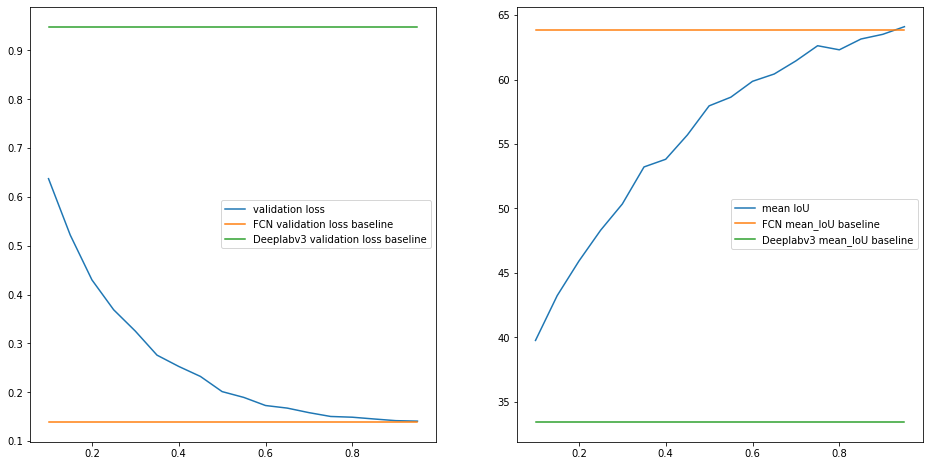

In [ ]:
from IPython.core.pylabtools import figsize
fig,ax = plt.subplots(1,2,figsize=(16,8))
ax[0].plot(weight_list,validation_loss_list,label = "validation loss")
ax[0].plot(weight_list,np.repeat(0.13913761889189483,len(weight_list)),label = "FCN validation loss baseline")
ax[0].plot(weight_list,np.repeat(0.948522412121296,len(weight_list)),label = "Deeplabv3 validation loss baseline")
ax[1].plot(weight_list,mean_IoU_list,label = "mean IoU")
ax[1].plot(weight_list,np.repeat(63.851236151348395,len(weight_list)),label = "FCN mean_IoU baseline")
ax[1].plot(weight_list,np.repeat(33.42754639826895,len(weight_list)),label = "Deeplabv3 mean_IoU baseline")
ax[1].legend()
ax[0].legend()
#plt.show()

In [ ]:
weight_list_2 = np.arange(0.1,1,0.1)
mean_IoU_list = []
validation_loss_list = []
new_FCN_model.to(device)
new_deeplabv3.to(device)
new_FCN_model.eval()
new_deeplabv3.eval()
for weight in weight_list_2:
  loss,iou = evaluate_model_ensemble(new_FCN_model,new_deeplabv3,loss_f,train_dataloader,weight)
  validation_loss_list.append(loss)
  mean_IoU_list.append(iou)
print("loss: ", validation_loss_list)
print("iou: ", mean_IoU_list)

  0%|          | 1/500 [00:07<1:00:43,  7.30s/it]

initial validation loss:  0.10503564029932022
initial validation IOU:  57.839583879069956


 20%|██        | 100/500 [09:32<33:21,  5.00s/it]

validation loss per 100 itr 0.21118301037698983
validation mean IOU per 100 itr:  55.73460373009217


 40%|████      | 200/500 [16:58<21:20,  4.27s/it]

validation loss per 100 itr 0.20641544453799723
validation mean IOU per 100 itr:  56.908955667742745


 60%|██████    | 300/500 [23:17<11:59,  3.60s/it]

validation loss per 100 itr 0.20593097135424615
validation mean IOU per 100 itr:  56.8721342042776


 80%|████████  | 400/500 [28:57<05:27,  3.27s/it]

validation loss per 100 itr 0.2201197163015604
validation mean IOU per 100 itr:  55.8742552455667


100%|██████████| 500/500 [34:21<00:00,  4.12s/it]


validation loss per 100 itr 0.21593294300138952
validation mean IOU per 100 itr:  55.05311486444893
final mean IOU:  56.08861274242561
test loss:  0.21191641711443662


  0%|          | 1/500 [00:03<25:23,  3.05s/it]

initial validation loss:  0.27826058864593506
initial validation IOU:  50.619513712110866


 20%|██        | 100/500 [05:15<21:09,  3.17s/it]

validation loss per 100 itr 0.18824026204645633
validation mean IOU per 100 itr:  58.127738408199775


 40%|████      | 200/500 [10:23<15:07,  3.02s/it]

validation loss per 100 itr 0.17553253673017025
validation mean IOU per 100 itr:  59.1430231894529


 60%|██████    | 300/500 [15:21<09:52,  2.96s/it]

validation loss per 100 itr 0.20438973784446715
validation mean IOU per 100 itr:  57.08809792523993


 80%|████████  | 400/500 [20:20<04:56,  2.97s/it]

validation loss per 100 itr 0.18967036053538322
validation mean IOU per 100 itr:  57.34697433230225


100%|██████████| 500/500 [25:16<00:00,  3.03s/it]


validation loss per 100 itr 0.19852133270353078
validation mean IOU per 100 itr:  56.475741234766495
final mean IOU:  57.636315017992295
test loss:  0.19127084597200156


  0%|          | 1/500 [00:02<24:36,  2.96s/it]

initial validation loss:  0.16268782317638397
initial validation IOU:  64.31433957476777


 20%|██        | 100/500 [04:54<19:36,  2.94s/it]

validation loss per 100 itr 0.15389822497963906
validation mean IOU per 100 itr:  60.523123281948386


 40%|████      | 200/500 [09:48<14:45,  2.95s/it]

validation loss per 100 itr 0.17270972538739443
validation mean IOU per 100 itr:  57.6685216477305


 60%|██████    | 300/500 [14:43<09:48,  2.94s/it]

validation loss per 100 itr 0.1654981518536806
validation mean IOU per 100 itr:  59.49339676658712


 80%|████████  | 400/500 [19:37<04:54,  2.94s/it]

validation loss per 100 itr 0.18019036300480365
validation mean IOU per 100 itr:  58.75552357225621


100%|██████████| 500/500 [24:30<00:00,  2.94s/it]


validation loss per 100 itr 0.16912589728832245
validation mean IOU per 100 itr:  58.74308122504925
final mean IOU:  59.03672929871428
test loss:  0.16828447250276804


  0%|          | 1/500 [00:02<24:32,  2.95s/it]

initial validation loss:  0.0819912925362587
initial validation IOU:  62.2092492650652


 20%|██        | 100/500 [04:53<19:34,  2.94s/it]

validation loss per 100 itr 0.1506812121719122
validation mean IOU per 100 itr:  59.48424535736911


 40%|████      | 200/500 [09:47<14:40,  2.94s/it]

validation loss per 100 itr 0.14714235473424198
validation mean IOU per 100 itr:  61.02513257032814


 60%|██████    | 300/500 [14:41<09:49,  2.95s/it]

validation loss per 100 itr 0.15536841310560703
validation mean IOU per 100 itr:  60.22564664104389


 80%|████████  | 400/500 [19:35<04:53,  2.93s/it]

validation loss per 100 itr 0.15034527018666266
validation mean IOU per 100 itr:  61.801539969100006


100%|██████████| 500/500 [24:29<00:00,  2.94s/it]


validation loss per 100 itr 0.15467932671308518
validation mean IOU per 100 itr:  60.82795270727074
final mean IOU:  60.67290344902242
test loss:  0.1516433153823018


  0%|          | 1/500 [00:02<24:29,  2.94s/it]

initial validation loss:  0.17451705038547516
initial validation IOU:  55.590967861744055


 20%|██        | 100/500 [04:53<19:32,  2.93s/it]

validation loss per 100 itr 0.13847497168928385
validation mean IOU per 100 itr:  61.90212358374118


 40%|████      | 200/500 [09:47<14:39,  2.93s/it]

validation loss per 100 itr 0.1394430748000741
validation mean IOU per 100 itr:  62.74420729808435


 60%|██████    | 300/500 [14:39<09:41,  2.91s/it]

validation loss per 100 itr 0.14384116917848588
validation mean IOU per 100 itr:  61.65837883115376


 80%|████████  | 400/500 [19:31<04:52,  2.92s/it]

validation loss per 100 itr 0.15802055463194847
validation mean IOU per 100 itr:  61.37139430276456


100%|██████████| 500/500 [24:23<00:00,  2.93s/it]


validation loss per 100 itr 0.15303479496389627
validation mean IOU per 100 itr:  61.8565614436684
final mean IOU:  61.90653309188243
test loss:  0.14656291305273772


  0%|          | 1/500 [00:02<23:57,  2.88s/it]

initial validation loss:  0.20346513390541077
initial validation IOU:  61.124198915579996


 20%|██        | 100/500 [04:51<19:22,  2.91s/it]

validation loss per 100 itr 0.13393907375633718
validation mean IOU per 100 itr:  62.75934541044752


 40%|████      | 200/500 [09:42<14:32,  2.91s/it]

validation loss per 100 itr 0.14214566253125668
validation mean IOU per 100 itr:  61.995449831608255


 60%|██████    | 300/500 [14:33<09:41,  2.91s/it]

validation loss per 100 itr 0.13733196932822467
validation mean IOU per 100 itr:  62.4281287287562


 80%|████████  | 400/500 [19:24<04:50,  2.91s/it]

validation loss per 100 itr 0.1392671524733305
validation mean IOU per 100 itr:  62.136747783579175


100%|██████████| 500/500 [24:14<00:00,  2.91s/it]


validation loss per 100 itr 0.14045402582734823
validation mean IOU per 100 itr:  62.421537597440995
final mean IOU:  62.34824187036641
test loss:  0.13862757678329946


  0%|          | 1/500 [00:02<24:11,  2.91s/it]

initial validation loss:  0.10471174120903015
initial validation IOU:  62.0159832187525


 20%|██        | 100/500 [04:51<19:27,  2.92s/it]

validation loss per 100 itr 0.13739471454173327
validation mean IOU per 100 itr:  61.162909245696675


 40%|████      | 200/500 [09:43<14:45,  2.95s/it]

validation loss per 100 itr 0.1300368072465062
validation mean IOU per 100 itr:  63.304436955531635


 60%|██████    | 300/500 [14:35<09:39,  2.90s/it]

validation loss per 100 itr 0.12976231664419174
validation mean IOU per 100 itr:  62.3709018556766


 80%|████████  | 400/500 [19:26<04:50,  2.91s/it]

validation loss per 100 itr 0.12921343222260476
validation mean IOU per 100 itr:  64.24961009195519


100%|██████████| 500/500 [24:17<00:00,  2.92s/it]


validation loss per 100 itr 0.13482377592474223
validation mean IOU per 100 itr:  63.21203265796378
final mean IOU:  62.85997816136475
test loss:  0.13224620931595563


  0%|          | 1/500 [00:02<24:09,  2.91s/it]

initial validation loss:  0.1027449294924736
initial validation IOU:  76.67320425005609


 20%|██        | 100/500 [04:51<19:23,  2.91s/it]

validation loss per 100 itr 0.13583977092057467
validation mean IOU per 100 itr:  62.55684081835116


 40%|████      | 200/500 [09:41<14:31,  2.91s/it]

validation loss per 100 itr 0.1352611144259572
validation mean IOU per 100 itr:  63.676885130780526


 60%|██████    | 300/500 [14:32<09:42,  2.91s/it]

validation loss per 100 itr 0.13948100548237563
validation mean IOU per 100 itr:  64.21076105870188


 80%|████████  | 400/500 [19:24<04:53,  2.94s/it]

validation loss per 100 itr 0.13162635084241628
validation mean IOU per 100 itr:  63.9403316943407


100%|██████████| 500/500 [24:15<00:00,  2.91s/it]


validation loss per 100 itr 0.12628964357078076
validation mean IOU per 100 itr:  65.14742689604049
final mean IOU:  63.90644911964293
test loss:  0.1336995770484209


  0%|          | 1/500 [00:02<24:19,  2.92s/it]

initial validation loss:  0.0748356282711029
initial validation IOU:  76.19281509265437


 20%|██        | 100/500 [04:51<19:23,  2.91s/it]

validation loss per 100 itr 0.13474986474961043
validation mean IOU per 100 itr:  64.84853955182561


 40%|████      | 200/500 [09:43<14:33,  2.91s/it]

validation loss per 100 itr 0.14242073021829127
validation mean IOU per 100 itr:  63.12776650388011


 60%|██████    | 300/500 [14:35<09:45,  2.93s/it]

validation loss per 100 itr 0.14067115243524314
validation mean IOU per 100 itr:  63.13178702986726


 80%|████████  | 400/500 [19:27<04:49,  2.90s/it]

validation loss per 100 itr 0.1434967479109764
validation mean IOU per 100 itr:  63.7510979693556


100%|██████████| 500/500 [24:17<00:00,  2.91s/it]

validation loss per 100 itr 0.13037665769457818
validation mean IOU per 100 itr:  62.8628967031376
final mean IOU:  63.5444175516132
test loss:  0.13834303060173989
loss:  [0.21191641711443662, 0.19127084597200156, 0.16828447250276804, 0.1516433153823018, 0.14656291305273772, 0.13862757678329946, 0.13224620931595563, 0.1336995770484209, 0.13834303060173989]
iou:  [56.08861274242561, 57.636315017992295, 59.03672929871428, 60.67290344902242, 61.90653309188243, 62.34824187036641, 62.85997816136475, 63.90644911964293, 63.5444175516132]


NameError: ignored

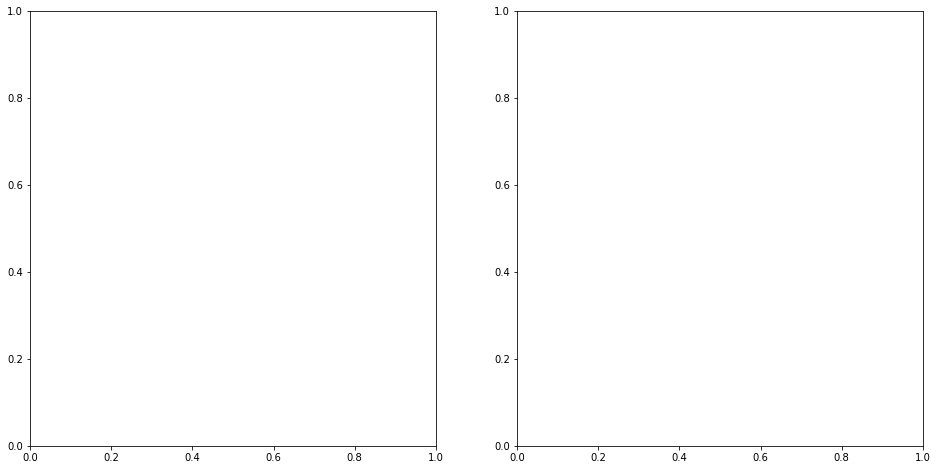

In [ ]:
from IPython.core.pylabtools import figsize
fig,ax = plt.subplots(1,2,figsize=(16,8))
ax[0].plot(weight_list,validation_loss_list,label = "validation loss")
ax[0].plot(weight_list,np.repeat(0.13913761889189483,len(weight_list)),label = "FCN validation loss baseline")
ax[0].plot(weight_list,np.repeat(0.948522412121296,len(weight_list)),label = "Deeplabv3 validation loss baseline")
ax[1].plot(weight_list,mean_IoU_list,label = "mean IoU")
ax[1].plot(weight_list,np.repeat(63.851236151348395,len(weight_list)),label = "FCN mean_IoU baseline")
ax[1].plot(weight_list,np.repeat(33.42754639826895,len(weight_list)),label = "Deeplabv3 mean_IoU baseline")
ax[1].legend()
ax[0].legend()

try model with low performance

In [29]:
new_FCN_model.to(device)
new_deeplabv3.to(device)
new_FCN_model.eval()
new_deeplabv3.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [ ]:
evaluate_model(new_FCN_model,loss_f,train_dataloader)

  0%|          | 1/500 [00:10<1:24:04, 10.11s/it]

initial validation loss:  1.153512716293335
initial validation IOU:  49.16309380263294


 20%|██        | 100/500 [14:43<57:57,  8.69s/it]

validation loss per 100 itr 1.1084007304906844
validation mean IOU per 100 itr:  28.640814304541934


 40%|████      | 200/500 [28:42<43:54,  8.78s/it]

validation loss per 100 itr 1.1277428689599036
validation mean IOU per 100 itr:  28.324499296040564


 60%|██████    | 300/500 [42:23<27:31,  8.26s/it]

validation loss per 100 itr 1.1998304823040962
validation mean IOU per 100 itr:  27.707304497027426


 80%|████████  | 400/500 [55:15<12:23,  7.44s/it]

validation loss per 100 itr 1.2129574444890023
validation mean IOU per 100 itr:  28.17247598400596


100%|██████████| 500/500 [1:08:04<00:00,  8.17s/it]

validation loss per 100 itr 1.0926330614089965
validation mean IOU per 100 itr:  30.020291961780217
final mean IOU:  28.57307720867924
test loss:  1.1483129175305367


(1.1483129175305367, 28.57307720867924)

In [ ]:
evaluate_model(new_deeplabv3,loss_f,train_dataloader)

  0%|          | 1/500 [00:06<57:29,  6.91s/it]

initial validation loss:  0.6848841905593872
initial validation IOU:  32.225514412357924


 20%|██        | 100/500 [12:20<44:10,  6.63s/it]

validation loss per 100 itr 0.9755763378739357
validation mean IOU per 100 itr:  31.717616833486737


 40%|████      | 200/500 [24:29<37:54,  7.58s/it]

validation loss per 100 itr 0.9907240352034569
validation mean IOU per 100 itr:  31.666025502765528


 60%|██████    | 300/500 [36:02<21:59,  6.60s/it]

validation loss per 100 itr 1.0053729444742203
validation mean IOU per 100 itr:  31.842904824578383


 80%|████████  | 400/500 [47:23<11:03,  6.63s/it]

validation loss per 100 itr 0.9752137140929699
validation mean IOU per 100 itr:  32.07399778262081


100%|██████████| 500/500 [58:22<00:00,  7.00s/it]

validation loss per 100 itr 0.9664347219467163
validation mean IOU per 100 itr:  32.20320253616857
final mean IOU:  31.900749495924
test loss:  0.9826643507182599


(0.9826643507182599, 31.900749495924)

In [31]:
weight_list_2 = np.arange(0.1,1,0.1)
mean_IoU_list = []
validation_loss_list = []
new_FCN_model.to(device)
new_deeplabv3.to(device)
new_FCN_model.eval()
new_deeplabv3.eval()
for weight in weight_list_2:
  loss,iou = evaluate_model_ensemble(new_FCN_model,new_deeplabv3,loss_f,train_dataloader,weight)
  validation_loss_list.append(loss)
  mean_IoU_list.append(iou)
print("loss: ", validation_loss_list)
print("iou: ", mean_IoU_list)

  0%|          | 1/500 [00:07<1:04:08,  7.71s/it]

initial validation loss:  0.5914926528930664
initial validation IOU:  40.00114532505368


 20%|██        | 100/500 [10:45<42:20,  6.35s/it]

validation loss per 100 itr 0.8784096057713032
validation mean IOU per 100 itr:  33.04088201647316


 40%|████      | 200/500 [21:45<34:32,  6.91s/it]

validation loss per 100 itr 0.8696099999547005
validation mean IOU per 100 itr:  31.57069172544847


 60%|██████    | 300/500 [33:11<20:46,  6.23s/it]

validation loss per 100 itr 0.9935086058080196
validation mean IOU per 100 itr:  30.49975774190861


 80%|████████  | 400/500 [44:23<10:59,  6.60s/it]

validation loss per 100 itr 0.9301796567440033
validation mean IOU per 100 itr:  33.5433493501783


100%|██████████| 500/500 [55:13<00:00,  6.63s/it]


validation loss per 100 itr 0.9483420121669769
validation mean IOU per 100 itr:  32.79238816544612
final mean IOU:  32.289413799890944
test loss:  0.9240099760890007


  0%|          | 1/500 [00:06<50:18,  6.05s/it]

initial validation loss:  0.9595713019371033
initial validation IOU:  39.33982595758682


 20%|██        | 100/500 [10:22<39:39,  5.95s/it]

validation loss per 100 itr 0.889866769015789
validation mean IOU per 100 itr:  32.83958532385282


 40%|████      | 200/500 [20:38<33:05,  6.62s/it]

validation loss per 100 itr 0.9269817380607128
validation mean IOU per 100 itr:  32.983336593763084


 60%|██████    | 300/500 [30:18<18:41,  5.61s/it]

validation loss per 100 itr 0.9142402663826943
validation mean IOU per 100 itr:  31.58479706514668


 80%|████████  | 400/500 [39:52<09:12,  5.52s/it]

validation loss per 100 itr 0.9363852885365486
validation mean IOU per 100 itr:  31.70838337199124


100%|██████████| 500/500 [49:30<00:00,  5.94s/it]


validation loss per 100 itr 0.9993913003802299
validation mean IOU per 100 itr:  30.47696183280432
final mean IOU:  31.918612837511642
test loss:  0.933373072475195


  0%|          | 1/500 [00:05<45:36,  5.48s/it]

initial validation loss:  1.1021687984466553
initial validation IOU:  18.472447816418352


 20%|██        | 100/500 [09:15<38:33,  5.78s/it]

validation loss per 100 itr 0.9190234220027924
validation mean IOU per 100 itr:  31.055566649002767


 40%|████      | 200/500 [18:31<28:21,  5.67s/it]

validation loss per 100 itr 0.8644686256349087
validation mean IOU per 100 itr:  32.01376543586956


 60%|██████    | 300/500 [27:36<17:38,  5.29s/it]

validation loss per 100 itr 1.008576867878437
validation mean IOU per 100 itr:  30.241738918649652


 80%|████████  | 400/500 [36:28<09:00,  5.40s/it]

validation loss per 100 itr 1.000558082163334
validation mean IOU per 100 itr:  30.701322874023372


100%|██████████| 500/500 [45:14<00:00,  5.43s/it]


validation loss per 100 itr 0.8860808944702149
validation mean IOU per 100 itr:  33.106666225532535
final mean IOU:  31.42381202061557
test loss:  0.9357415784299373


  0%|          | 1/500 [00:05<45:40,  5.49s/it]

initial validation loss:  1.315492868423462
initial validation IOU:  32.83746307508929


 20%|██        | 100/500 [08:34<33:47,  5.07s/it]

validation loss per 100 itr 0.9352541980147362
validation mean IOU per 100 itr:  32.21699259797261


 40%|████      | 200/500 [17:06<24:23,  4.88s/it]

validation loss per 100 itr 0.9094557201862336
validation mean IOU per 100 itr:  32.72106907727393


 60%|██████    | 300/500 [25:26<17:28,  5.24s/it]

validation loss per 100 itr 0.952407560646534
validation mean IOU per 100 itr:  31.63273361246631


 80%|████████  | 400/500 [33:53<09:31,  5.71s/it]

validation loss per 100 itr 0.869997287094593
validation mean IOU per 100 itr:  30.612031555500156


100%|██████████| 500/500 [42:04<00:00,  5.05s/it]


validation loss per 100 itr 0.9034386643767357
validation mean IOU per 100 itr:  31.751714869690378
final mean IOU:  31.786908342580713
test loss:  0.9141106860637664


  0%|          | 1/500 [00:04<40:03,  4.82s/it]

initial validation loss:  0.9062870740890503
initial validation IOU:  28.319817710760415


 20%|██        | 100/500 [08:01<31:26,  4.72s/it]

validation loss per 100 itr 0.9606471320986748
validation mean IOU per 100 itr:  30.715190976636656


 40%|████      | 200/500 [15:57<23:42,  4.74s/it]

validation loss per 100 itr 0.9008273813128471
validation mean IOU per 100 itr:  31.71984181025164


 60%|██████    | 300/500 [24:06<15:56,  4.78s/it]

validation loss per 100 itr 0.9683192437887191
validation mean IOU per 100 itr:  31.099196543695676


 80%|████████  | 400/500 [32:06<08:14,  4.95s/it]

validation loss per 100 itr 0.9544409449398518
validation mean IOU per 100 itr:  30.298512017534094


100%|██████████| 500/500 [40:08<00:00,  4.82s/it]


validation loss per 100 itr 0.8804697170853615
validation mean IOU per 100 itr:  30.827575715976767
final mean IOU:  30.932063412818977
test loss:  0.9329408838450909


  0%|          | 1/500 [00:04<40:21,  4.85s/it]

initial validation loss:  0.7800255417823792
initial validation IOU:  35.7401679434953


 20%|██        | 100/500 [07:51<33:05,  4.96s/it]

validation loss per 100 itr 0.9115057921409607
validation mean IOU per 100 itr:  30.04113420849017


 40%|████      | 200/500 [15:41<23:26,  4.69s/it]

validation loss per 100 itr 0.9588249570131302
validation mean IOU per 100 itr:  29.745336906276652


 60%|██████    | 300/500 [23:27<16:58,  5.09s/it]

validation loss per 100 itr 0.9546855939924717
validation mean IOU per 100 itr:  31.70628845890963


 80%|████████  | 400/500 [31:13<07:18,  4.39s/it]

validation loss per 100 itr 0.9482233181595803
validation mean IOU per 100 itr:  31.000505969601523


100%|██████████| 500/500 [38:56<00:00,  4.67s/it]


validation loss per 100 itr 0.9233694076538086
validation mean IOU per 100 itr:  31.88037509282052
final mean IOU:  30.874728127219687
test loss:  0.9393218137919903


  0%|          | 1/500 [00:04<40:55,  4.92s/it]

initial validation loss:  1.581978440284729
initial validation IOU:  32.10474186223431


 20%|██        | 100/500 [07:49<29:31,  4.43s/it]

validation loss per 100 itr 1.025162145793438
validation mean IOU per 100 itr:  30.82178571020909


 40%|████      | 200/500 [15:39<23:30,  4.70s/it]

validation loss per 100 itr 0.9888597577810287
validation mean IOU per 100 itr:  28.553103709546253


 60%|██████    | 300/500 [23:23<16:32,  4.96s/it]

validation loss per 100 itr 0.9928771667182446
validation mean IOU per 100 itr:  29.838159518652105


 80%|████████  | 400/500 [31:05<07:42,  4.63s/it]

validation loss per 100 itr 0.9854742357134819
validation mean IOU per 100 itr:  28.52713603490195


100%|██████████| 500/500 [38:49<00:00,  4.66s/it]


validation loss per 100 itr 1.0722685536742211
validation mean IOU per 100 itr:  28.233763539773523
final mean IOU:  29.1947897026166
test loss:  1.0129283719360829


  0%|          | 1/500 [00:04<35:40,  4.29s/it]

initial validation loss:  0.6984159350395203
initial validation IOU:  27.654602366610227


 20%|██        | 100/500 [07:31<29:34,  4.44s/it]

validation loss per 100 itr 1.0673149219155311
validation mean IOU per 100 itr:  30.011020318782563


 40%|████      | 200/500 [15:11<22:07,  4.43s/it]

validation loss per 100 itr 0.9617947342991829
validation mean IOU per 100 itr:  30.163718025487146


 60%|██████    | 300/500 [22:48<15:03,  4.52s/it]

validation loss per 100 itr 1.0695493069291115
validation mean IOU per 100 itr:  29.640100433194252


 80%|████████  | 400/500 [30:26<07:13,  4.33s/it]

validation loss per 100 itr 0.9956853345036507
validation mean IOU per 100 itr:  30.325983240523566


100%|██████████| 500/500 [38:02<00:00,  4.56s/it]


validation loss per 100 itr 1.0333394345641136
validation mean IOU per 100 itr:  28.232677057798956
final mean IOU:  29.67469981515732
test loss:  1.025536746442318


  0%|          | 1/500 [00:04<35:26,  4.26s/it]

initial validation loss:  0.7036890983581543
initial validation IOU:  27.58313912087256


 20%|██        | 100/500 [07:30<29:18,  4.40s/it]

validation loss per 100 itr 1.1001010406017304
validation mean IOU per 100 itr:  28.583586172642736


 40%|████      | 200/500 [15:02<21:51,  4.37s/it]

validation loss per 100 itr 1.0557966995239259
validation mean IOU per 100 itr:  29.51251993881777


 60%|██████    | 300/500 [22:44<15:56,  4.78s/it]

validation loss per 100 itr 1.1190889447927475
validation mean IOU per 100 itr:  29.657626331875427


 80%|████████  | 400/500 [30:22<07:49,  4.69s/it]

validation loss per 100 itr 1.0788571032881737
validation mean IOU per 100 itr:  27.814448171738437


100%|██████████| 500/500 [38:01<00:00,  4.56s/it]

validation loss per 100 itr 1.0780342385172843
validation mean IOU per 100 itr:  30.409789153083462
final mean IOU:  29.195593953631576
test loss:  1.0863756053447724
loss:  [0.9240099760890007, 0.933373072475195, 0.9357415784299373, 0.9141106860637664, 0.9329408838450909, 0.9393218137919903, 1.0129283719360829, 1.025536746442318, 1.0863756053447724]
iou:  [32.289413799890944, 31.918612837511642, 31.42381202061557, 31.786908342580713, 30.932063412818977, 30.874728127219687, 29.1947897026166, 29.67469981515732, 29.195593953631576]


# Result for Report

In [32]:
model_name_9 = "new_FCN10"
path = '/content/drive/MyDrive/6.869/{model_name_9}'
new_FCN_model.load_state_dict(torch.load(path))

deeplabv3_10 = "new_deeplabv3_10"
path = '/content/drive/MyDrive/6.869/{deeplabv3_10}'
new_deeplabv3.load_state_dict(torch.load(path))

new_FCN_model.to(device)
new_deeplabv3.to(device)
new_FCN_model.eval()
new_deeplabv3.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [35]:
fcn_class_iou = evaluate_class_iou(new_FCN_model,train_dataloader)
print(fcn_class_iou)

100%|██████████| 500/500 [1:12:26<00:00,  8.69s/it]

[0.7262291592763391, 0.6046341240040297, 0.2236503856041131, 0.6115505849548403, 0.0, 0.6247315902488316, 0.7692230633828012, 0.2619514992073932, 0.5569368902702236, nan, 0.6031315920355348, 0.0, nan, nan, nan, 0.12002918642831084, nan, nan, nan, 0.11500504654031625, 0.7225514334599173, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0, 0.0, nan, nan, 0.2822363591876682, nan, 0.0, 0.4068441064638783, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.4947562358276644, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0, nan, nan, nan, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.652648954566892, nan, nan, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.677050

In [36]:
deeplab_class_iou = evaluate_class_iou(new_deeplabv3,train_dataloader)
print(deeplab_class_iou)

100%|██████████| 500/500 [1:01:49<00:00,  7.42s/it]

[0.7246491454647208, 0.7662706054938714, 0.5386005421142456, 0.3272751392942425, nan, 0.9096045197740112, nan, 0.6467872467546576, 0.18494679470542436, nan, 0.0, 0.614688451065193, 0.8709092967953799, nan, 0.2800844190105118, 0.4981415626946336, nan, 0.02186213229848624, 0.31166056166056166, 0.5969611873552999, 0.3427681121786549, nan, 0.8855446355446356, nan, nan, nan, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.47692307692307695, nan, nan, nan, 0.7200906871294036, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0, nan, nan, nan, nan, nan, 0.0, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0, nan, nan, 0.12120195854852774, 0.0, nan, nan, nan, nan, nan, 0.17643475082246862, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.04110758721639424

In [37]:
ensemble_class_iou = evaluate_class_iou_ensemble(new_FCN_model,new_deeplabv3,train_dataloader,0.2)
print(ensemble_class_iou)

100%|██████████| 500/500 [54:57<00:00,  6.59s/it]

[0.7802396269845954, 0.6283673293743007, 0.0, 0.6317122662708194, 0.48025678033648567, 0.8107634543178974, 0.25922606169252643, 0.94804046753757, 0.00048348106365834006, nan, nan, nan, nan, nan, 0.0014466546112115732, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0, nan, nan, nan, 0.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0006919517363663884, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 0.0, nan, nan, nan, 0.0, nan, 0.43158579112240675, 0.748258022070038, 0.8823199194087927, 0.14333722102516458, 0.950716

In [68]:
deeplab_list = np.asarray(deeplab_class_iou).reshape(499,150)
deeplab_list = np.nanmean(deeplab_list,axis=0)
fcn_list = np.asarray(fcn_class_iou).reshape(499,150)
fcn_list = np.nanmean(fcn_list,axis=0)
ensemble_list = np.asarray(ensemble_class_iou).reshape(499,150)
ensemble_list = np.nanmean(ensemble_list,axis=0)


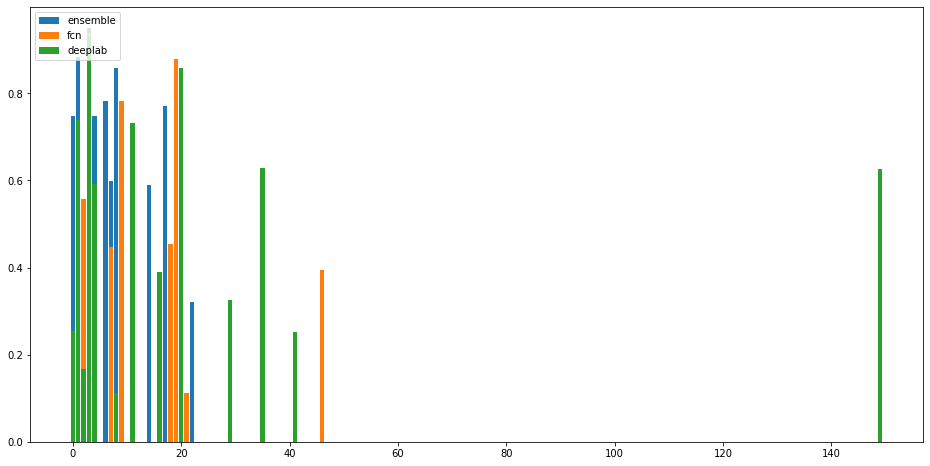

In [67]:
temp1 = deeplab_class_iou[151:301]
temp2 = fcn_class_iou[151:301]
temp3 = ensemble_class_iou[151:301]
fig = plt.subplots(figsize =(16, 8))
plt.bar(np.arange(0,150), temp3,label = "ensemble")
plt.bar(np.arange(0,150), temp2,label = "fcn")
plt.bar(np.arange(0,150), temp1, label = "deeplab")
plt.legend()

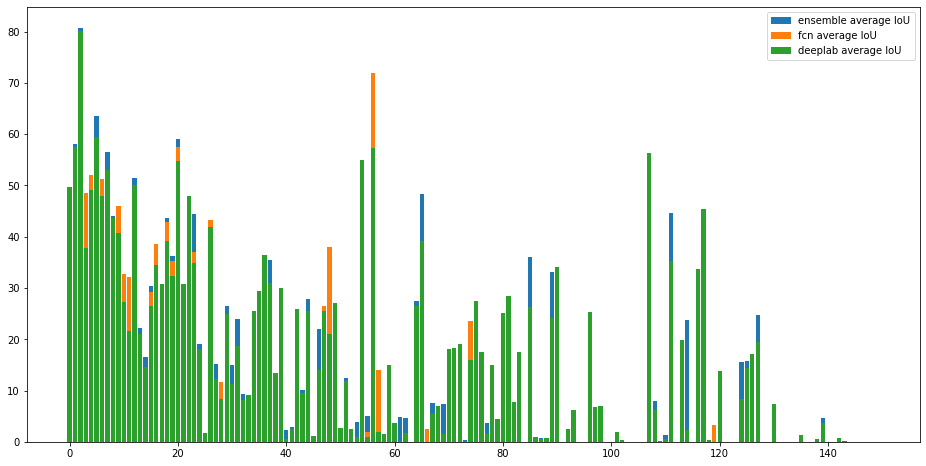

In [95]:
fig = plt.subplots(figsize =(16, 8))
plt.bar(np.arange(0,150), ensemble_list*100,label = "ensemble average IoU")
plt.bar(np.arange(0,150), fcn_list*100,label = "fcn average IoU")
plt.bar(np.arange(0,150), deeplab_list*100, label = "deeplab average IoU")
plt.legend()

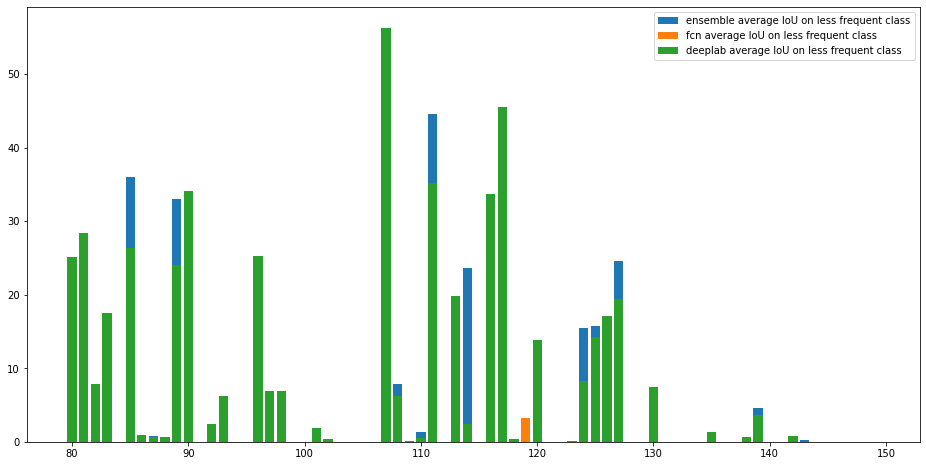

In [105]:
ensemble_list2 = ensemble_list[80:150]
fcn_list2 = fcn_list[80:150]
deeplab_list2 = deeplab_list[80:150]
fig = plt.subplots(figsize =(16, 8))
plt.bar(np.arange(80,150), ensemble_list2*100,label = "ensemble average IoU on less frequent class")
plt.bar(np.arange(80,150), fcn_list2*100,label = "fcn average IoU on less frequent class")
plt.bar(np.arange(80,150), deeplab_list2*100, label = "deeplab average IoU on less frequent class")
plt.legend()

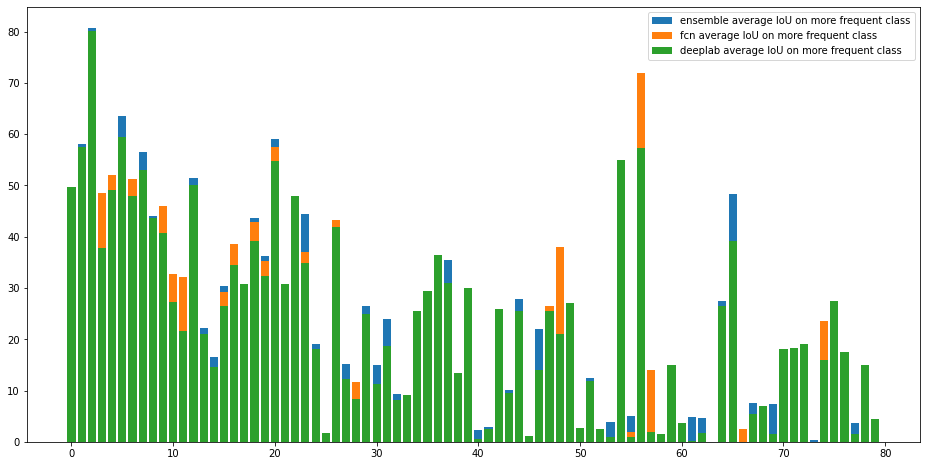

In [115]:
ensemble_list3 = ensemble_list[0:80]
fcn_list3 = fcn_list[0:80]
deeplab_list3 = deeplab_list[0:80]
fig = plt.subplots(figsize =(16, 8))
plt.bar(np.arange(0,80), ensemble_list3*100,label = "ensemble average IoU on more frequent class")
plt.bar(np.arange(0,80), fcn_list3*100,label = "fcn average IoU on more frequent class")
plt.bar(np.arange(0,80), deeplab_list3*100, label = "deeplab average IoU on more frequent class")
plt.legend()

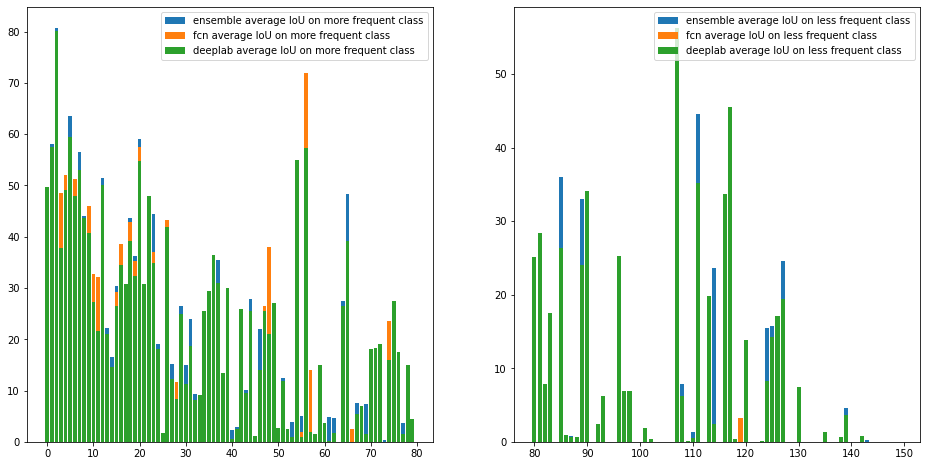

In [114]:
fig,ax = plt.subplots(1,2,figsize=(16,8))
ax[1].bar(np.arange(80,150), ensemble_list2*100,label = "ensemble average IoU on less frequent class")
ax[1].bar(np.arange(80,150), fcn_list2*100,label = "fcn average IoU on less frequent class")
ax[1].bar(np.arange(80,150), deeplab_list2*100, label = "deeplab average IoU on less frequent class")
ax[1].legend()
ax[0].bar(np.arange(0,80), ensemble_list3*100,label = "ensemble average IoU on more frequent class")
ax[0].bar(np.arange(0,80), fcn_list3*100,label = "fcn average IoU on more frequent class")
ax[0].bar(np.arange(0,80), deeplab_list3*100, label = "deeplab average IoU on more frequent class")
ax[0].legend()

In [81]:
fcn_avg_test_loss,fcn_avg_iou,fcn_avg_accuracy = evaluate_model(new_FCN_model,loss_f,train_dataloader)

  0%|          | 1/500 [00:10<1:26:46, 10.43s/it]

initial validation loss:  0.5690383911132812
initial validation IOU:  32.38877317858804
initial validation accuracy  0.7427289485931396


 20%|██        | 100/500 [16:53<1:06:31,  9.98s/it]

validation loss per 100 itr 1.1632144671678544
validation mean IOU per 100 itr:  27.728405551873447
validation mean accuracy per 100 iter  0.5296594406664371


 40%|████      | 200/500 [33:00<48:05,  9.62s/it]

validation loss per 100 itr 1.1924693614244462
validation mean IOU per 100 itr:  29.18365570190945
validation mean accuracy per 100 iter  0.5346454022824765


 60%|██████    | 300/500 [48:12<32:13,  9.67s/it]

validation loss per 100 itr 1.2046625092625618
validation mean IOU per 100 itr:  27.633456210102693
validation mean accuracy per 100 iter  0.5289092163741589


 80%|████████  | 400/500 [1:02:44<15:00,  9.01s/it]

validation loss per 100 itr 1.1828450405597686
validation mean IOU per 100 itr:  28.650012577160687
validation mean accuracy per 100 iter  0.5493079227209091


100%|██████████| 500/500 [1:16:30<00:00,  9.18s/it]

validation loss per 100 itr 1.1154674315452575
validation mean IOU per 100 itr:  27.598483146108478
validation mean accuracy per 100 iter  0.5408931690454483
final mean IOU:  28.158802637430945
test loss:  1.1717317619919776
test accuracy:  0.536683030217886


In [82]:
deeplab_avg_test_loss,deeplab_avg_iou,deeplab_avg_accuracy = evaluate_model(new_deeplabv3,loss_f,train_dataloader)

  0%|          | 1/500 [00:09<1:17:10,  9.28s/it]

initial validation loss:  0.4917524456977844
initial validation IOU:  27.827780327607716
initial validation accuracy  0.5344271063804626


 20%|██        | 100/500 [13:22<52:42,  7.91s/it]

validation loss per 100 itr 0.9300252643227577
validation mean IOU per 100 itr:  30.489094647456294
validation mean accuracy per 100 iter  0.5527600726485252


 40%|████      | 200/500 [26:23<43:34,  8.71s/it]

validation loss per 100 itr 0.9262313449382782
validation mean IOU per 100 itr:  32.6900602762223
validation mean accuracy per 100 iter  0.5753956922888755


 60%|██████    | 300/500 [39:03<25:23,  7.62s/it]

validation loss per 100 itr 0.9236130632460118
validation mean IOU per 100 itr:  29.916215791226655
validation mean accuracy per 100 iter  0.551399731785059


 80%|████████  | 400/500 [51:09<11:53,  7.14s/it]

validation loss per 100 itr 0.9319978421926498
validation mean IOU per 100 itr:  31.338276383703477
validation mean accuracy per 100 iter  0.5665488098561764


100%|██████████| 500/500 [1:03:24<00:00,  7.61s/it]

validation loss per 100 itr 0.9582505284249783
validation mean IOU per 100 itr:  32.08127557273704
validation mean accuracy per 100 iter  0.561307860314846
final mean IOU:  31.302984534269143
test loss:  0.9340236086249352
test accuracy:  0.5614824333786964


In [84]:
weight_list = np.arange(0.1,1,0.1)
mean_IoU_list = []
mean_accuracy_list = []
validation_loss_list = []

new_FCN_model.to(device)
new_deeplabv3.to(device)
new_FCN_model.eval()
new_deeplabv3.eval()
for weight in weight_list:
  loss,iou,accuracy = evaluate_model_ensemble(new_FCN_model,new_deeplabv3,loss_f,train_dataloader,weight)
  validation_loss_list.append(loss)
  mean_IoU_list.append(iou)
  mean_accuracy_list.append(accuracy)

print("loss: ", validation_loss_list)
print("iou: ", mean_IoU_list)
print("accuracy: ", mean_accuracy_list)

  0%|          | 1/500 [00:08<1:13:11,  8.80s/it]

initial validation loss:  0.6332060098648071
initial validation IOU:  30.851875943436983
initial validation accuracy:  0.5879231691360474


 20%|██        | 100/500 [12:16<51:09,  7.67s/it]

validation loss per 100 itr 0.9545140847563743
validation mean IOU per 100 itr:  31.408044880311454
validation mean accuracy per 100 ite  0.5634347057342529


 40%|████      | 200/500 [24:09<34:23,  6.88s/it]

validation loss per 100 itr 0.8965141722559928
validation mean IOU per 100 itr:  30.644039030017947
validation mean accuracy per 100 ite  0.5467735700309276


 60%|██████    | 300/500 [35:51<20:42,  6.21s/it]

validation loss per 100 itr 1.0228083714842797
validation mean IOU per 100 itr:  30.482978031296728
validation mean accuracy per 100 ite  0.5613887812197208


 80%|████████  | 400/500 [47:22<13:18,  7.98s/it]

validation loss per 100 itr 0.9540148758888245
validation mean IOU per 100 itr:  30.330517424512706
validation mean accuracy per 100 ite  0.5581385758519173


100%|██████████| 500/500 [58:21<00:00,  7.00s/it]


validation loss per 100 itr 0.9369119171798229
validation mean IOU per 100 itr:  31.286569840019204
validation mean accuracy per 100 ite  0.569736101925373
final mean IOU:  30.830429841231602
test loss:  0.9529526843130589
validation mean accuracy:  0.5598943469524383


  0%|          | 1/500 [00:07<1:04:34,  7.76s/it]

initial validation loss:  0.7032389640808105
initial validation IOU:  32.15960150705958
initial validation accuracy:  0.7327061891555786


 20%|██        | 100/500 [11:15<43:04,  6.46s/it]

validation loss per 100 itr 0.9078887920081615
validation mean IOU per 100 itr:  31.59754398620146
validation mean accuracy per 100 ite  0.5750709792971611


 40%|████      | 200/500 [21:59<29:24,  5.88s/it]

validation loss per 100 itr 0.9186120450496673
validation mean IOU per 100 itr:  31.284098662895875
validation mean accuracy per 100 ite  0.5604673229157925


 60%|██████    | 300/500 [32:45<22:47,  6.84s/it]

validation loss per 100 itr 0.9051183387637138
validation mean IOU per 100 itr:  32.01784239150741
validation mean accuracy per 100 ite  0.5856332129240036


 80%|████████  | 400/500 [43:02<10:22,  6.23s/it]

validation loss per 100 itr 0.9174693456292152
validation mean IOU per 100 itr:  30.546485650718278
validation mean accuracy per 100 ite  0.5759542006254196


100%|██████████| 500/500 [53:12<00:00,  6.39s/it]


validation loss per 100 itr 0.8842530593276023
validation mean IOU per 100 itr:  32.353488497611025
validation mean accuracy per 100 ite  0.5905943085253239
final mean IOU:  31.559891837786832
test loss:  0.9066683161556721
validation mean accuracy:  0.5775440048575401


  0%|          | 1/500 [00:06<52:15,  6.28s/it]

initial validation loss:  0.4309420585632324
initial validation IOU:  42.69343045297697
initial validation accuracy:  0.8113498687744141


 20%|██        | 100/500 [09:49<38:23,  5.76s/it]

validation loss per 100 itr 1.0123206621408463
validation mean IOU per 100 itr:  31.429409555974026
validation mean accuracy per 100 ite  0.5499488279223442


 40%|████      | 200/500 [19:44<28:26,  5.69s/it]

validation loss per 100 itr 0.9543673905730248
validation mean IOU per 100 itr:  31.057758962014383
validation mean accuracy per 100 ite  0.567677044570446


 60%|██████    | 300/500 [29:24<18:20,  5.50s/it]

validation loss per 100 itr 0.9177463388442993
validation mean IOU per 100 itr:  30.390341819350464
validation mean accuracy per 100 ite  0.5629570889472961


 80%|████████  | 400/500 [38:55<09:42,  5.82s/it]

validation loss per 100 itr 0.9379239937663079
validation mean IOU per 100 itr:  31.60189304069468
validation mean accuracy per 100 ite  0.5791784633696079


100%|██████████| 500/500 [48:09<00:00,  5.78s/it]


validation loss per 100 itr 0.9012333101034165
validation mean IOU per 100 itr:  31.41851408567871
validation mean accuracy per 100 ite  0.5678160530328751
final mean IOU:  31.17958349274247
test loss:  0.9447183390855789
validation mean accuracy:  0.5655154955685139


  0%|          | 1/500 [00:06<52:57,  6.37s/it]

initial validation loss:  0.3748164176940918
initial validation IOU:  49.42267637368009
initial validation accuracy:  0.5854937434196472


 20%|██        | 100/500 [09:12<37:15,  5.59s/it]

validation loss per 100 itr 1.0002176965773106
validation mean IOU per 100 itr:  30.70844067788406
validation mean accuracy per 100 ite  0.5714515875279903


 40%|████      | 200/500 [18:19<26:07,  5.23s/it]

validation loss per 100 itr 0.9217172268033028
validation mean IOU per 100 itr:  30.299070877568703
validation mean accuracy per 100 ite  0.5801561444997787


 60%|██████    | 300/500 [28:00<21:20,  6.40s/it]

validation loss per 100 itr 0.849667375087738
validation mean IOU per 100 itr:  32.388398505430075
validation mean accuracy per 100 ite  0.5930698177218438


 80%|████████  | 400/500 [37:11<09:15,  5.56s/it]

validation loss per 100 itr 1.0255008298158645
validation mean IOU per 100 itr:  29.635871711607873
validation mean accuracy per 100 ite  0.5564892287552357


100%|██████████| 500/500 [46:13<00:00,  5.55s/it]


validation loss per 100 itr 0.9304028299450874
validation mean IOU per 100 itr:  31.240811520158474
validation mean accuracy per 100 ite  0.5756586487591266
final mean IOU:  30.85451865852983
test loss:  0.9455011916458607
validation mean accuracy:  0.5753650854527951


  0%|          | 1/500 [00:04<41:01,  4.93s/it]

initial validation loss:  0.8441331386566162
initial validation IOU:  38.9731292938084
initial validation accuracy:  0.6793966889381409


 20%|██        | 100/500 [08:43<35:10,  5.28s/it]

validation loss per 100 itr 0.9845749601721764
validation mean IOU per 100 itr:  30.429944583047824
validation mean accuracy per 100 ite  0.5609875118732452


 40%|████      | 200/500 [17:22<23:48,  4.76s/it]

validation loss per 100 itr 0.9684839695692062
validation mean IOU per 100 itr:  31.230369690300105
validation mean accuracy per 100 ite  0.5766442623734475


 60%|██████    | 300/500 [25:46<15:36,  4.68s/it]

validation loss per 100 itr 1.001147172152996
validation mean IOU per 100 itr:  30.303263295109012
validation mean accuracy per 100 ite  0.5509775274991989


 80%|████████  | 400/500 [33:59<08:00,  4.80s/it]

validation loss per 100 itr 0.8972713819146156
validation mean IOU per 100 itr:  30.842731803997236
validation mean accuracy per 100 ite  0.5825026407837868


100%|██████████| 500/500 [42:15<00:00,  5.07s/it]


validation loss per 100 itr 0.8778629830479622
validation mean IOU per 100 itr:  31.003892647460674
validation mean accuracy per 100 ite  0.5755745263397694
final mean IOU:  30.762040403982972
test loss:  0.9458680933713913
validation mean accuracy:  0.5693372937738895


  0%|          | 1/500 [00:06<53:02,  6.38s/it]

initial validation loss:  0.955945611000061
initial validation IOU:  40.375276211953675
initial validation accuracy:  0.43627604842185974


 20%|██        | 100/500 [08:09<34:56,  5.24s/it]

validation loss per 100 itr 0.914133889079094
validation mean IOU per 100 itr:  31.94191847219224
validation mean accuracy per 100 ite  0.5717238506674767


 40%|████      | 200/500 [16:16<24:28,  4.90s/it]

validation loss per 100 itr 0.9099538055062294
validation mean IOU per 100 itr:  30.938847165173257
validation mean accuracy per 100 ite  0.5711178947985173


 60%|██████    | 300/500 [24:24<16:21,  4.91s/it]

validation loss per 100 itr 0.9463593038916588
validation mean IOU per 100 itr:  31.18799439696937
validation mean accuracy per 100 ite  0.5720046755671501


 80%|████████  | 400/500 [32:06<07:45,  4.65s/it]

validation loss per 100 itr 0.9965354174375534
validation mean IOU per 100 itr:  30.003643942617256
validation mean accuracy per 100 ite  0.5631203380227089


100%|██████████| 500/500 [39:56<00:00,  4.79s/it]


validation loss per 100 itr 0.9356721183657646
validation mean IOU per 100 itr:  29.877122555619373
validation mean accuracy per 100 ite  0.5570893411338329
final mean IOU:  30.789905306514317
test loss:  0.94053090685606
validation mean accuracy:  0.5670112200379371


  0%|          | 1/500 [00:04<40:19,  4.85s/it]

initial validation loss:  0.701134443283081
initial validation IOU:  33.38670951123795
initial validation accuracy:  0.627978503704071


 20%|██        | 100/500 [07:49<31:06,  4.67s/it]

validation loss per 100 itr 0.9531181648373603
validation mean IOU per 100 itr:  31.207356259593283
validation mean accuracy per 100 ite  0.5642085553705692


 40%|████      | 200/500 [15:34<23:29,  4.70s/it]

validation loss per 100 itr 0.9848626205325126
validation mean IOU per 100 itr:  29.906172347685693
validation mean accuracy per 100 ite  0.5639959535002709


 60%|██████    | 300/500 [23:17<14:49,  4.45s/it]

validation loss per 100 itr 1.0269862893223762
validation mean IOU per 100 itr:  30.735961675034254
validation mean accuracy per 100 ite  0.5584291376173496


 80%|████████  | 400/500 [30:55<07:08,  4.28s/it]

validation loss per 100 itr 0.9669505190849305
validation mean IOU per 100 itr:  31.263974084054034
validation mean accuracy per 100 ite  0.5696001017093658


100%|██████████| 500/500 [38:33<00:00,  4.63s/it]


validation loss per 100 itr 0.9933467741310597
validation mean IOU per 100 itr:  29.883008287073885
validation mean accuracy per 100 ite  0.5521294727921486
final mean IOU:  30.599294530688226
test loss:  0.9850528735816478
validation mean accuracy:  0.5616726441979408


  0%|          | 1/500 [00:04<34:37,  4.16s/it]

initial validation loss:  1.4959285259246826
initial validation IOU:  29.632760122014318
initial validation accuracy:  0.5142057538032532


 20%|██        | 100/500 [07:24<28:55,  4.34s/it]

validation loss per 100 itr 1.0079507333040238
validation mean IOU per 100 itr:  30.5937670028121
validation mean accuracy per 100 ite  0.5644245900213718


 40%|████      | 200/500 [14:54<23:28,  4.70s/it]

validation loss per 100 itr 1.0199992474913597
validation mean IOU per 100 itr:  30.0044495382346
validation mean accuracy per 100 ite  0.5698523360490799


 60%|██████    | 300/500 [22:33<15:16,  4.58s/it]

validation loss per 100 itr 1.0244948568940162
validation mean IOU per 100 itr:  30.469265847866172
validation mean accuracy per 100 ite  0.5737831950187683


 80%|████████  | 400/500 [30:14<08:05,  4.85s/it]

validation loss per 100 itr 1.0338542288541794
validation mean IOU per 100 itr:  29.567202715060354
validation mean accuracy per 100 ite  0.5555653128027916


100%|██████████| 500/500 [37:53<00:00,  4.55s/it]


validation loss per 100 itr 1.0641279569268227
validation mean IOU per 100 itr:  30.15918705879113
validation mean accuracy per 100 ite  0.5583398555219173
final mean IOU:  30.15877443255289
test loss:  1.0300854046940804
validation mean accuracy:  0.5643930578827858


  0%|          | 1/500 [00:04<36:16,  4.36s/it]

initial validation loss:  0.4151083827018738
initial validation IOU:  29.59796503927294
initial validation accuracy:  0.5231195688247681


 20%|██        | 100/500 [07:30<28:26,  4.27s/it]

validation loss per 100 itr 1.0937681356072426
validation mean IOU per 100 itr:  28.531781913776705
validation mean accuracy per 100 ite  0.5378428189456463


 40%|████      | 200/500 [15:04<24:00,  4.80s/it]

validation loss per 100 itr 1.1208760046958923
validation mean IOU per 100 itr:  29.661104851144046
validation mean accuracy per 100 ite  0.5395967619121075


 60%|██████    | 300/500 [22:33<14:35,  4.38s/it]

validation loss per 100 itr 1.0912870067358016
validation mean IOU per 100 itr:  29.385845608219924
validation mean accuracy per 100 ite  0.5510942402482033


 80%|████████  | 400/500 [30:04<07:25,  4.45s/it]

validation loss per 100 itr 1.0706174859404565
validation mean IOU per 100 itr:  29.930093303237303
validation mean accuracy per 100 ite  0.5702190564572811


100%|██████████| 500/500 [37:42<00:00,  4.52s/it]

validation loss per 100 itr 1.1260771331191064
validation mean IOU per 100 itr:  28.64751613404586
validation mean accuracy per 100 ite  0.5394558286666871
final mean IOU:  29.231268362084766
test loss:  1.1005251532196998
validation mean accuracy:  0.5476417412459851
loss:  [0.9529526843130589, 0.9066683161556721, 0.9447183390855789, 0.9455011916458607, 0.9458680933713913, 0.94053090685606, 0.9850528735816478, 1.0300854046940804, 1.1005251532196998]
iou:  [30.830429841231602, 31.559891837786832, 31.17958349274247, 30.85451865852983, 30.762040403982972, 30.789905306514317, 30.599294530688226, 30.15877443255289, 29.231268362084766]
accuracy:  [0.5598943469524383, 0.5775440048575401, 0.5655154955685139, 0.5753650854527951, 0.5693372937738895, 0.5670112200379371, 0.5616726441979408, 0.5643930578827858, 0.5476417412459851]


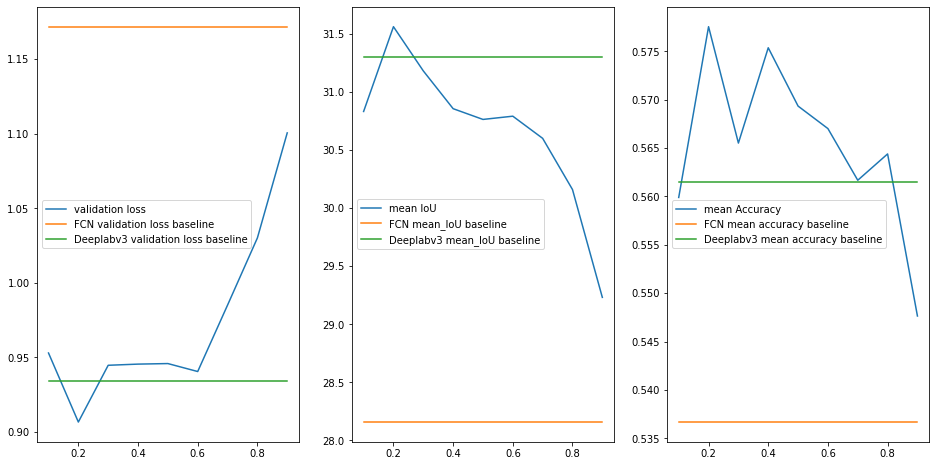

In [12]:
weight_list = np.arange(0.1,1,0.1)

fcn_avg_iou = 28.158802637430945
fcn_avg_test_loss =   1.1717317619919776
fcn_avg_accuracy =   0.536683030217886

deeplab_avg_iou =   31.302984534269143
deeplab_avg_test_loss =   0.9340236086249352
deeplab_avg_accuracy =   0.5614824333786964

validation_loss_list = [0.9529526843130589, 0.9066683161556721, 0.9447183390855789, 0.9455011916458607, 0.9458680933713913, 0.94053090685606, 0.9850528735816478, 1.0300854046940804, 1.1005251532196998]
mean_IoU_list = [30.830429841231602, 31.559891837786832, 31.17958349274247, 30.85451865852983, 30.762040403982972, 30.789905306514317, 30.599294530688226, 30.15877443255289, 29.231268362084766]
mean_accuracy_list = [0.5598943469524383, 0.5775440048575401, 0.5655154955685139, 0.5753650854527951, 0.5693372937738895, 0.5670112200379371, 0.5616726441979408, 0.5643930578827858, 0.5476417412459851]

from IPython.core.pylabtools import figsize
fig,ax = plt.subplots(1,3,figsize=(16,8))
ax[0].plot(weight_list,validation_loss_list,label = "validation loss")
ax[0].plot(weight_list,np.repeat(fcn_avg_test_loss,len(weight_list)),label = "FCN validation loss baseline")
ax[0].plot(weight_list,np.repeat(deeplab_avg_test_loss,len(weight_list)),label = "Deeplabv3 validation loss baseline")

ax[1].plot(weight_list,mean_IoU_list,label = "mean IoU")
ax[1].plot(weight_list,np.repeat(fcn_avg_iou,len(weight_list)),label = "FCN mean_IoU baseline")
ax[1].plot(weight_list,np.repeat(deeplab_avg_iou,len(weight_list)),label = "Deeplabv3 mean_IoU baseline")

ax[2].plot(weight_list,mean_accuracy_list,label = "mean Accuracy")
ax[2].plot(weight_list,np.repeat(fcn_avg_accuracy,len(weight_list)),label = "FCN mean accuracy baseline")
ax[2].plot(weight_list,np.repeat(deeplab_avg_accuracy,len(weight_list)),label = "Deeplabv3 mean accuracy baseline")

ax[2].legend()
ax[1].legend()
ax[0].legend()


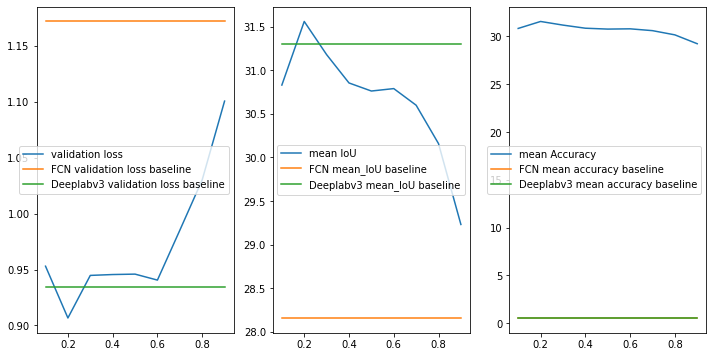

In [85]:
from IPython.core.pylabtools import figsize
fig,ax = plt.subplots(1,3,figsize=(12,6))
ax[0].plot(weight_list,validation_loss_list,label = "validation loss")
ax[0].plot(weight_list,np.repeat(fcn_avg_test_loss,len(weight_list)),label = "FCN validation loss baseline")
ax[0].plot(weight_list,np.repeat(deeplab_avg_test_loss,len(weight_list)),label = "Deeplabv3 validation loss baseline")

ax[1].plot(weight_list,mean_IoU_list,label = "mean IoU")
ax[1].plot(weight_list,np.repeat(fcn_avg_iou,len(weight_list)),label = "FCN mean_IoU baseline")
ax[1].plot(weight_list,np.repeat(deeplab_avg_iou,len(weight_list)),label = "Deeplabv3 mean_IoU baseline")

ax[2].plot(weight_list,mean_accuracy_list,label = "mean Accuracy")
ax[2].plot(weight_list,np.repeat(fcn_avg_accuracy,len(weight_list)),label = "FCN mean accuracy baseline")
ax[2].plot(weight_list,np.repeat(deeplab_avg_accuracy,len(weight_list)),label = "Deeplabv3 mean accuracy baseline")

ax[2].legend()
ax[1].legend()
ax[0].legend()

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 735, 512])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 538])


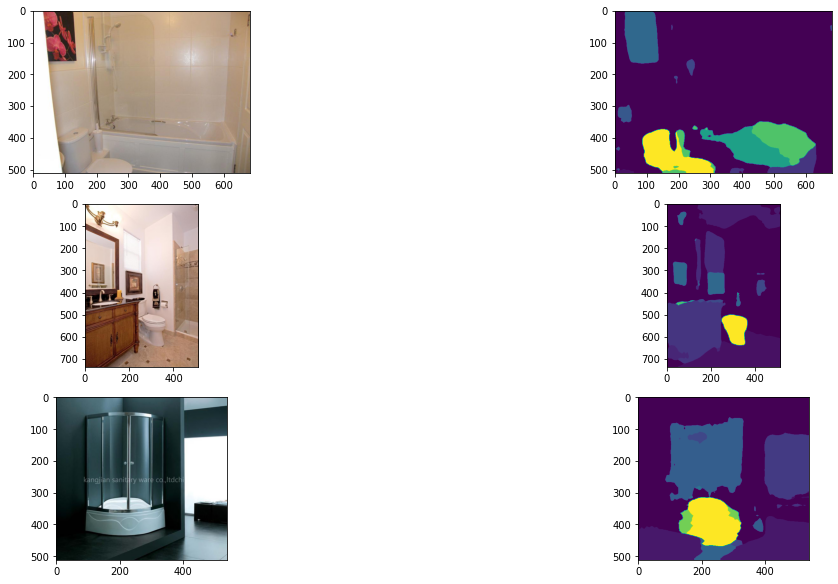

In [117]:
visualize_performance_on_sample_image(new_FCN_model,"training",1)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 735, 512])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 538])


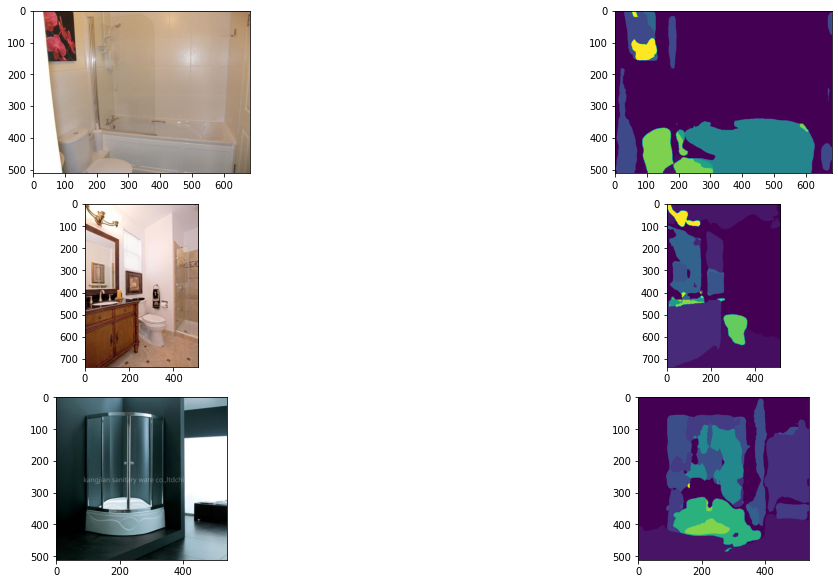

In [118]:
visualize_performance_on_sample_image(new_deeplabv3,"training",1)

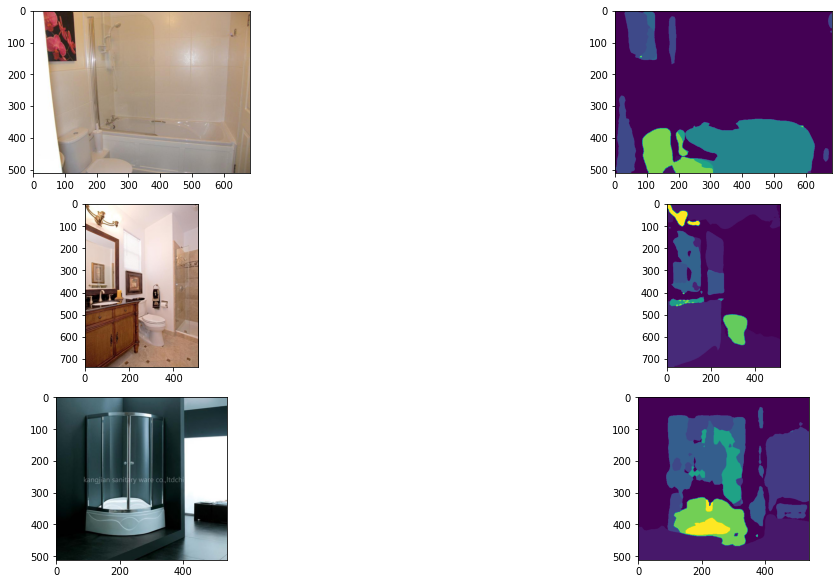

In [121]:
visualize_performance_on_sample_image_ensemble(new_FCN_model,new_deeplabv3,"training",1)

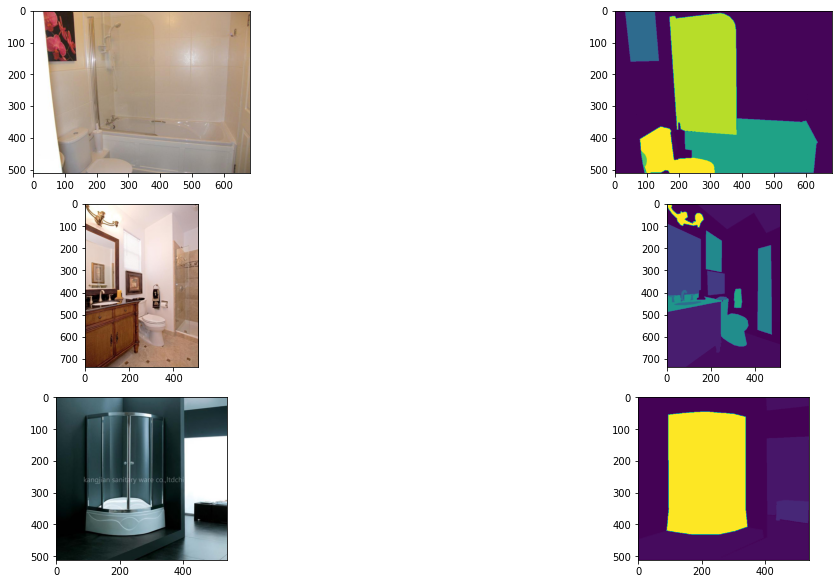

In [122]:
image_name_list = ["ADE_train_00000009","ADE_train_00000007","ADE_train_00000008"]
fig, axs = plt.subplots(len(image_name_list), 2, figsize=(16, 8), constrained_layout=True)
for i,image_name in enumerate(image_name_list):
  original_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","training",f"{image_name}.jpg")
  label_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR, "annotations", "training", f"{image_name}.png")
  original_img = Image.open(original_image).convert('RGB')
  mask_img = Image.open(label_image)

  axs[i,0].imshow(original_img)
  axs[i,0].grid(False)

  label_image = np.asarray(mask_img)
  axs[i,1].imshow(label_image)
  axs[i,1].grid(False)

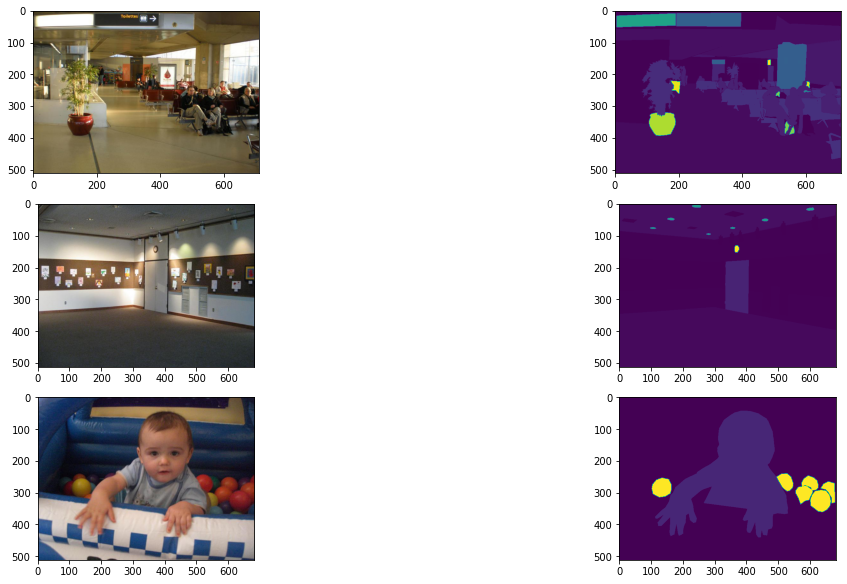

In [123]:
image_name_list = ["ADE_train_00000002","ADE_train_00000003","ADE_train_00000005"]
fig, axs = plt.subplots(len(image_name_list), 2, figsize=(16, 8), constrained_layout=True)
for i,image_name in enumerate(image_name_list):
  original_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR,"images","training",f"{image_name}.jpg")
  label_image = os.path.join(TARGET_GOOGLE_DRIVE_DIR, "annotations", "training", f"{image_name}.png")
  original_img = Image.open(original_image).convert('RGB')
  mask_img = Image.open(label_image)

  axs[i,0].imshow(original_img)
  axs[i,0].grid(False)

  label_image = np.asarray(mask_img)
  axs[i,1].imshow(label_image)
  axs[i,1].grid(False)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


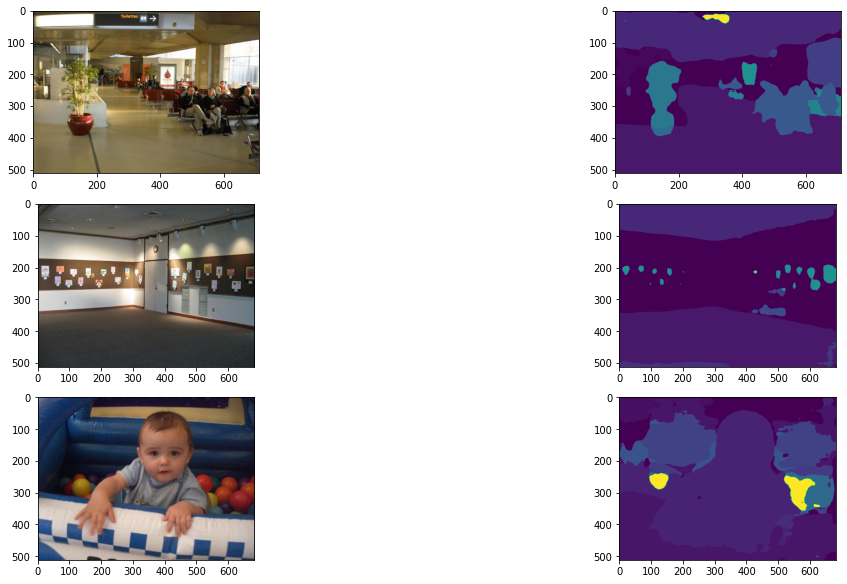

In [124]:
visualize_performance_on_sample_image(new_FCN_model,"training",0)

<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 711])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])
<class 'collections.OrderedDict'>
torch.Size([1, 150, 512, 683])


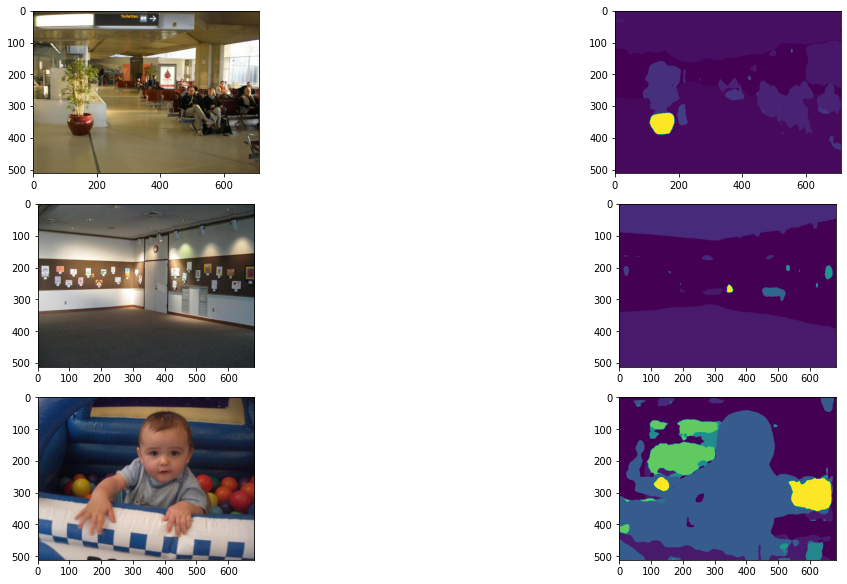

In [125]:
visualize_performance_on_sample_image(new_deeplabv3,"training",0)

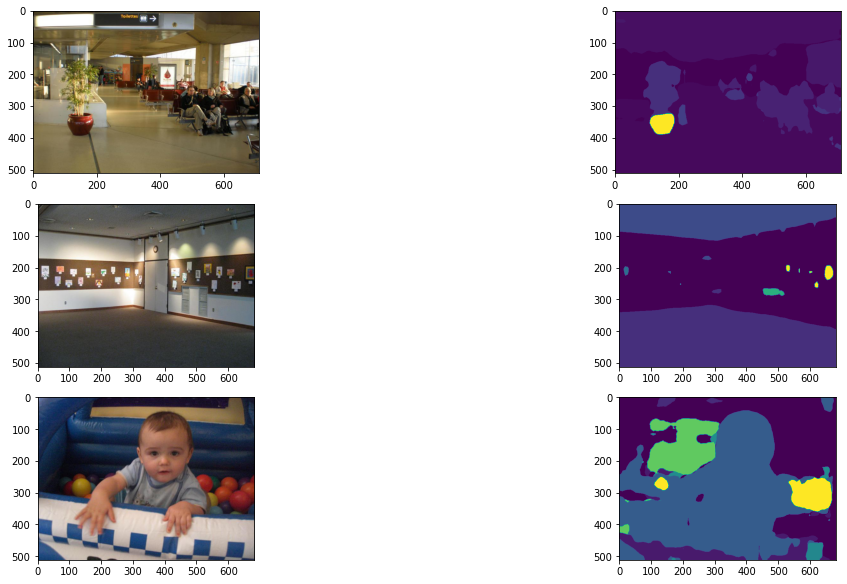

In [126]:
visualize_performance_on_sample_image_ensemble(new_FCN_model,new_deeplabv3,"training",0)